<a href="https://colab.research.google.com/github/JoumanaMaki/Face-Recognition/blob/main/FaceRecognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Computer Vision Master Class - Face recognition

## OpenCV

### Load the dataset

In [ ]:
from PIL import Image #to read image from dataset
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
path = '/content/drive/MyDrive/Computer Vision Masterclass/Datasets/yalefaces.zip'
zip_object = zipfile.ZipFile(file=path, mode='r') # r means read
zip_object.extractall('./')
zip_object.close()

#we have 15 faces to classify

### Preprocessing images

In [ ]:
import os #to list all the files in a directory
print(os.listdir('./yalefaces/train'))

['subject12.glasses.gif', 'subject13.leftlight.gif', 'subject07.sad.gif', 'subject07.glasses.gif', 'subject03.noglasses.gif', 'subject03.wink.gif', 'subject09.surprised.gif', 'subject14.noglasses.gif', 'subject04.rightlight.gif', 'subject10.happy.gif', 'subject15.happy.gif', 'subject10.sleepy.gif', 'subject02.noglasses.gif', 'subject09.noglasses.gif', 'subject02.surprised.gif', 'subject08.wink.gif', 'subject06.sleepy.gif', 'subject13.glasses.gif', 'subject08.sleepy.gif', 'subject08.centerlight.gif', 'subject06.centerlight.gif', 'subject07.sleepy.gif', 'subject01.sad.gif', 'subject09.wink.gif', 'subject10.leftlight.gif', 'subject10.glasses.gif', 'subject02.rightlight.gif', 'subject05.sad.gif', 'subject07.wink.gif', 'subject11.sleepy.gif', 'subject07.surprised.gif', 'subject06.wink.gif', 'subject03.surprised.gif', 'subject09.leftlight.gif', 'subject05.wink.gif', 'subject01.wink.gif', 'subject08.glasses.gif', 'subject15.glasses.gif', 'subject03.centerlight.gif', 'subject02.sad.gif', 'subj

In [ ]:
def get_image_data(): #read images
  paths = [os.path.join('./yalefaces/train', f) for f in os.listdir('./yalefaces/train')]
  #print(paths)
  faces = [] #pixels
  ids = [] #name of classes (ids of classes)
  for path in paths:
    #print(path)
    image = Image.open(path).convert('L') #convert to grayscale (L single channel)
    #print(type(image))
    #to send to open cv we need to convert it to numpy array
    image_np = np.array(image, 'uint8') #uint8 is the type of the image
    #print(type(image_np))
    id = int(os.path.split(path)[1].split('.')[0].replace('subject', ''))
    #print(id)
    ids.append(id)
    faces.append(image_np)
    #ids in list format so we need to convert it to numpy array
  return np.array(ids), faces

In [ ]:
ids, faces =get_image_data()

In [ ]:
ids

array([12, 13,  7,  7,  3,  3,  9, 14,  4, 10, 15, 10,  2,  9,  2,  8,  6,
       13,  8,  8,  6,  7,  1,  9, 10, 10,  2,  5,  7, 11,  7,  6,  3,  9,
        5,  1,  8, 15,  3,  2, 11,  3,  1, 14, 10, 14,  3,  5,  5,  3,  7,
        4, 15, 15,  8, 11, 14,  3,  9,  2,  5,  5,  6, 10,  6,  8, 13,  7,
        6,  2, 15, 14,  1, 14,  5,  6, 13, 13, 10, 11,  2, 12, 11,  6,  9,
        9,  7, 10, 10, 15,  1,  8,  9, 12, 13,  4,  4, 15, 14,  4,  4,  8,
        4,  8,  6,  4, 12,  2, 14, 11, 13, 12, 15, 12,  9, 12,  3, 11, 13,
        5,  1,  5, 12, 11, 14,  1,  1,  1,  7, 12,  2, 13, 15, 11,  4])

In [ ]:
len(set(ids)) , len(ids)

(15, 135)

In [ ]:
len(faces)

135

In [ ]:
faces[0] #pixels of the first image
faces[0].shape #dimensions of the image
#all images should have the same dimensions
#nb of pixels in each image is 243* 320

(243, 320)

### Train LBHP classifier

In [ ]:
#generate histograms for each one of the classes and store them into a file
# in order to compare stored histograms with the histograms of new images
#lbph = cv2.face.LBPHFaceRecognizer_create()
#by default :
#radius:1
#neighbors: 8
#grid_x : 8
#grid_y : 8
# lbph = cv2.face.LBPHFaceRecognizer_create(radius=2, neighbors=5, grid_x=5, grid_y=5)
# lbph = cv2.face.LBPHFaceRecognizer_create(radius=3, neighbors=12, grid_x=8, grid_y=8)
lbph = cv2.face.LBPHFaceRecognizer_create(radius=4, neighbors=14, grid_x=9, grid_y=9)

# 8 -> 8* 8 = 64 histograms for each face
lbph.train(faces, ids)
lbph.write('lbph_classifier.yml') # this file stored the histograms of each image

### Recognizing faces

In [ ]:
lbph_face_classifier = cv2.face.LBPHFaceRecognizer_create()
lbph_face_classifier.read('/content/lbph_classifier.yml')

In [ ]:
test_image = '/content/yalefaces/test/subject10.sad.gif'

array([[130, 130, 130, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 241, 255, 255],
       [255, 255, 255, ..., 234, 237, 252],
       [ 68,  68,  68, ...,  68,  68,  68]], dtype=uint8)
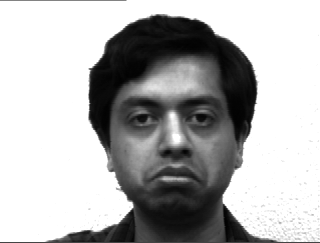

In [ ]:
image = Image.open(test_image).convert('L')
image_np = np.array(image, 'uint8')
image_np

In [ ]:
image_np.shape

(243, 320)

In [ ]:
prediction = lbph_face_classifier.predict(image_np)
prediction
#(10, 6.384336446373091) 10 is the class, 6.384336446373091 is the confidence

(10, 0.5484201951486197)

In [ ]:
expected_output = int(os.path.split(test_image)[1].split('.')[0].replace('subject', ''))
expected_output

10

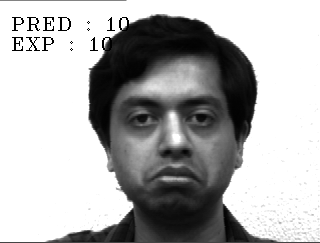

In [ ]:
cv2.putText(image_np, 'PRED : ' + str(prediction[0]), (10,30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255,0))
cv2.putText(image_np, 'EXP : ' + str(expected_output), (10,50), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255,0))
cv2_imshow(image_np)

### Evaluating the face classifier

In [ ]:
paths = [os.path.join('/content/yalefaces/test', f) for f in os.listdir('/content/yalefaces/test')]
predictions = []
expected_outputs = []
# print(paths)
for path in paths:
  # print(path)
  image = Image.open(path).convert('L')
  image_np = np.array(image, 'uint8')
  prediction , _= lbph_face_classifier.predict(image_np)
  predictions.append(prediction)
  expected_output = int(os.path.split(path)[1].split('.')[0].replace('subject', ''))
  expected_outputs.append(expected_output)

In [ ]:
type(predictions)

list

In [ ]:
predictions = np.array(predictions)
expected_outputs = np.array(expected_outputs)

In [ ]:
type(predictions)

numpy.ndarray

In [ ]:
predictions

array([14,  9,  8, 13,  9,  7, 12,  5,  9, 14, 11,  3,  6, 12, 15, 10,  7,
        9, 14,  4,  4,  3, 12,  4,  4,  7, 11,  1,  5, 13])

In [ ]:
expected_outputs

array([14,  7,  8, 13,  9,  7,  2,  5,  3,  6, 11,  3,  6, 12, 15, 10,  9,
        4, 14,  1,  4,  8, 12, 10,  2, 15, 11,  1,  5, 13])

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(expected_outputs, predictions)

0.6333333333333333

In [ ]:
len(predictions)

30

In [ ]:
count = 0
for i in range(len(predictions)):
  if predictions[i] == expected_outputs[i]:
    count +=1
print(count)

20


In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(expected_outputs, predictions)

In [ ]:
cm

array([[2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]])

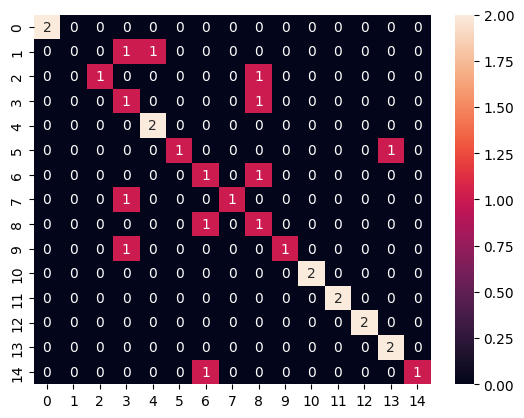

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True);


## Dlib

In [ ]:
import dlib
import cv2
from google.colab.patches import cv2_imshow

### Detecting facial points

In [ ]:
face_detector = dlib.get_frontal_face_detector()
#68 points in the face to consider te bounding box
points_detectors = dlib.shape_predictor('/content/drive/MyDrive/Computer Vision Masterclass/Weights/shape_predictor_68_face_landmarks.dat')

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')

points[(429, 51), (429, 56), (429, 60), (430, 65), (431, 69), (434, 73), (437, 77), (441, 80), (446, 82), (450, 81), (454, 78), (458, 75), (460, 71), (462, 66), (463, 62), (463, 57), (463, 53), (433, 48), (435, 46), (438, 45), (442, 45), (445, 47), (451, 47), (453, 46), (456, 46), (459, 47), (461, 49), (447, 50), (447, 52), (448, 55), (448, 58), (444, 60), (445, 61), (447, 61), (449, 61), (451, 60), (437, 50), (439, 49), (441, 49), (443, 50), (441, 51), (439, 51), (451, 51), (453, 50), (456, 50), (457, 51), (456, 52), (453, 52), (438, 65), (441, 64), (444, 64), (447, 65), (449, 64), (452, 65), (454, 66), (452, 70), (449, 71), (447, 71), (444, 71), (441, 69), (439, 66), (444, 65), (447, 65), (449, 65), (454, 66), (449, 69), (447, 70), (444, 69)]
68
points[(668, 102), (668, 106), (668, 110), (668, 115), (670, 119), (672, 123), (675, 127), (679, 129), (683, 130), (687, 129), (691, 127), (695, 123), (698, 119), (699, 115), (700, 110), (701, 106), (701, 101), (670, 97), (672, 95), (675, 94)

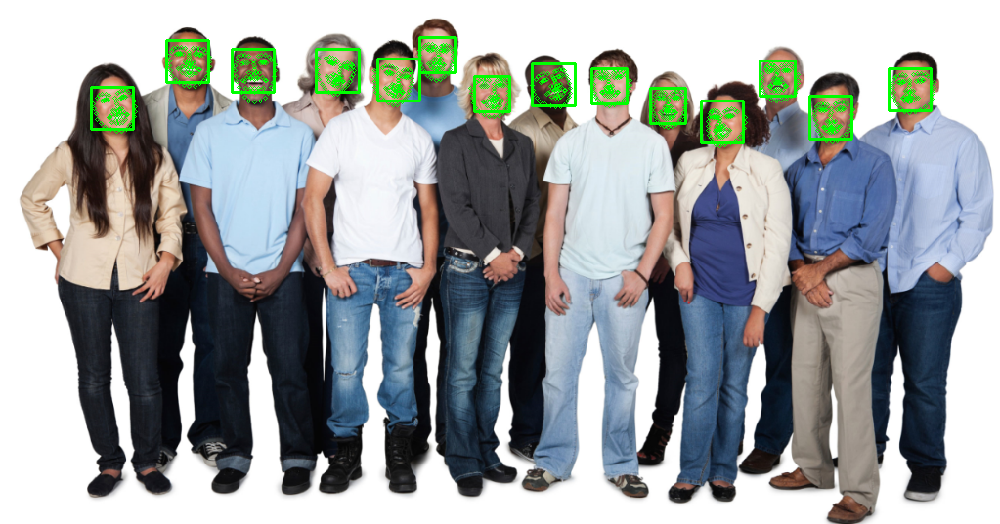

In [ ]:
face_detections = face_detector(image, 1) #1 is the scale of the image
for face in face_detections:
  points = points_detectors(image, face)
  print(points.parts())
  print(len(points.parts()))
  for point in points.parts():
    cv2.circle(image, (point.x, point.y), 2, (0,255,0), 1)
  l,t,r,b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l,t), (r,b), (0,255,0), 2)
cv2_imshow(image)

In [ ]:
#dlib has a detector that predicts 5 points so the processing is faster


### Detetcting facial descriptors

In [ ]:
import os

In [ ]:
face_detector = dlib.get_frontal_face_detector()
# Resnet: https://arxiv.org/abs/1512.03385
#68 points in the face to consider te bounding box
points_detectors = dlib.shape_predictor('/content/drive/MyDrive/Computer Vision Masterclass/Weights/shape_predictor_68_face_landmarks.dat')
face_descriptor_extractor = dlib.face_recognition_model_v1('/content/drive/MyDrive/Computer Vision Masterclass/Weights/dlib_face_recognition_resnet_model_v1.dat')

In [ ]:
index={}
idx = 0
face_descriptors = None
paths = [os.path.join('/content/yalefaces/train', f) for f in os.listdir('/content/yalefaces/train')]

In [ ]:
paths

['/content/yalefaces/train/subject12.glasses.gif',
 '/content/yalefaces/train/subject13.leftlight.gif',
 '/content/yalefaces/train/subject07.sad.gif',
 '/content/yalefaces/train/subject07.glasses.gif',
 '/content/yalefaces/train/subject03.noglasses.gif',
 '/content/yalefaces/train/subject03.wink.gif',
 '/content/yalefaces/train/subject09.surprised.gif',
 '/content/yalefaces/train/subject14.noglasses.gif',
 '/content/yalefaces/train/subject04.rightlight.gif',
 '/content/yalefaces/train/subject10.happy.gif',
 '/content/yalefaces/train/subject15.happy.gif',
 '/content/yalefaces/train/subject10.sleepy.gif',
 '/content/yalefaces/train/subject02.noglasses.gif',
 '/content/yalefaces/train/subject09.noglasses.gif',
 '/content/yalefaces/train/subject02.surprised.gif',
 '/content/yalefaces/train/subject08.wink.gif',
 '/content/yalefaces/train/subject06.sleepy.gif',
 '/content/yalefaces/train/subject13.glasses.gif',
 '/content/yalefaces/train/subject08.sleepy.gif',
 '/content/yalefaces/train/subj

<class '_dlib_pybind11.vector'>
128
-0.023708
0.100386
0.0629414
0.0202445
-0.0432601
-0.0716651
-0.0507419
-0.0623956
0.195442
-0.0352981
0.202646
0.0248368
-0.222043
-0.0155959
-0.153912
0.158075
-0.119337
-0.0371056
-0.134333
-0.134445
0.0733378
0.0976889
0.0109429
-0.0633793
-0.178663
-0.214177
-0.106001
-0.0561479
0.0920911
-0.095645
0.0420189
0.12723
-0.201173
-0.0766016
0.0505638
0.0109335
-0.051582
-0.0538509
0.258816
0.129338
-0.0869856
0.157423
0.0447356
0.258291
0.178123
0.0155739
0.0474939
-0.125661
0.0834847
-0.237201
0.0711246
0.167946
0.120563
0.13212
0.111315
-0.177348
-0.00142959
0.12534
-0.204643
0.136709
0.054717
-0.0694377
-0.0899179
-0.0299928
0.0538992
0.0623372
-0.0968911
-0.0633549
0.241706
-0.126357
0.0387511
0.12354
-0.066811
-0.159436
-0.271157
0.087758
0.455077
0.177027
-0.160124
-0.0060797
-0.0151626
-0.0643116
0.00787923
0.0369637
-0.106945
-0.0937494
0.00541444
0.0826684
0.15531
0.0523992
-0.0588631
0.258065
0.0595196
0.0151039
-0.0236554
0.0218167
-0.094

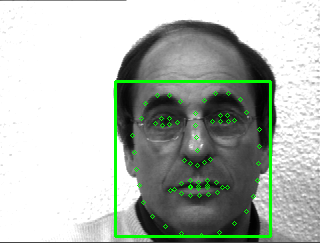

<class '_dlib_pybind11.vector'>
128
-0.153278
0.135351
0.0880455
0.000686243
0.00717368
-0.0296212
-0.00116932
-0.0627754
0.126468
-0.00652831
0.178823
-0.0272936
-0.185266
-0.113871
0.0127214
0.10278
-0.154789
-0.128057
-0.144376
-0.13943
0.0264725
0.0263844
0.0358426
0.0466499
-0.15144
-0.329515
-0.0494731
-0.189663
0.0617127
-0.124201
-0.036759
-0.0504291
-0.216426
-0.0105645
-0.0935707
-0.0148193
0.0410808
-0.0594306
0.128648
0.0249419
-0.130698
-0.0243767
0.0696505
0.197115
0.208108
0.0609568
0.0303412
-0.00417361
-0.0038799
-0.162907
0.0908641
0.0849873
0.0952584
0.0475353
0.0600391
-0.14397
-0.0594803
-0.0480096
-0.142514
0.0677057
0.0221549
-0.0400156
-0.125066
0.00753988
0.220604
0.0981485
-0.0753197
-0.0882066
0.127717
-0.188135
-0.00944281
0.0803837
-0.0596922
-0.111328
-0.261211
0.115705
0.431605
0.119121
-0.180718
0.00755338
-0.15347
-0.0621881
0.0353729
0.0547452
-0.127154
0.0431399
-0.112069
0.0812423
0.156226
0.0206639
-0.0412225
0.180922
0.0063813
-0.0319252
-0.0038904

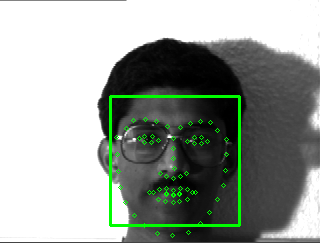

<class '_dlib_pybind11.vector'>
128
-0.153746
0.0560504
0.0587342
-0.0173696
-0.0394105
-0.0368406
0.0536359
-0.098979
0.231944
-0.0623824
0.200371
-0.0328276
-0.227429
-0.115012
0.00928448
0.0906977
-0.174816
-0.133472
-0.058742
-0.129345
0.015598
-0.00729623
0.053753
0.00877648
-0.204628
-0.371542
-0.079113
-0.160881
-0.010098
-0.0949794
0.00229228
0.0328227
-0.250126
-0.109032
-0.121671
0.0358259
-0.0412013
-0.0240229
0.14854
-0.00394757
-0.110518
-0.0108194
0.0221372
0.271879
0.106868
0.0163711
0.00503977
0.0114886
0.0154868
-0.25195
0.0740728
0.111426
0.021936
0.0398998
0.0413011
-0.073083
-0.0424473
0.043997
-0.180856
0.0876102
0.0939129
0.0122435
-0.0633565
0.00904795
0.264027
0.139611
-0.0809061
-0.0186276
0.118303
-0.115224
0.00799732
0.00561489
-0.106493
-0.184079
-0.271212
0.133268
0.408983
0.0765921
-0.113668
-0.0213005
-0.185131
-0.00397897
0.0672549
-0.0290274
-0.0847383
0.0626359
-0.129135
0.134265
0.157318
0.0176431
-0.0693405
0.227612
0.0372462
-0.0147187
0.0471248
0.0

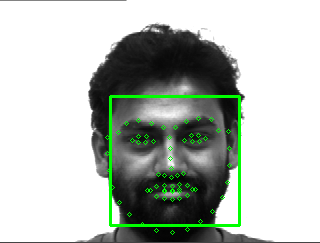

<class '_dlib_pybind11.vector'>
128
-0.101223
0.113745
0.0931064
-0.0188699
-0.0454189
-0.0297677
0.0498934
-0.0336422
0.209438
-0.0493188
0.238468
0.0169977
-0.199382
-0.122009
0.0116419
0.112373
-0.141799
-0.1318
-0.104647
-0.104675
0.00191003
-0.00764489
0.0424684
-0.00627334
-0.18451
-0.398303
-0.0624109
-0.11877
-6.3017e-05
-0.153143
0.0213045
0.0513421
-0.176926
-0.056909
-0.105869
0.0740939
-0.0908498
-0.0914425
0.194587
0.0430058
-0.155041
-0.0568691
-0.015828
0.317288
0.193157
-0.0175367
0.0547788
0.0381692
0.0171532
-0.243665
0.0767974
0.113139
0.0792018
0.0657492
0.0390883
-0.069694
-0.0345053
0.0579325
-0.168182
0.0130997
0.0397639
-0.0811863
-0.0874004
-0.0286252
0.256758
0.156138
-0.0896067
-0.0324916
0.134118
-0.156988
-0.0393002
0.000630688
-0.113527
-0.1664
-0.268542
0.102939
0.363274
0.112563
-0.146385
-0.0352611
-0.108383
-0.0191283
0.0365478
0.0850583
-0.119782
0.0811288
-0.105478
0.112035
0.166959
-0.00256985
-0.0879687
0.205063
0.0070409
-0.0136356
0.0384453
-0.02

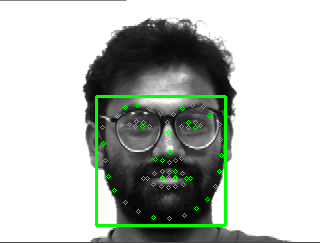

<class '_dlib_pybind11.vector'>
128
-0.193587
0.157833
0.0432411
-0.0783958
-0.170128
-0.0130699
-0.0851414
-0.0955404
0.123158
-0.0849763
0.226275
-0.00235602
-0.156115
-0.0399969
-0.0477976
0.142029
-0.15888
-0.117538
-0.0956909
-0.106217
0.0465363
0.0176341
-0.00355873
0.0723187
-0.194831
-0.27615
-0.106073
-0.0736536
0.11521
-0.0432612
-0.107223
0.00348422
-0.186808
-0.103475
0.0402322
0.07935
0.0391479
0.0114105
0.110189
-0.00480095
-0.126502
0.0991851
0.144103
0.294197
0.196521
0.115845
0.0794135
-0.0679365
0.0610997
-0.182282
0.0283902
0.130014
0.102217
0.0501379
0.0564232
-0.123222
0.0104852
0.119838
-0.155055
0.108459
0.10469
-0.0326788
-0.0717809
-0.0560825
0.254562
0.149008
-0.118798
-0.175747
0.146448
-0.164997
-0.106543
0.0296345
-0.112883
-0.0900623
-0.297435
0.0270642
0.468398
0.216052
-0.204834
0.0381031
-0.0824519
-0.0130104
0.0844353
0.0454364
-0.106932
-0.0358924
-0.11743
0.0467617
0.232906
0.0213173
0.0288349
0.167776
0.12195
0.0115397
0.00606339
0.0980914
-0.198712

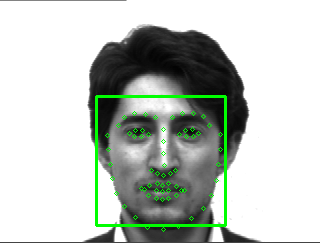

<class '_dlib_pybind11.vector'>
128
-0.142796
0.184575
0.0799067
-0.0557718
-0.175505
0.00500635
-0.0916124
-0.0692026
0.136783
-0.0740182
0.21616
-0.0285746
-0.161096
0.0082792
-0.0156446
0.125093
-0.125657
-0.106851
-0.115779
-0.105571
-0.00680167
-0.0246317
-0.0153266
0.0874486
-0.171494
-0.277874
-0.0837915
-0.110822
0.0837475
-0.0607964
-0.123124
-0.0484525
-0.214033
-0.125168
0.0221788
0.0431322
-0.0158236
0.0361994
0.113168
-0.034645
-0.144704
0.104464
0.0848468
0.280531
0.186364
0.12686
0.0705661
-0.0594332
0.0789893
-0.199218
0.0922704
0.113842
0.148566
0.0345327
0.0774184
-0.145662
-0.0243174
0.142994
-0.136942
0.132012
0.118604
0.0132382
-0.102988
-0.0883964
0.287873
0.166202
-0.131063
-0.168358
0.131747
-0.141975
-0.0382556
0.0956428
-0.0995446
-0.120714
-0.272234
0.0713682
0.466851
0.181816
-0.226594
-0.0464209
-0.0916321
0.0139386
0.0548646
0.0273313
-0.12123
-0.0205727
-0.0705953
0.0637837
0.198791
0.000675052
0.0234253
0.177063
0.0843383
0.000370115
-0.0380697
0.0732723

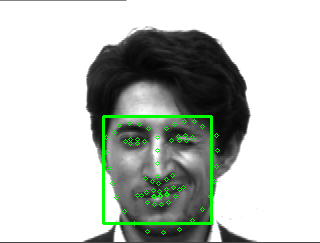

<class '_dlib_pybind11.vector'>
128
-0.169284
0.0545201
0.0614159
-0.0452593
-0.0902747
-0.000830904
0.0042212
-0.0240941
0.153804
-0.0540433
0.191484
-0.00435505
-0.283239
0.0407939
-0.0365572
0.116963
-0.140037
-0.0514846
-0.139908
-0.138493
0.142614
0.124029
0.000579428
0.0212513
-0.19893
-0.247333
-0.0986952
-0.114342
0.0369048
-0.0897871
-0.0123772
-0.00587901
-0.171836
-0.0783682
0.00276512
0.010841
-0.053054
-0.101705
0.0592465
-0.000817437
-0.116531
0.0353119
0.0902054
0.228514
0.0994329
0.0774883
0.0607623
-0.0736755
0.00529136
-0.242433
0.0350309
0.0961418
0.0517605
0.0832725
0.104419
-0.183475
0.0155204
0.150287
-0.164515
0.12924
0.107379
-0.0209384
0.0189862
-0.0395447
0.153489
0.0779181
-0.117767
-0.0988305
0.113222
-0.125938
-0.0397185
0.0450714
-0.107102
-0.197515
-0.223367
0.0864395
0.462325
0.167632
-0.10888
0.0102798
-0.10161
0.0032415
0.0542567
-0.00484797
-0.106283
-0.0406767
-0.129775
0.0876821
0.195173
-0.000432596
0.00757184
0.210758
0.0589103
-0.0723051
0.022645

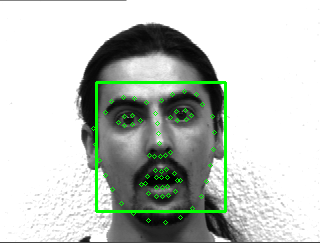

<class '_dlib_pybind11.vector'>
128
-0.151492
0.0811991
0.0258108
-0.0835402
-0.159938
-0.0609293
-0.0245022
-0.125745
0.121132
-0.0884811
0.192137
-0.11717
-0.16932
-0.0846238
-0.0458499
0.18914
-0.202912
-0.143728
-0.0626342
0.0139829
0.0901943
-0.0181544
-0.00548413
0.0118486
-0.100549
-0.327246
-0.083964
-0.0889599
0.0693475
-0.0882636
-0.0913742
0.0319735
-0.220586
-0.111652
-0.00253469
0.0832719
0.00620531
-0.0636423
0.141726
0.00756662
-0.235258
0.0265398
0.0418203
0.223914
0.210716
0.0474728
0.00872294
-0.114808
0.0978278
-0.162957
0.00339575
0.0864047
0.0370605
0.0506289
-0.00111713
-0.122576
0.0321817
0.0889137
-0.137853
0.0135978
0.131453
-0.0894829
-0.0413277
-0.0964771
0.245928
0.0616663
-0.0709627
-0.142868
0.124555
-0.0985127
-0.0657874
0.0169443
-0.129047
-0.103427
-0.286249
-0.00529481
0.395592
0.0888381
-0.203663
0.0185275
-0.0655491
0.0168929
0.158508
0.112738
-0.00490393
0.0497794
-0.102922
0.00707111
0.197879
-0.0732535
0.0067128
0.177288
-0.00562973
0.0534042
0.04

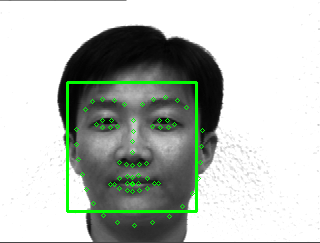

<class '_dlib_pybind11.vector'>
128
-0.143986
0.160326
0.051673
-0.0615607
-0.0478995
-0.0696884
-0.0484367
-0.114262
0.104916
-0.045872
0.32585
-0.0545364
-0.174244
-0.217989
-0.0351726
0.189629
-0.15597
-0.127579
0.0102597
-0.0126595
0.15718
-0.011119
-0.0220575
0.0600264
-0.119058
-0.328024
-0.102471
-0.111952
0.0283556
-0.081724
-0.0788609
-0.0368794
-0.233773
-0.108013
-0.0259156
0.0575506
-0.00371802
-0.0638555
0.146488
0.0282208
-0.168687
0.0110379
0.0145435
0.289727
0.20277
0.0243974
0.0821835
-0.124355
0.0547239
-0.10963
0.0518294
0.1238
0.122132
0.0577226
-0.0549825
-0.123668
-0.0238797
0.112922
-0.179815
0.0159183
0.093516
-0.0614872
-0.086778
-0.111496
0.272018
0.0685985
-0.155427
-0.163235
0.152322
-0.0965498
-0.0862209
0.0243497
-0.173628
-0.181095
-0.341201
0.118525
0.381911
0.121083
-0.240022
0.0382399
-0.117749
0.0366948
0.125601
0.144455
0.0355902
0.0602608
-0.0959822
0.0177388
0.164313
-0.0676626
-0.030088
0.200427
-0.0209208
0.0685816
0.00505274
0.028913
-0.0470468


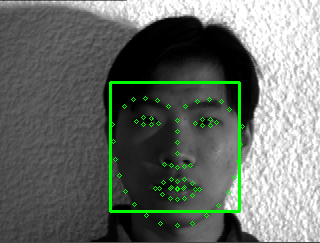

<class '_dlib_pybind11.vector'>
128
-0.166163
0.0635079
0.0554766
-0.0201057
0.0566647
-0.123039
-0.0218461
-0.150433
0.134147
-0.168247
0.242642
-0.0450479
-0.177221
-0.122917
0.0349563
0.0823924
-0.190995
-0.139902
-0.042421
-0.116745
0.0311551
-0.0278885
0.00745156
0.00807769
-0.199503
-0.33413
-0.122789
-0.14401
-0.000497535
0.0662668
0.0476091
-0.0047324
-0.244698
-0.0244557
-0.0155404
0.00664867
0.0698913
0.055929
0.181093
-0.00305005
-0.106572
-0.0587658
0.00484965
0.245845
0.103966
0.0453478
0.0150872
-0.0585118
0.011206
-0.207846
0.0728426
0.122487
0.110447
0.0273096
0.0754559
-0.0945303
0.0244936
-0.0245298
-0.162454
0.0808651
0.0796056
-0.0323725
-0.0845517
-0.0196145
0.273753
0.086387
-0.140045
-0.0571983
0.181025
-0.151574
-0.00613337
0.0262069
-0.0627587
-0.188964
-0.324328
0.0385792
0.398662
0.181079
-0.2079
0.0378699
-0.175866
-0.0112948
0.127501
0.0300694
-0.0773122
0.0682928
-0.0572362
0.0806937
0.17279
0.0179845
-0.084031
0.225952
-0.0351875
0.036666
0.0206307
-0.017

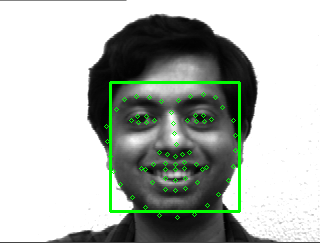

<class '_dlib_pybind11.vector'>
128
-0.179751
0.0769367
0.0181264
-0.0196402
-0.103804
-0.0134987
-0.0414885
-0.0673317
0.100765
-0.100472
0.101388
-0.0930757
-0.23463
-0.023163
0.0286874
0.158369
-0.140946
-0.137975
-0.145806
-0.12338
0.032443
-0.00990107
-0.0500992
0.0274832
-0.168482
-0.300705
-0.064921
-0.0887137
0.000225686
-0.0710755
-0.0669079
0.0255626
-0.20242
-0.115641
0.0257288
0.00325808
-0.0194759
-0.0152825
0.149984
-0.00223758
-0.173669
0.0366531
0.110168
0.260036
0.173789
0.135138
-0.032695
-0.0228334
0.139061
-0.292091
0.0784698
0.119252
0.0452915
0.0443876
0.120151
-0.0969147
0.00761953
0.0704061
-0.181368
0.0830212
0.0921464
-0.0602001
-0.0931053
-0.102061
0.172938
0.113761
-0.0705279
-0.130586
0.176137
-0.126342
-0.0466183
0.024587
-0.0640488
-0.147496
-0.321542
0.0577913
0.402197
0.158718
-0.118262
0.0141279
-0.027581
-0.0554587
0.0768116
0.0103907
-0.0804989
-0.0602753
-0.0148437
0.0658354
0.206316
0.0166475
-0.00947937
0.199855
0.0344452
-0.0551505
-0.00127456
0.

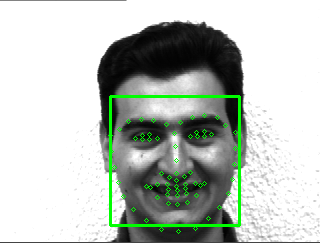

<class '_dlib_pybind11.vector'>
128
-0.17542
0.105665
0.104717
0.0321768
0.0586279
-0.125384
0.00833529
-0.120822
0.083056
-0.0603124
0.244452
-0.0458868
-0.173971
-0.161476
0.0175606
0.119229
-0.186915
-0.132147
-0.0322787
-0.113932
0.0204628
-0.0297814
0.0342605
-0.00221071
-0.157862
-0.298426
-0.0683232
-0.146004
0.0200062
-0.0214594
0.0628322
-0.0224369
-0.221507
-0.016742
-0.0615727
0.000588946
0.043573
0.0416238
0.180919
0.00707262
-0.088134
-0.0582523
0.00754207
0.29311
0.193393
0.0647413
0.0116691
-0.0387741
-0.00698456
-0.23292
0.0521433
0.0995884
0.114151
0.0218698
0.0699452
-0.0613738
-0.00530633
-0.0233303
-0.170332
0.0543503
0.0598591
0.00502432
-0.045349
-0.0264539
0.285401
0.0504355
-0.12513
0.0132742
0.176446
-0.141298
-0.0457883
0.0190115
-0.0356216
-0.166971
-0.328761
0.0493785
0.385074
0.159947
-0.19319
0.0237526
-0.151886
-0.0225545
0.0947474
0.0199074
-0.0949568
0.0353835
-0.0822897
0.058615
0.145455
0.00716929
-0.061426
0.181703
-0.0235794
-0.0102952
-0.00664309
-

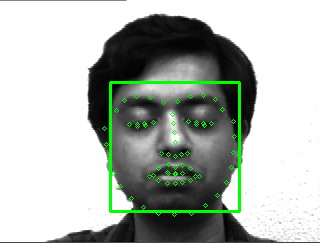

<class '_dlib_pybind11.vector'>
128
-0.169169
0.0787751
-0.0103191
-0.0436461
-0.126196
-0.0967652
0.0206225
-0.0842408
0.185665
0.0455905
0.251941
-0.0356076
-0.24597
-0.0517661
-0.0339929
0.0980549
-0.155495
0.00905179
-0.101528
-0.118586
0.0681307
0.00522052
0.0325966
0.0363
-0.135501
-0.309162
-0.112004
-0.0969536
-0.00276534
-0.133184
0.0175191
0.0962285
-0.236772
-0.136452
-0.0326593
0.07736
-0.0982615
-0.0383256
0.149414
0.0378342
-0.0965153
0.0809663
0.128463
0.226694
0.196605
0.0601085
0.0293534
-0.0438133
0.0822723
-0.214055
0.0625032
0.149538
0.127904
0.0588587
0.0921308
-0.167033
-0.0190701
0.0695286
-0.203405
0.0945755
0.121565
-0.0434331
-0.080692
-0.0258404
0.190978
0.132286
-0.136129
-0.0660853
0.123657
-0.106433
0.00260514
0.0994559
-0.123421
-0.236238
-0.263015
0.175137
0.446586
0.0873239
-0.145462
-0.0373956
-0.139204
-0.0799298
0.0056757
0.0215357
-0.0395926
-0.0900984
-0.163379
0.0651865
0.143448
-0.0181803
-0.0215808
0.236398
0.0448299
0.00876558
-0.0367035
0.1104

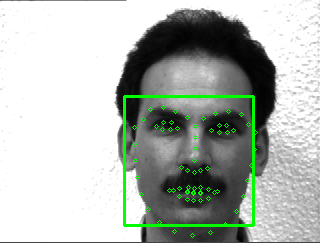

<class '_dlib_pybind11.vector'>
128
-0.167233
0.0544275
0.119507
-0.0319652
-0.0821191
-0.00151721
-0.0154876
-0.0151342
0.160905
-0.0384694
0.203045
-0.0137886
-0.26396
0.00911986
-0.0314896
0.130355
-0.112488
-0.0810358
-0.126874
-0.087811
0.100038
0.141666
0.00503631
0.00301611
-0.173081
-0.299433
-0.0858741
-0.15414
0.0251471
-0.0708058
-0.0150177
0.0159592
-0.170282
-0.112595
-0.0132085
-0.00546553
-0.0988956
-0.11906
0.119167
0.0232493
-0.137705
0.0270279
0.0818645
0.253677
0.103269
0.0696049
0.0848702
-0.0389535
0.00102341
-0.25608
0.0304273
0.113899
0.0830672
0.0891103
0.117893
-0.15031
0.0634611
0.145347
-0.211719
0.138685
0.0954711
-0.0396428
0.0410443
0.00194828
0.178803
0.0716133
-0.061398
-0.0713807
0.115021
-0.101713
-0.0612844
0.0641799
-0.129809
-0.192158
-0.244755
0.0525979
0.473654
0.172003
-0.124797
0.028628
-0.0964342
-0.0248007
0.0646791
0.00371769
-0.0865287
-0.0622707
-0.1359
0.0428676
0.199478
0.0187517
-0.0096653
0.181652
0.0844419
-0.100895
0.0328721
0.0234854

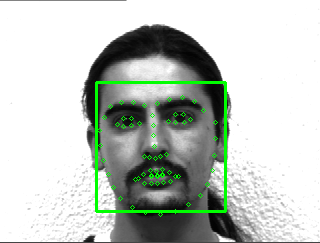

<class '_dlib_pybind11.vector'>
128
-0.182629
0.105204
-0.040393
-0.0276321
-0.118506
-0.00715289
-0.0110515
-0.0574896
0.158922
0.00536754
0.248637
-0.0614709
-0.272531
-0.0170917
-0.0449418
0.131973
-0.172427
0.0336122
-0.144198
-0.139958
0.0937246
0.0775981
-0.0130409
0.028261
-0.190856
-0.306069
-0.0407225
-0.032187
0.0162327
-0.124629
-0.00864278
0.128399
-0.199994
-0.0686022
0.0109689
0.0607806
-0.067206
-0.0288592
0.128468
0.0667015
-0.0798854
0.063116
0.0788599
0.256312
0.156775
0.00104072
0.0338314
-0.0991117
0.0573517
-0.271299
0.00140104
0.182865
0.0859006
0.0500973
0.0855076
-0.151482
-0.0524175
0.126493
-0.143059
0.121802
0.11498
-0.081747
-0.0775004
-0.0975033
0.138725
0.0978475
-0.142905
-0.0665078
0.0980366
-0.0444178
-0.000363875
0.0497497
-0.0709142
-0.289334
-0.251801
0.157361
0.417268
0.147708
-0.188653
0.00288724
-0.120376
-0.0620425
0.0687933
-0.00354511
-0.078888
-0.113488
-0.103071
0.122037
0.189173
-0.0214616
0.0164317
0.266399
0.0359455
-0.021415
-0.0230397
0.

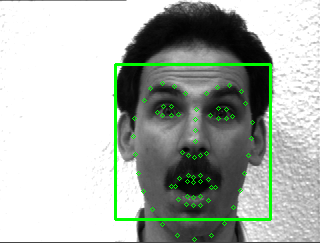

<class '_dlib_pybind11.vector'>
128
-0.144073
0.0779386
0.0535603
-0.0755011
-0.0505742
-0.0034321
-0.114843
-0.133903
0.0722733
-0.136527
0.192082
-0.0546544
-0.234308
-0.0964156
-0.0342478
0.171229
-0.11763
-0.142953
-0.0362432
-0.013424
0.0543458
0.0250303
0.0167305
0.0587296
-0.150471
-0.310878
-0.1106
-0.0266096
-0.0356078
-0.0764024
-0.0439952
0.0627095
-0.1739
-0.0216464
0.0188953
0.128755
-0.000691429
-0.00528188
0.176264
0.0191698
-0.173876
0.047049
0.103811
0.262476
0.204875
0.0581544
0.0331535
-0.121951
0.032636
-0.182255
0.0260415
0.132331
0.0543148
0.07513
0.00710317
-0.115572
0.0312151
0.0543628
-0.0782108
0.0498098
0.0771543
-0.0638475
-0.0344756
-0.0284036
0.226007
0.0376422
-0.136374
-0.185698
0.0904389
-0.138004
-0.121816
0.0839423
-0.150544
-0.112528
-0.33983
0.0252589
0.408381
0.0980384
-0.165856
0.0688111
-0.0540252
-0.0567942
0.0751752
0.0949072
-0.065063
-0.0282803
-0.0560178
0.0749083
0.245846
0.0146933
-0.0338429
0.167104
0.0359636
0.0863345
0.0250601
0.0840579

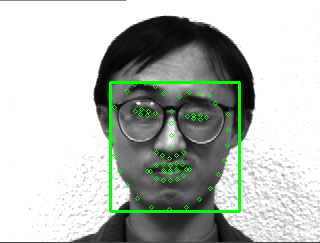

<class '_dlib_pybind11.vector'>
128
-0.165876
0.129402
0.0491408
-0.0283607
-0.0489911
-0.0641859
-0.0521471
-0.153809
0.129193
-0.0329778
0.30461
-0.0850511
-0.193763
-0.137969
-0.0135967
0.146347
-0.181726
-0.124023
-0.0419655
-0.0128554
0.103588
-0.00457291
0.0342165
0.008924
-0.135784
-0.311563
-0.0975947
-0.129858
0.0567344
-0.0331873
-0.0673541
0.0194673
-0.24737
-0.162073
0.0444825
0.099827
-0.0380461
0.000841133
0.17315
-0.00968486
-0.172417
0.0372136
0.0720133
0.269254
0.18407
0.104934
-0.0172535
-0.10624
0.0773206
-0.179225
0.0482936
0.151591
0.138527
0.0720279
0.0115681
-0.0961269
0.0414941
0.063631
-0.176744
0.000852846
0.117768
-0.0957642
-0.0625465
-0.0606775
0.255241
0.0749266
-0.114956
-0.122888
0.101063
-0.0539931
-0.103577
0.0740013
-0.16108
-0.131032
-0.35287
0.0360857
0.425274
0.0306198
-0.210604
0.0322718
-0.0764339
-0.0109544
0.0823488
0.0967929
-0.00770724
0.00414575
-0.113112
0.00267529
0.17659
-0.0991476
-0.0220391
0.149313
-0.00873122
0.0772847
0.0198506
0.067

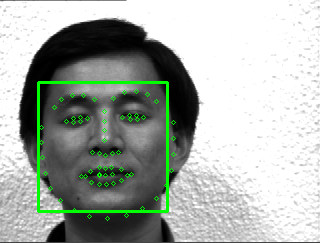

<class '_dlib_pybind11.vector'>
128
-0.12753
0.133448
0.0805986
-0.0830033
-0.0703526
-0.0106254
-0.00948151
-0.0487226
0.138534
0.0200716
0.257787
0.0334643
-0.185565
-0.0378461
0.00361792
0.132525
-0.124089
-0.113047
-0.0971763
-0.0925405
0.00535401
-0.04871
-0.0143038
0.0475734
-0.167245
-0.269149
-0.140382
-0.12601
0.0439812
-0.156264
-0.0419589
-0.0559718
-0.213599
-0.0560662
-0.0745044
0.0135855
-0.044558
-0.136566
0.137879
0.0588282
-0.148524
0.06958
0.101078
0.207667
0.214874
-0.00356585
0.0679462
0.0371114
0.00176489
-0.167821
0.103505
0.0774283
0.162867
0.0870552
0.047441
-0.134158
-0.0279091
0.0523379
-0.106278
0.0746955
0.0453258
-0.0700146
-0.0615328
-0.0226111
0.192667
0.154759
-0.0752166
-0.111055
0.112295
-0.0982214
-0.0618184
0.0334104
-0.123198
-0.11068
-0.266247
0.151638
0.394706
0.133544
-0.191447
0.0317787
-0.161568
-0.0375738
-0.0457754
0.0196905
-0.089954
0.00660595
-0.142496
0.0403884
0.20542
-0.00780278
-0.00388056
0.169743
-0.0172924
-0.00964531
0.00589611
0.0

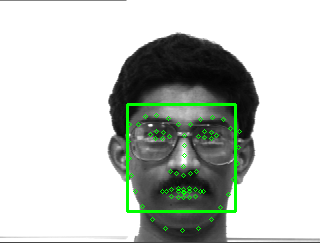

<class '_dlib_pybind11.vector'>
128
-0.114845
0.0902873
0.0741895
-0.0642918
-0.0429055
-0.021662
-0.121991
-0.165475
0.0910645
-0.135863
0.22716
-0.0050951
-0.182356
-0.0934664
-0.0366106
0.167744
-0.152384
-0.141121
-0.0638496
-0.0264203
0.0391909
0.028948
0.0274515
0.0125771
-0.143619
-0.298168
-0.117102
-0.0575918
-0.0420806
-0.0515114
-0.069776
0.0274399
-0.159394
-0.0429484
0.0427882
0.0991603
-0.0379756
-0.0185017
0.175427
0.0128872
-0.132463
0.0457855
0.111383
0.261142
0.247384
0.0833289
0.0418198
-0.112147
0.0552875
-0.174281
0.0216492
0.128889
0.0610712
0.0917523
0.0352916
-0.112355
0.0286434
0.0391198
-0.0494782
0.0517599
0.0957833
-0.0984973
-0.0605918
-0.0309232
0.240788
0.0460313
-0.127034
-0.190638
0.0701542
-0.122379
-0.166383
0.0182991
-0.182201
-0.117973
-0.333247
0.00229983
0.397538
0.103099
-0.1774
0.0729293
-0.0528454
-0.0293289
0.0855945
0.0812653
-0.0436315
-0.0279024
-0.087107
0.0388424
0.251276
-0.0363351
-0.0393041
0.14756
-0.0148647
0.0649701
0.0136197
0.0508

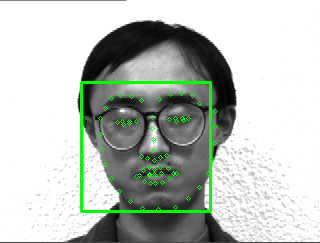

<class '_dlib_pybind11.vector'>
128
-0.11306
0.10883
0.0480645
-0.115633
-0.0619834
-0.0256057
-0.104175
-0.122363
0.0897441
-0.119062
0.1852
-0.0103455
-0.212531
-0.0615269
-0.0460519
0.152771
-0.157687
-0.120588
-0.0458004
-0.0572791
0.0512512
0.0329167
0.0427525
0.0386423
-0.120072
-0.284882
-0.114118
-0.0837671
-0.0132333
-0.0461068
-0.0797571
0.01787
-0.15323
-0.0370138
-0.000498049
0.100346
-0.039297
-0.0229295
0.163366
0.00922043
-0.138131
0.0125086
0.10685
0.254825
0.260208
0.0922843
0.0722621
-0.132104
0.054647
-0.177113
0.0820894
0.11835
0.0505142
0.070182
0.0019036
-0.141011
0.0109596
0.101939
-0.0776754
0.0755088
0.105802
-0.0750008
-0.0355273
-0.0283044
0.272866
0.0625184
-0.138069
-0.144072
0.129421
-0.15332
-0.153327
-0.0122793
-0.170605
-0.13331
-0.333905
0.0408756
0.366714
0.140981
-0.118014
0.0812191
-0.068217
-0.0336954
0.0960761
0.111485
-0.100813
-0.0202551
-0.088395
0.0571762
0.254448
-0.0423753
-0.0283583
0.163491
-6.19702e-05
0.0773674
0.00986088
0.0666156
-0.10

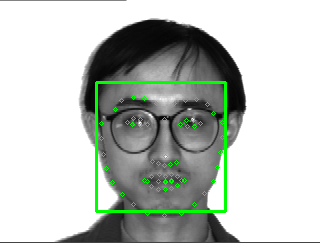

<class '_dlib_pybind11.vector'>
128
-0.124467
0.199509
0.0183811
-0.0528716
-0.097038
-0.0337806
-0.0568519
-0.192289
0.105912
-0.0301841
0.28312
-0.109871
-0.210178
-0.158061
-0.00183906
0.16751
-0.17315
-0.172775
-0.00667708
-0.0236868
0.100421
-0.0384085
0.0538615
0.0382569
-0.140737
-0.280399
-0.0803369
-0.101367
0.0857688
-0.0118668
-0.0775069
-0.0362771
-0.224917
-0.0997187
0.0384614
0.070865
-0.049351
-0.0617686
0.17508
-0.0109159
-0.190021
0.0366328
0.0442496
0.253859
0.169916
0.0975293
0.00138479
-0.146585
0.0599381
-0.153574
0.0895911
0.172864
0.0994303
0.0396127
0.00512777
-0.149024
0.0474164
0.0876262
-0.202304
-0.0345044
0.113519
-0.0357878
-0.0618722
-0.134897
0.267264
0.108608
-0.12932
-0.100631
0.110349
-0.0382205
-0.112803
0.0271991
-0.151536
-0.152177
-0.349174
0.0439126
0.398297
0.0932795
-0.221229
0.0192182
-0.0273919
0.0389378
0.110279
0.100783
-0.0598074
-0.018531
-0.107664
-0.0140437
0.125936
-0.113782
-0.0413702
0.158161
-0.00844786
0.0650324
0.0126958
0.083901


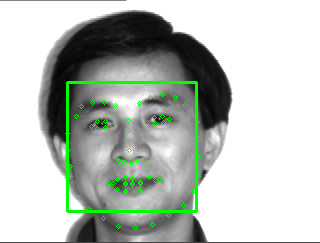

<class '_dlib_pybind11.vector'>
128
-0.138733
0.0468652
0.0653111
-0.0261252
-0.00314648
-0.0465677
0.0786609
-0.109034
0.215068
-0.0691568
0.241923
-0.0572733
-0.230002
-0.13244
0.0208626
0.0970716
-0.14835
-0.147728
-0.0629601
-0.150553
0.00182821
-0.0149754
0.0490144
0.00653039
-0.152126
-0.35107
-0.0541518
-0.164087
0.0210223
-0.0962503
-0.00718865
0.0405179
-0.243808
-0.0889011
-0.131544
0.0257859
-0.0403061
-0.0459529
0.175333
-0.00591994
-0.125291
-0.0152762
-0.0106572
0.277297
0.135066
-0.0103416
-0.0154597
0.00403896
0.00795954
-0.255851
0.0705376
0.116542
0.0888326
0.00397049
0.0265453
-0.0479296
-0.0485628
0.00442715
-0.174355
0.0620723
0.0855941
-0.0132085
-0.061177
-0.0240994
0.255014
0.124677
-0.0838316
0.0301831
0.119039
-0.129012
-0.00168302
0.00175278
-0.0984795
-0.184273
-0.25967
0.130133
0.380629
0.0768644
-0.151495
-0.00502834
-0.157323
0.00173067
0.0737697
0.0113035
-0.107675
0.0643901
-0.122671
0.100832
0.155044
-0.0145305
-0.0701782
0.232125
0.00819667
-0.0219821

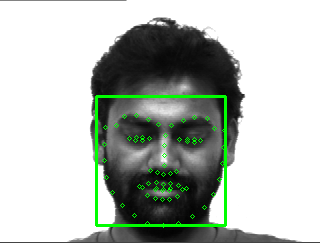

<class '_dlib_pybind11.vector'>
128
-0.176066
0.133509
0.0111146
-0.150128
-0.16113
0.0460631
-0.07956
-0.0172383
0.133604
-0.0119898
0.243051
-0.0364091
-0.322049
-0.101113
0.0627038
0.155951
-0.112884
-0.0411151
-0.139026
-0.136893
0.00613538
0.0693665
0.03142
-0.0018722
-0.160163
-0.278243
-0.0632897
-0.023632
0.0280614
-0.0943713
0.0638101
0.0396382
-0.151213
-0.0529304
0.0119783
0.131527
-0.113089
-0.103241
0.140878
-0.038995
-0.11985
-0.0287026
0.0643052
0.218572
0.194576
0.0105053
0.0320419
0.0311149
0.0823274
-0.283255
0.036214
0.132006
0.0985877
0.0182788
0.136194
-0.0839314
-0.0264201
0.274294
-0.181796
-0.00733456
0.0327247
-0.0643674
-0.114805
-0.172057
0.233592
0.18626
-0.183746
-0.108623
0.179252
-0.0640947
-0.0956741
0.0686175
-0.109048
-0.151681
-0.291402
0.0763344
0.328689
0.131887
-0.203021
-0.0176839
0.0048455
0.0202667
-0.000326633
0.0157167
-0.0877709
-0.0851423
-0.0699837
-0.0234404
0.175356
-0.0333867
-0.0209622
0.228202
0.085094
0.0221684
0.0150552
0.0153239
-0.

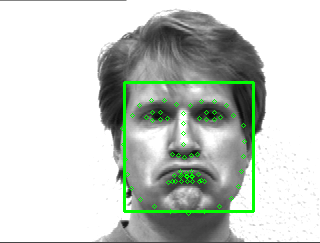

<class '_dlib_pybind11.vector'>
128
-0.162603
0.0897513
0.110062
-0.0220231
-0.0827253
-0.0127251
0.00526964
-0.0284641
0.100685
0.00569045
0.161729
0.00357648
-0.211159
0.0200185
-0.0582818
0.110306
-0.134712
-0.111991
-0.114692
-0.0540229
0.0423682
0.099007
-0.0211977
-0.000593022
-0.151063
-0.253738
-0.0642275
-0.131482
0.0107279
-0.0572675
0.0240061
0.00547907
-0.19947
-0.0988233
-0.0023017
-0.00620206
-0.112706
-0.0826752
0.122708
0.023986
-0.118469
0.0501987
0.105353
0.298916
0.155249
0.0763016
0.0361113
-0.075293
0.00466157
-0.266096
0.0201485
0.115982
0.067702
0.0908818
0.0937235
-0.12718
0.0874757
0.112456
-0.216593
0.142329
0.0756431
-0.032452
0.06211
-0.0253439
0.18444
0.0636611
-0.0414258
-0.0716411
0.145706
-0.13652
-0.074136
0.0366776
-0.0663934
-0.186415
-0.25289
0.0403589
0.445305
0.201689
-0.121597
0.0285561
-0.0938893
-0.054199
0.078663
0.0109535
-0.102079
-0.102409
-0.121061
0.0280279
0.226078
0.0283407
0.00467132
0.163144
0.0755535
-0.124981
0.0294245
-0.000772431
-

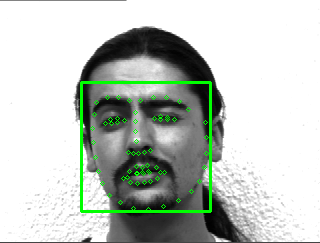

<class '_dlib_pybind11.vector'>
128
-0.16009
0.0439725
0.060443
-0.0211356
0.0787726
-0.111122
0.000594586
-0.161911
0.159695
-0.109373
0.2327
-0.022798
-0.152793
-0.137213
0.00387156
0.0855279
-0.171722
-0.138212
-0.0395603
-0.0660527
0.0398176
-0.0139106
0.0081168
0.0611889
-0.152577
-0.362756
-0.0780165
-0.159067
-0.00784516
-0.00764427
0.0177366
-0.00112145
-0.227793
-0.00810814
-0.0474567
0.0637755
0.0341032
0.00940245
0.17981
0.0195646
-0.140629
-0.051315
-0.0443278
0.270592
0.183686
0.0224869
0.0263608
-0.0290747
0.0306342
-0.256129
0.059287
0.10167
0.0949401
0.00358441
0.0709759
-0.115577
-0.0273713
0.0101002
-0.195797
0.0541567
0.0165134
-0.0225392
-0.0283828
0.0198221
0.270023
0.0866575
-0.143163
0.00853432
0.201886
-0.153562
0.00858016
0.00332187
-0.0739552
-0.24857
-0.293036
0.0895026
0.44015
0.182777
-0.201549
0.0509756
-0.193271
-0.00605021
0.113411
0.015203
-0.0498327
0.0734496
-0.0901499
0.0731209
0.170333
0.0396718
-0.0786074
0.227988
-0.0551773
0.000410281
0.0172129
-

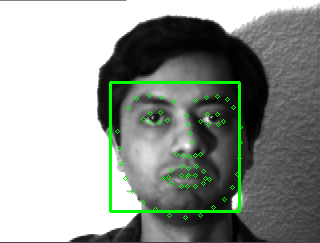

<class '_dlib_pybind11.vector'>
128
-0.127257
0.0612669
0.129212
0.0529743
0.0517595
-0.113478
-0.0262109
-0.106355
0.132742
-0.104694
0.273011
-0.0102612
-0.154491
-0.149307
0.039701
0.130802
-0.142045
-0.121973
-0.0572087
-0.107591
0.00237164
-0.0429062
0.0152267
-0.0164475
-0.214141
-0.358702
-0.122235
-0.1261
0.00719869
0.0123609
0.0397251
0.00477625
-0.170811
-0.00849666
-0.0271762
0.092549
0.00242187
0.00651882
0.177113
0.0101794
-0.11427
-0.0160131
-0.0194942
0.257396
0.205866
0.0478429
0.0676108
-0.00824012
0.00854091
-0.222771
0.0439646
0.0982788
0.108635
0.0502879
0.0728126
-0.0808114
0.00158861
0.0183977
-0.189916
0.0420005
0.029218
-0.0830403
-0.031357
0.0256228
0.274733
0.10914
-0.109027
-0.0286611
0.22158
-0.191979
-0.00586274
-0.00939818
-0.0814127
-0.18046
-0.346624
0.0624934
0.435878
0.158893
-0.169937
0.0639585
-0.127593
-0.00495613
0.0657285
0.021991
-0.0946957
0.0417686
-0.0975749
0.0393062
0.207183
0.0107528
-0.0459619
0.194257
-0.0348683
0.0273898
0.0488633
-0.076

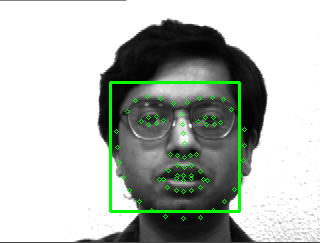

<class '_dlib_pybind11.vector'>
128
-0.194215
0.11649
-0.00979345
-0.0766507
-0.122178
-0.0568111
-0.00909268
-0.0345369
0.194527
-0.00129346
0.26083
-0.00905343
-0.296419
-0.0403235
-0.064663
0.121494
-0.139771
-0.0324851
-0.0716041
-0.15424
0.101365
0.0629615
0.0110552
0.0301738
-0.17596
-0.286702
-0.0699742
-0.116234
-0.00833908
-0.167153
-0.00718272
0.0514643
-0.219763
-0.104783
-0.0172554
0.0832111
-0.0770131
-0.074632
0.144892
0.0694505
-0.0893033
-0.00852375
0.118703
0.263861
0.161811
0.00503729
0.0204449
-0.0671752
0.0679161
-0.246743
0.0682755
0.139062
0.0873041
0.0891595
0.0702421
-0.210635
0.013469
0.0664859
-0.212756
0.0712889
0.100934
-0.0141876
-0.083016
-0.00438368
0.203471
0.118917
-0.138508
-0.0964962
0.107229
-0.106748
-0.00346202
0.0855402
-0.120033
-0.24144
-0.240556
0.169965
0.434357
0.111621
-0.115045
0.0108626
-0.13689
-0.105215
0.0256016
-0.00863615
-0.0700855
-0.0401501
-0.139723
0.112402
0.181423
-0.0263799
-0.0374721
0.224521
0.026648
0.0162178
0.0157791
0.11

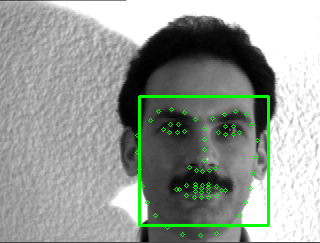

<class '_dlib_pybind11.vector'>
128
-0.0621079
0.0620696
-0.0577534
-0.0162343
-0.0576835
-0.0342355
-0.0434438
-0.0822481
0.14074
-0.0597903
0.160948
-0.0584445
-0.230612
0.0316463
-0.0479582
0.106405
-0.113081
-0.0714993
-0.188617
-0.109205
-0.023734
0.00532275
0.0322483
0.0429965
-0.119553
-0.194597
-0.0703436
-0.120935
0.105542
-0.147335
-0.0748506
0.0238921
-0.304103
-0.102797
-0.03226
-0.02358
-0.0749558
-0.0301328
0.256891
0.0390706
-0.14162
0.119827
0.0685559
0.207515
0.20131
-0.0484448
-0.0188902
-0.0789073
0.0962273
-0.271053
0.0330592
0.156162
0.187528
0.134128
0.0524471
-0.13281
0.0209744
0.100918
-0.137261
0.144383
0.116398
-0.023742
-0.0490658
-0.0485884
0.17577
0.0934977
-0.0945243
-0.118284
0.127462
-0.12684
0.0240697
0.139123
-0.0309664
-0.175773
-0.266875
0.0821531
0.319116
0.177516
-0.176711
0.0374176
-0.136005
-0.0854569
-0.0253562
-0.0269728
-0.104188
-0.0261705
-0.0446127
0.0985384
0.201823
0.00326107
0.0123936
0.187602
0.0208233
0.0159537
-0.00471031
0.109991
-0.

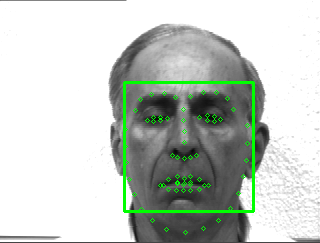

<class '_dlib_pybind11.vector'>
128
-0.0885099
0.0522473
0.0577853
-0.0689825
-0.0816232
-0.0365952
0.0332794
-0.0850488
0.225111
-0.0354864
0.220547
0.000852332
-0.219958
-0.111511
0.0197536
0.0768353
-0.14328
-0.0968328
-0.0882196
-0.0741396
0.0180524
0.00734521
0.034742
0.0322822
-0.154163
-0.36266
-0.0989272
-0.105958
0.00556988
-0.124259
-0.0221662
0.0112168
-0.235635
-0.134841
-0.103577
0.0265454
-0.102965
-0.0746126
0.149686
0.0314083
-0.134087
-0.0160629
0.0033675
0.274963
0.142771
0.009191
0.0237589
-0.0175767
0.0504745
-0.308518
0.0828939
0.119725
0.025701
0.025719
0.0740242
-0.0669666
-0.0364184
0.0766212
-0.212652
0.102308
0.0782298
-0.0122392
-0.0886462
-0.0617286
0.232815
0.143142
-0.0990983
-0.0517457
0.103215
-0.142346
-0.0218966
0.0296816
-0.078228
-0.212968
-0.309091
0.117102
0.397732
0.102232
-0.171779
-0.0366348
-0.182379
-0.0214582
0.0776528
-0.0336515
-0.0524596
0.0570146
-0.151521
0.0927299
0.181556
-0.0276932
-0.0296378
0.274996
0.0521742
-0.0104982
0.052998
0.0

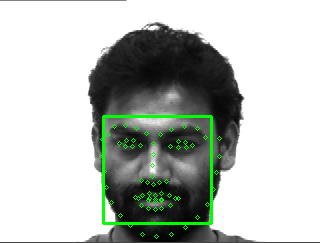

<class '_dlib_pybind11.vector'>
128
-0.0838549
0.0925789
-0.0547081
-0.033513
-0.218096
-0.0623531
0.0206827
-0.0683535
0.144557
0.00680486
0.182242
-0.0869829
-0.207604
-0.058948
-0.00274379
0.115671
-0.132093
-0.084989
-0.138947
-0.0530706
0.020362
0.028885
-0.0126297
0.0211343
-0.0690673
-0.255516
-0.0855147
-0.0746896
0.0525426
-0.0991917
0.0249263
0.160026
-0.203209
-0.127285
0.0348516
0.0358801
-0.0909419
-0.0838609
0.185929
-0.0204888
-0.190225
0.0378628
0.0652063
0.224296
0.247687
-0.0959574
0.0189238
-0.103302
0.0952872
-0.229915
0.00475082
0.18144
0.131257
0.0543905
0.0331442
-0.0442644
0.0262807
0.152976
-0.193599
0.0102268
0.13536
-0.112801
-0.0922159
-0.0829781
0.149084
0.125813
-0.0731289
-0.163159
0.14763
-0.151058
-0.108396
0.102043
-0.102123
-0.157951
-0.324786
0.0321783
0.435873
0.113919
-0.176595
0.0235425
-0.0912351
-0.0483301
0.0222452
0.0730814
-0.0993536
-0.0817483
-0.117632
0.0930936
0.210795
-0.0532973
-0.0257322
0.191824
0.0749155
-0.000387073
0.0267317
0.0586

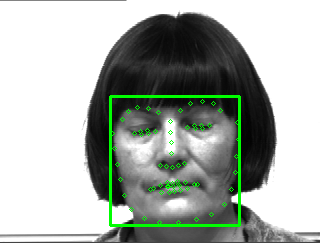

<class '_dlib_pybind11.vector'>
128
-0.134093
0.0196126
0.0249339
-0.00582679
-0.0407896
-0.00674019
0.0650161
-0.0656327
0.238138
-0.0655916
0.228091
-0.00500284
-0.221474
-0.130025
0.0561522
0.0906295
-0.145555
-0.149091
-0.121439
-0.104341
-0.0259969
-0.000471633
0.0494303
0.0136355
-0.205646
-0.389436
-0.115964
-0.120338
-0.017405
-0.116599
-0.0041166
0.0108757
-0.221273
-0.0947186
-0.0838764
0.0298176
-0.0249017
-0.064402
0.16054
0.0414877
-0.134598
-0.0292311
0.0213697
0.29156
0.0943078
-0.0525347
0.01956
0.0110547
-0.0111695
-0.264768
0.0536074
0.121965
0.0646531
0.0364007
0.0585118
-0.0548415
-0.01272
0.0727098
-0.174183
0.0801797
0.0798333
-0.00752993
-0.0585197
0.00771707
0.269917
0.182476
-0.070435
-0.0925255
0.102749
-0.12644
-0.00471427
0.00567701
-0.097897
-0.201076
-0.291917
0.0862253
0.40943
0.0887316
-0.1885
0.00440909
-0.236731
0.000832759
0.064116
-0.0314883
-0.10132
0.0945189
-0.170258
0.108972
0.205745
0.0254106
-0.0524105
0.222404
0.0582498
-0.0341013
0.115508
0.0

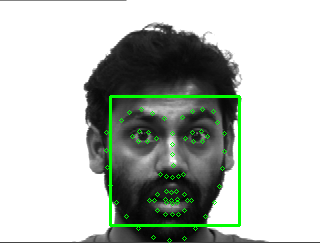

<class '_dlib_pybind11.vector'>
128
-0.0954302
0.100333
0.00342031
-0.0131749
-0.0418409
-0.0675168
-0.0325723
-0.143273
0.0947333
0.0195724
0.243456
-0.0797902
-0.222033
-0.124859
-0.0101839
0.127245
-0.177777
-0.0890078
-0.0684818
0.00938433
0.0604565
0.0116437
0.0503019
-0.0156545
-0.111525
-0.325907
-0.11731
-0.0772089
0.055184
-0.0509177
-0.0755092
0.0426295
-0.248315
-0.174647
0.0414652
0.100688
-0.0414067
0.032422
0.159961
0.0472319
-0.195908
0.0642634
0.091289
0.26541
0.193313
0.130951
-0.0318689
-0.0957738
0.0446316
-0.230104
0.0947079
0.131209
0.155542
0.0728009
0.00529917
-0.0785998
0.00623789
0.0903937
-0.193277
0.0456148
0.137273
-0.0700826
-0.0293202
-0.0395915
0.237344
0.0999558
-0.122479
-0.0938087
0.108649
-0.111053
-0.115385
0.0547848
-0.0710328
-0.135176
-0.403367
0.035155
0.379759
0.042889
-0.218305
-0.0277074
-0.0887479
-0.0245511
0.103283
0.0706286
-0.0332711
0.00453162
-0.121916
-0.022643
0.203769
-0.065488
-0.0278327
0.19612
0.0124606
0.115578
0.029946
0.127255


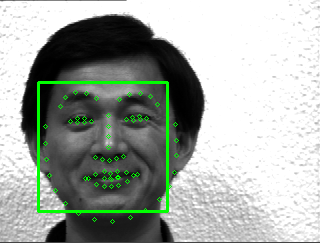

<class '_dlib_pybind11.vector'>
128
-0.178888
0.0889703
0.0447044
-0.0768586
-0.112265
-0.0196769
-0.102571
-0.0767747
0.11464
-0.113749
0.199857
-0.0666855
-0.169838
0.0454013
-0.0500272
0.164355
-0.161146
-0.0646974
-0.106523
-0.121921
0.0536048
0.0368728
-0.0241687
0.07337
-0.163134
-0.276084
-0.118963
-0.101968
0.0981267
-0.0404765
-0.110147
-0.0784706
-0.198186
-0.0676981
0.0418567
0.0450705
-0.0136732
-0.0360561
0.16129
0.00190271
-0.0966411
0.0417961
0.0860276
0.232837
0.0974586
0.118088
0.0765335
-0.0976784
0.0885953
-0.212924
0.112844
0.0821264
0.147406
0.0942104
0.06693
-0.1623
0.00712112
0.166021
-0.13472
0.149451
0.124402
0.0342724
-0.0426767
-0.0816106
0.296332
0.180758
-0.138155
-0.143966
0.143443
-0.116731
-0.0399812
0.0141734
-0.0747172
-0.134812
-0.26466
0.0622134
0.431954
0.188671
-0.201491
-0.055295
-0.0824266
-0.0204055
0.0949335
0.00312947
-0.158552
-0.0100378
-0.0310832
0.0689815
0.245791
0.00483386
0.0178403
0.174724
0.0574839
0.0373756
-0.0226717
0.0496327
-0.17

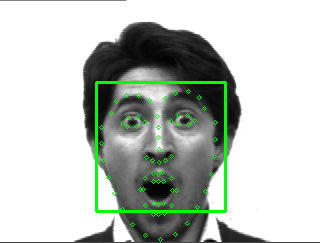

<class '_dlib_pybind11.vector'>
128
-0.125723
0.0935165
0.0760111
-0.0445398
-0.00783992
-0.042228
0.0103568
-0.0554301
0.183085
-0.0558244
0.200931
0.0634462
-0.210826
-0.0234358
-0.058351
0.102151
-0.166537
-0.0939027
-0.102333
-0.0886956
0.0699146
0.0587726
0.050959
0.00887519
-0.166286
-0.29073
-0.105474
-0.170214
0.0157839
-0.0706703
0.0156394
-0.0477112
-0.162727
-0.080665
0.0162496
-0.0109883
-0.0758006
-0.129292
0.147888
0.0150803
-0.111098
0.0214832
0.0489953
0.297413
0.117743
0.0494559
0.0476162
-0.0885558
0.0632962
-0.246975
0.105778
0.0819842
0.0636595
0.0789454
0.134469
-0.142022
0.0920966
0.141701
-0.22826
0.0876208
0.0631392
-0.00483107
-0.0093357
-0.0133422
0.168068
0.100039
-0.108923
-0.0776164
0.112536
-0.093548
-0.018635
0.0314679
-0.121723
-0.233489
-0.222551
0.103697
0.467465
0.232961
-0.0865337
0.0274024
-0.117093
-0.0235466
0.0607149
0.025324
-0.116435
-0.042671
-0.0912797
0.100668
0.138241
0.0214634
-0.0864459
0.166436
-0.0128412
-0.0634179
-0.0209295
0.00598603

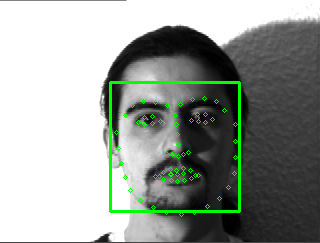

<class '_dlib_pybind11.vector'>
128
-0.121655
0.0901234
-0.0561206
-0.0229665
-0.0825045
-0.0431884
0.000877716
-0.100361
0.143296
0.0210411
0.208991
-0.0528076
-0.239901
-0.00130894
-0.0310617
0.091634
-0.136971
-0.0568329
-0.187066
-0.063962
-0.0191199
-0.0265072
0.035015
0.0467356
-0.112385
-0.213122
-0.043509
-0.0895102
0.0827902
-0.186162
-0.0353168
0.0128839
-0.335814
-0.160713
-0.0322611
0.0144398
-0.0454715
-0.0098952
0.194962
0.028091
-0.135711
0.124073
0.0471756
0.20708
0.209186
-0.0119674
-0.010918
-0.100654
0.0605658
-0.265561
0.0217696
0.136896
0.17517
0.0658538
0.0334883
-0.121188
-0.0461305
0.090186
-0.141204
0.159735
0.139198
0.0130631
-0.0432677
-0.0883948
0.141586
0.092285
-0.102124
-0.124049
0.130817
-0.111129
-0.00613066
0.130269
-0.0173563
-0.207403
-0.280811
0.0808185
0.320732
0.143707
-0.210448
-0.0376791
-0.17854
-0.067072
-0.0557332
-0.0405905
-0.0413495
-0.0390852
-0.0753732
0.0867194
0.213708
0.0095574
0.00336747
0.209045
0.0138545
-0.00838913
-0.0337274
0.13

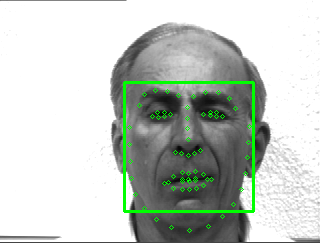

<class '_dlib_pybind11.vector'>
128
-0.129162
0.0908536
0.00259349
-0.101744
-0.163023
0.00601426
-0.032699
-0.040565
0.0924066
-0.0408355
0.242575
-0.0781906
-0.336074
-0.0931947
0.0588139
0.091054
-0.0447892
-0.043595
-0.219443
-0.104881
-0.0228587
-0.0161502
0.0630701
-4.95613e-05
-0.187052
-0.276267
-0.112782
-0.00738348
-0.0167552
-0.12101
0.0227218
0.0759949
-0.224601
-0.162456
0.0315052
0.0900584
-0.0951719
-0.0772589
0.136945
-0.0134153
-0.108591
0.0513132
0.0622958
0.22095
0.229713
0.0697799
-0.00951848
-0.0417415
0.117151
-0.349074
0.0521325
0.151779
0.141742
0.00729086
0.129945
-0.0587132
0.0270647
0.198851
-0.185154
0.0626775
0.0605089
-0.0491541
-0.158456
-0.187523
0.179578
0.181455
-0.17672
-0.105296
0.205802
-0.0790368
-0.0298758
0.115311
-0.108408
-0.217343
-0.265193
0.113182
0.367776
0.203749
-0.238327
-0.057871
-0.0710467
0.0388333
-0.0568215
-0.00385161
-0.0997339
-0.114276
-0.0608381
0.0389295
0.177711
-0.045645
-0.0366132
0.301283
0.0735353
0.0418578
0.0359951
0.03

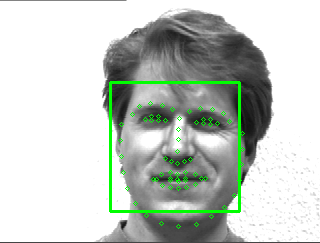

<class '_dlib_pybind11.vector'>
128
-0.114365
0.0678746
0.0665917
-0.0795732
-0.125388
-0.00267211
-0.108548
-0.090382
0.0895652
-0.161074
0.235968
0.0196509
-0.188035
-0.00299476
0.00261261
0.159607
-0.102109
-0.131776
-0.0807603
-0.0285463
0.0304799
0.0333051
-0.00544876
0.0603186
-0.132638
-0.296421
-0.0946509
-0.0415854
-0.0461791
-0.0636469
-0.0593899
0.0185191
-0.147193
-0.0362073
0.0253885
0.104707
-0.0376912
-0.0372379
0.18792
0.0541927
-0.1575
0.0780319
0.0702698
0.284028
0.178363
0.0821223
0.0673344
-0.107047
0.0775207
-0.220616
0.0745339
0.112835
0.0893484
0.0428776
0.0331844
-0.140458
0.0357511
0.0953175
-0.0865839
0.086436
0.0787354
-0.0525583
-0.0404562
-0.0787552
0.258994
0.0814949
-0.127874
-0.127135
0.0664739
-0.0910762
-0.168575
0.00784027
-0.19346
-0.160457
-0.317911
0.049479
0.408922
0.150471
-0.205012
0.0518428
-0.0344331
-0.0204449
0.0843269
0.0994696
-0.0515376
-0.0446643
-0.0789492
0.0694706
0.251309
-0.0238599
-0.0253188
0.185644
0.0347091
0.0625181
0.0032749
0

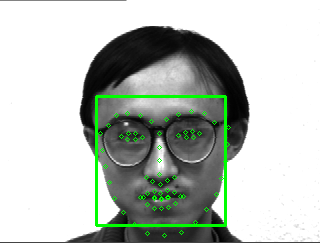

<class '_dlib_pybind11.vector'>
128
-0.0862126
0.0669168
0.0357934
0.00727384
-0.102297
-0.018965
0.00508543
-0.0520437
0.046357
-0.0401299
0.100041
-0.0822872
-0.237548
-0.00264539
0.0076445
0.11227
-0.155114
-0.121555
-0.12785
-0.138827
-0.0265901
0.00872448
-0.0802569
0.0490996
-0.191273
-0.249798
-0.0693225
-0.078632
0.0152028
-0.115803
-0.00286093
0.0409817
-0.210989
-0.0608227
0.012112
0.00787217
-0.0526576
-0.0549837
0.180112
0.0313785
-0.124529
0.0840012
0.131522
0.265799
0.247945
0.107876
-0.0293348
-0.0661818
0.143175
-0.281224
0.101058
0.142516
0.0557312
0.0781044
0.0597713
-0.147531
-0.040488
0.0890878
-0.178481
0.139342
0.0793965
-0.0617601
-0.0603264
-0.107694
0.137747
0.0769174
-0.0919309
-0.123825
0.1697
-0.220263
-0.0708487
0.0427301
-0.0517737
-0.152362
-0.356145
0.133017
0.399587
0.211787
-0.116319
-0.0109772
-0.0128413
-0.0422206
0.0812484
0.05151
-0.106886
-0.141155
-0.0299677
0.0766894
0.207962
0.0571619
-0.049562
0.173271
-0.00331296
-0.0288284
-0.0142402
0.05517

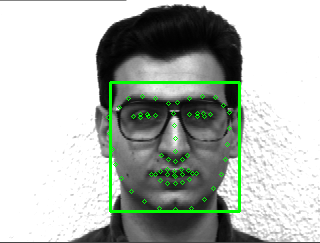

<class '_dlib_pybind11.vector'>
128
-0.153025
0.145645
0.0607842
-0.0806888
-0.13796
-0.0269656
-0.116892
-0.096391
0.117244
-0.103095
0.214673
0.00729383
-0.145624
-0.0200542
-0.0585216
0.162228
-0.144097
-0.164356
-0.0740921
-0.0814001
0.0302829
0.053421
-0.00200767
0.114453
-0.159133
-0.298967
-0.0793149
-0.123069
0.0900889
-0.0213933
-0.113107
-0.0317592
-0.187473
-0.0558681
0.0294195
0.0501358
0.0195002
-0.00471261
0.178664
-0.0126671
-0.12451
0.0915125
0.104679
0.261977
0.185728
0.0863287
0.119425
-0.0662966
0.0652614
-0.177585
0.0743449
0.128873
0.15424
0.0476655
0.0381298
-0.113504
-0.00627476
0.141747
-0.181857
0.14119
0.102206
-0.00801427
-0.0433107
-0.0330008
0.28655
0.138068
-0.109045
-0.142473
0.173096
-0.186999
-0.108126
-0.00601846
-0.117349
-0.105843
-0.277061
0.0359691
0.393842
0.221845
-0.191547
0.0651958
-0.0547186
-0.00105722
0.0595809
0.0111015
-0.132423
-0.0398958
-0.0935989
0.0604789
0.250296
0.0431299
0.0312989
0.179587
0.0910078
0.00617612
0.016282
0.0654759
-0

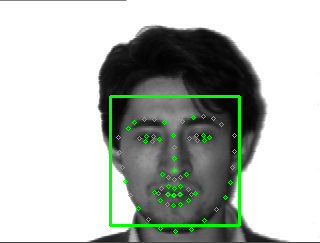

<class '_dlib_pybind11.vector'>
128
-0.138544
0.0861844
0.00255768
-0.0513954
-0.0964008
-0.0634895
0.0249582
-0.0464761
0.176154
0.0420444
0.260437
-0.00493071
-0.269474
-0.0564452
-0.0249236
0.0843073
-0.141978
0.0322908
-0.139413
-0.142115
0.0584057
0.0527533
0.066948
0.0139672
-0.152147
-0.294961
-0.0691685
-0.101633
0.00398305
-0.124386
0.0203355
0.133111
-0.197829
-0.105524
-0.0217111
0.0642445
-0.0727384
-0.016666
0.157413
0.0247509
-0.0820776
0.093948
0.110579
0.24438
0.179931
0.0382938
0.0266336
-0.0488269
0.0414367
-0.215769
0.0691697
0.16008
0.0773097
0.0466952
0.0978544
-0.162336
-0.0132903
0.0406761
-0.177202
0.0723647
0.114044
-0.04779
-0.116316
-0.0449746
0.155011
0.104078
-0.136302
-0.0832817
0.089573
-0.0957281
-0.00663079
0.106121
-0.140226
-0.198018
-0.236905
0.16999
0.439737
0.0941165
-0.166475
-0.00678885
-0.144173
-0.0872156
0.0239091
0.000468329
-0.0499558
-0.100145
-0.148886
0.090318
0.122815
-0.0223739
-0.0412256
0.216614
0.0684198
-0.0113996
-0.0194084
0.09022

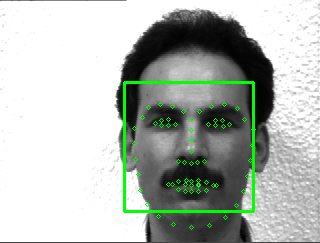

<class '_dlib_pybind11.vector'>
128
-0.205858
0.10261
0.0470659
-0.0558041
-0.271598
-0.049869
0.00700801
-0.0844057
0.159885
-0.0470892
0.203688
-0.068187
-0.189205
0.0179169
0.00748287
0.162192
-0.167785
-0.10195
-0.133491
-0.0842148
0.0527608
0.0857395
0.0015059
0.0771697
-0.171629
-0.262083
-0.0330414
-0.0709447
0.0570602
-0.0673639
-0.0274794
0.122947
-0.195265
-0.0364341
0.0338285
0.139495
-0.103809
-0.086582
0.15698
-0.0547561
-0.252335
0.0170417
0.0366254
0.203492
0.248838
-0.0566257
-0.0154222
-0.0383797
0.116907
-0.276311
-0.0212013
0.172734
0.00347438
0.0290508
0.0737502
-0.113189
-0.000492841
0.191648
-0.188092
-0.0469699
0.0992018
-0.163954
-0.0335487
-0.123936
0.170826
0.128819
-0.0981863
-0.109935
0.148507
-0.14859
-0.0719445
0.109064
-0.102263
-0.16819
-0.308776
0.0123147
0.441015
0.131588
-0.158014
0.0138531
-0.0441559
0.0151571
0.0486921
0.034955
-0.0819572
-0.0391972
-0.172729
0.0519475
0.201918
-0.0315513
0.0396656
0.262724
0.0838264
-0.0322322
0.0459506
0.0682585
-

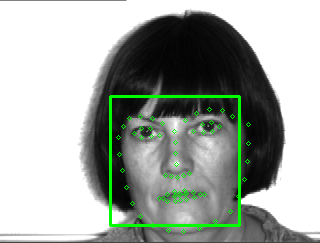

<class '_dlib_pybind11.vector'>
128
-0.143364
0.149733
0.0732065
-0.054588
-0.150084
0.0370461
-0.085718
-0.0924343
0.110335
-0.0750066
0.210934
0.0102689
-0.150022
-0.00188545
-0.0431268
0.127986
-0.118907
-0.134579
-0.107297
-0.130974
-0.0327943
0.0108057
0.00427252
0.0563115
-0.183016
-0.236638
-0.0824964
-0.0897534
0.0975927
-0.0450491
-0.0950616
-0.0125535
-0.199073
-0.101934
0.0304217
0.0512539
-0.0110092
0.0113328
0.12955
-0.0153039
-0.100181
0.0796702
0.139429
0.313278
0.204626
0.105294
0.056271
-0.0443308
0.0467762
-0.190585
0.0254198
0.117769
0.136405
0.0522571
0.0465401
-0.105871
0.00731394
0.0909782
-0.107543
0.116624
0.0823657
0.00644635
-0.0682315
-0.0656222
0.293204
0.13577
-0.103915
-0.155851
0.127657
-0.147902
-0.0934799
0.043729
-0.123922
-0.0854742
-0.261878
0.0334174
0.464021
0.168421
-0.190515
0.0293988
-0.062277
-0.0106071
0.0572772
0.0303011
-0.135164
-0.03303
-0.0631195
0.053273
0.250611
-0.00895813
0.00937884
0.128887
0.0870945
-0.0181398
0.0146244
0.0703348
-0

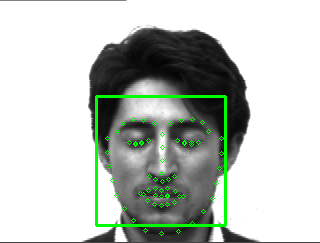

<class '_dlib_pybind11.vector'>
128
-0.15207
0.161984
-0.00879254
-0.0868946
-0.152399
-0.0305105
-0.0918913
-0.0291045
0.0677422
-0.00171078
0.280374
-0.0856816
-0.306245
-0.180215
0.0757143
0.166405
-0.0722162
-0.0550887
-0.154493
-0.0849263
0.00186309
0.0502702
0.0354641
0.0341356
-0.159691
-0.266806
-0.0967728
-0.0390358
0.0515454
-0.160942
0.0222392
0.0405875
-0.156286
-0.103219
0.0494852
0.106073
-0.132218
-0.0701346
0.144212
-0.0552893
-0.156161
0.0173064
0.112181
0.236075
0.228759
0.0273476
0.0609448
-0.0550144
0.0977831
-0.270073
0.0644192
0.138011
0.113314
0.0894712
0.0800282
-0.101709
-0.0150807
0.278648
-0.212481
0.0343221
0.0921427
-0.046076
-0.158472
-0.100525
0.205509
0.16405
-0.198887
-0.183901
0.156978
-0.141538
-0.0616367
0.178045
-0.0847062
-0.178406
-0.304088
0.121701
0.310753
0.123719
-0.18294
-0.0426001
-0.00804713
0.021741
-0.037625
0.00693643
-0.107656
-0.125589
-0.0958951
-0.000563458
0.180457
-0.0489696
0.0354879
0.238031
0.114885
0.0195354
0.0196339
0.0996377

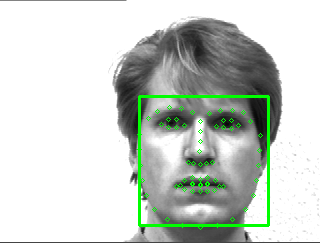

<class '_dlib_pybind11.vector'>
128
-0.089506
0.124385
0.06735
-0.0472144
-0.088754
-0.0422396
-0.0478691
-0.155046
0.103644
-0.0861779
0.269319
-0.0466715
-0.179349
-0.164985
0.0185887
0.177377
-0.169191
-0.157048
-0.0433548
-0.0202097
0.0180247
-0.0136414
0.0656931
0.026222
-0.102018
-0.385793
-0.103791
-0.114678
0.0281007
-0.0976118
-0.117783
0.0287157
-0.217258
-0.0664198
-0.0219743
0.094542
-0.00289028
-0.0209236
0.132527
0.0283896
-0.219963
0.0208342
0.0216903
0.246957
0.257898
0.0378481
0.0531269
-0.0612558
0.0426795
-0.113797
0.0357432
0.0876243
0.0818055
0.028717
-0.0422133
-0.100225
-0.0124587
0.0467583
-0.0933407
0.00612702
0.130259
-0.123823
-0.0697332
-0.00280733
0.274316
0.0471214
-0.100268
-0.170163
0.069868
-0.145931
-0.0952592
0.0461105
-0.187654
-0.109879
-0.364573
0.0716544
0.393675
0.0494762
-0.178594
0.0181139
-0.0756752
0.0467091
0.117133
0.137406
-0.0459929
0.0629525
-0.15268
0.0346195
0.200054
-0.0734229
-0.0423826
0.185362
-0.0565697
0.111763
0.0243424
0.055302

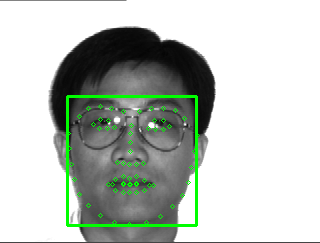

<class '_dlib_pybind11.vector'>
128
-0.161824
0.0991096
0.0520137
0.018585
0.064103
-0.141486
-0.0181247
-0.149936
0.129772
-0.0882283
0.234129
-0.0316141
-0.182297
-0.14648
0.0312009
0.0951569
-0.188404
-0.136198
-0.0273852
-0.130515
0.013209
-0.011879
0.0253234
0.0296285
-0.208715
-0.31813
-0.124098
-0.150506
0.0148229
0.0368542
0.0356503
-0.0130386
-0.195557
-0.0249919
-0.00111528
0.0228313
0.064799
0.0292992
0.180503
0.00336567
-0.0795807
-0.0729354
-0.00550337
0.308566
0.141988
0.0650087
0.0413507
-0.033148
0.0105365
-0.209124
0.0738197
0.13324
0.0914116
0.0345338
0.0745345
-0.106563
0.013808
0.0037658
-0.177283
0.0555299
0.0704954
-0.00453062
-0.0587254
-0.0187472
0.317705
0.078802
-0.156511
-0.0190064
0.196063
-0.159445
-0.0221654
-0.00152047
-0.0783
-0.192777
-0.335496
0.0624228
0.40741
0.196345
-0.207825
0.04552
-0.178226
0.024832
0.115153
0.00712699
-0.0993167
0.0618696
-0.100317
0.0398039
0.175842
0.0241806
-0.0887451
0.201209
-0.02181
0.0081691
0.0350873
-0.0113091
-0.03630

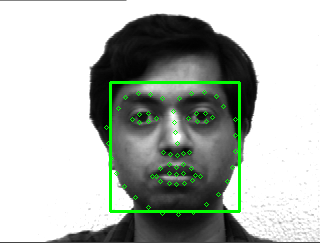

<class '_dlib_pybind11.vector'>
128
-0.174484
0.0695466
0.0743824
-0.0982159
-0.146258
-0.0779701
-0.0117585
-0.115501
0.100569
-0.0966605
0.202707
-0.149058
-0.182048
-0.0783724
-0.0232493
0.18665
-0.187036
-0.129466
-0.0866076
0.00195301
0.092178
-0.0110586
-0.0260621
0.00151127
-0.0826604
-0.345286
-0.0650845
-0.0588228
0.0492147
-0.0671725
-0.0773979
0.0410261
-0.210534
-0.105941
-0.00333609
0.0830216
-0.0218785
-0.0805408
0.143213
-0.0283409
-0.238286
0.0072841
0.0358411
0.213115
0.205244
0.033929
0.0047557
-0.109
0.105198
-0.21604
-0.00954997
0.110369
0.019512
0.0396314
0.00864747
-0.103147
0.015061
0.0959816
-0.127957
0.00148036
0.132208
-0.0948021
-0.0556417
-0.135938
0.236347
0.0701522
-0.100431
-0.129388
0.124533
-0.0907892
-0.0536112
0.00313292
-0.129858
-0.123058
-0.271776
0.006567
0.398745
0.0751513
-0.215409
0.0106885
-0.0948034
0.0265884
0.165114
0.104515
0.00945134
0.0333032
-0.0861972
-0.000875607
0.205616
-0.0892924
0.0114889
0.196339
0.0110551
0.046108
0.0308449
0.00

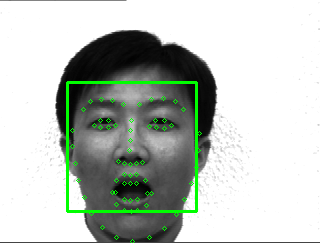

<class '_dlib_pybind11.vector'>
128
-0.123121
0.158205
-0.00382609
-0.0305871
-0.130629
0.0102946
-0.103225
-0.148993
0.132907
-0.128701
0.198052
-0.000899088
-0.221824
-0.00522569
-0.000604302
0.112628
-0.160639
-0.132956
-0.161648
-0.12218
0.00435631
0.017414
0.0304937
0.0941025
-0.190735
-0.261518
-0.131478
-0.0894933
0.111807
-0.049317
-0.142338
-0.048476
-0.211613
-0.124936
0.0474261
0.013923
0.0329982
0.00150314
0.14711
-0.018251
-0.119501
0.0680109
0.150697
0.265655
0.205125
0.132809
0.0295455
-0.060316
0.0796235
-0.210908
0.061419
0.122591
0.151032
0.0646024
0.0681616
-0.152087
-0.0157284
0.141011
-0.125194
0.108808
0.104306
-0.0218377
-0.0993827
-0.0562673
0.268483
0.138333
-0.128768
-0.174041
0.145688
-0.187914
-0.0855964
0.0503843
-0.104421
-0.101568
-0.318756
0.0193853
0.454465
0.210113
-0.190925
0.00266557
-0.076232
-0.0166196
0.0304691
0.0194877
-0.136031
-0.0443257
-0.0858343
0.0720105
0.228567
0.0271659
0.0310255
0.203481
0.091494
0.0181274
0.0100805
0.110383
-0.193782


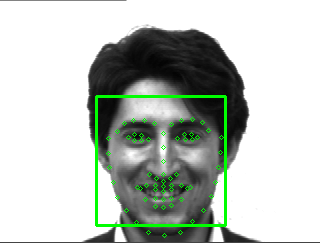

<class '_dlib_pybind11.vector'>
128
-0.134227
0.0356721
-0.0444694
-0.0130017
-0.102966
0.000494234
-0.0230015
-0.1259
0.134235
-0.0406252
0.155054
-0.0323995
-0.282545
0.00235237
-0.0400416
0.136724
-0.0780066
-0.0835504
-0.204211
-0.121356
-0.0293572
-0.00440347
0.0594059
0.032871
-0.139309
-0.229255
-0.0353953
-0.10896
0.0241237
-0.110406
-0.0717162
-0.0211244
-0.30277
-0.125381
-0.0114476
0.0325096
-0.0593563
-0.0306621
0.23338
0.0580646
-0.128055
0.115234
0.0863949
0.176328
0.260504
0.00761176
0.0176204
-0.111563
0.161189
-0.30691
0.0443131
0.134444
0.164516
0.0754396
0.0668468
-0.0649769
-0.0388894
0.133664
-0.157979
0.164911
0.12305
0.0159378
-0.0759974
-0.101119
0.178686
0.121264
-0.100187
-0.117959
0.173901
-0.151695
-0.0620024
0.0758785
-0.0726255
-0.200603
-0.306702
0.0822144
0.331138
0.195504
-0.156935
0.00779907
-0.132218
-0.0473363
-0.0486299
-0.0295579
-0.0259867
-0.0605581
-0.0100428
0.0625213
0.272076
-0.00410907
-0.00290454
0.245626
0.024533
0.00867666
-0.0251629
0.11

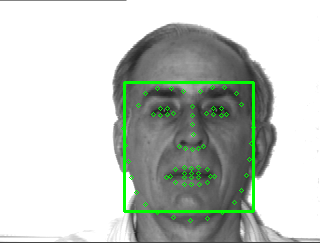

<class '_dlib_pybind11.vector'>
128
-0.0673102
0.044693
-0.0907084
-0.000676567
-0.0253035
-0.0209829
-0.0443757
-0.0976416
0.156693
-0.0943842
0.177744
-0.0496573
-0.221589
0.0306492
-0.0197619
0.0868411
-0.153246
-0.0868225
-0.21067
-0.083806
-0.0191211
-0.0191079
0.0386639
0.0252954
-0.123097
-0.2482
-0.0801223
-0.0919596
0.113542
-0.134351
-0.0870548
0.017531
-0.297214
-0.115377
-0.00622212
-0.014524
-0.0334175
0.0196829
0.240253
0.0674728
-0.141429
0.0928058
0.0681364
0.224416
0.205698
0.0104532
-0.00568135
-0.0724438
0.0770477
-0.281894
0.0518653
0.147959
0.168814
0.138327
0.0605836
-0.13339
-0.0355208
0.106755
-0.0904181
0.15946
0.109539
-0.0109891
-0.0590352
-0.0425116
0.171025
0.093177
-0.107605
-0.132334
0.10465
-0.125004
-0.00103838
0.106949
-0.031097
-0.17646
-0.275419
0.0672639
0.350238
0.131491
-0.159568
0.0159785
-0.118918
-0.11869
-0.030187
-0.0112237
-0.0923962
-0.00188202
-0.0195407
0.105723
0.218067
0.018736
0.0117495
0.163091
-0.0246807
0.000406109
0.00241393
0.1493

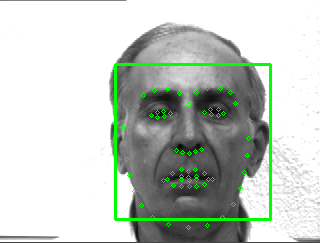

<class '_dlib_pybind11.vector'>
128
-0.183675
0.146157
0.0033414
-0.0970096
-0.151253
0.0669595
-0.0682904
-0.0880018
0.118625
-0.0377468
0.214501
-0.0157622
-0.261627
-0.0136055
-0.0552525
0.151343
-0.183238
-0.091182
-0.111832
-0.106566
0.0107556
0.0169046
0.00369832
0.105578
-0.126879
-0.31706
-0.127823
-0.097577
0.111573
-0.024401
-0.0920718
-0.021513
-0.193342
-0.0711472
0.0449492
0.0217472
0.0402763
-0.0333524
0.146246
0.00660849
-0.0702005
0.0695004
0.107294
0.265768
0.115905
0.147742
0.125611
-0.0319446
0.0629693
-0.187852
0.0618527
0.143028
0.106288
0.025126
0.0179826
-0.205156
-0.029795
0.164968
-0.122158
0.170863
0.0841775
-0.0532816
-0.0815393
-0.0625387
0.289359
0.148632
-0.150398
-0.179559
0.169519
-0.119076
-0.0241837
0.0216423
-0.140256
-0.108516
-0.239549
0.0823975
0.448539
0.196665
-0.198171
-0.0120167
-0.132635
0.0200665
0.0460561
0.0527976
-0.119193
-0.0465646
-0.136891
0.0319042
0.234918
0.0176597
0.0282211
0.234961
0.0877147
0.0181309
-0.022779
0.0832424
-0.185055

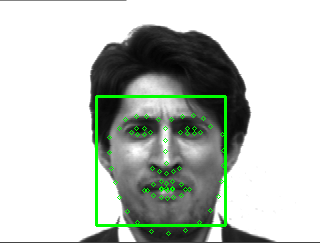

<class '_dlib_pybind11.vector'>
128
-0.151893
0.0931534
0.0963281
-0.00468604
0.013863
-0.0319085
0.0931268
-0.0727229
0.212382
-0.0598381
0.280641
-0.00738514
-0.202418
-0.151906
0.0445881
0.096812
-0.119957
-0.142899
-0.0499428
-0.0991277
0.0419751
-0.00247565
-0.011652
0.0315687
-0.116182
-0.338923
-0.0978097
-0.175416
0.0264288
-0.111685
-0.0039385
-0.0290998
-0.192568
-0.0692149
-0.153986
-0.0399502
-0.0176365
-0.0766163
0.145992
0.00897311
-0.143834
-0.041981
-0.036399
0.320269
0.131056
-0.0651518
0.0232057
-0.0229215
0.0244378
-0.249236
0.0431423
0.0920803
0.0942039
0.0364331
0.0183632
-0.0661964
-0.0520189
-0.00950397
-0.204414
0.0719931
0.0650413
-0.0179159
-0.0824047
-0.0633201
0.258243
0.153255
-0.0896705
-0.0836545
0.139009
-0.157206
-0.0215951
0.0377416
-0.114918
-0.181812
-0.279327
0.146763
0.363856
0.0939249
-0.166023
0.00491326
-0.228399
0.0221067
0.0517554
0.0270176
-0.0638278
0.0831337
-0.136015
0.0824552
0.167164
-0.041437
-0.0398094
0.241781
0.0115903
-0.0300825
0.0

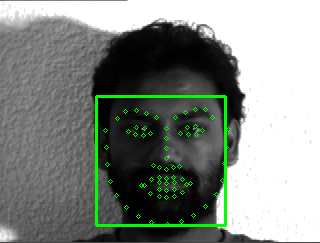

<class '_dlib_pybind11.vector'>
128
-0.111517
0.121136
0.0772898
-0.0775646
-0.0746996
-0.0529344
-0.0707911
-0.162337
0.111913
-0.138567
0.272687
-0.0252918
-0.185551
-0.147083
-0.050254
0.185725
-0.193406
-0.130232
-0.0163295
0.00414178
0.13937
0.0160009
0.0429204
0.00804798
-0.0980155
-0.323143
-0.121777
-0.0999734
0.03392
-0.0415829
-0.0382044
-0.0694172
-0.201445
-0.0633689
0.00856165
0.046367
0.00232726
-0.102761
0.177601
0.00890529
-0.195113
0.082446
0.00450138
0.229299
0.211633
0.0243094
0.0755358
-0.204163
0.137684
-0.0701539
0.0199621
0.112723
0.0830649
0.0193729
0.0216584
-0.113393
0.00898924
0.115887
-0.14782
0.000412509
0.123249
-0.0491254
-0.0244641
-0.155139
0.219963
-0.00323566
-0.148964
-0.187996
0.146725
-0.0877762
-0.0941442
0.0298101
-0.200868
-0.146925
-0.305428
0.0302781
0.379117
0.124813
-0.18823
0.0620912
-0.089254
0.030671
0.0970876
0.178065
0.0512649
0.0350805
-0.0559587
0.00559539
0.175265
-0.0732281
-0.0447614
0.188915
-0.0453875
0.0772351
-0.00903732
-0.023

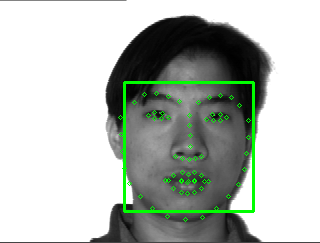

<class '_dlib_pybind11.vector'>
128
-0.129248
0.0690259
0.0192526
-0.0136642
-0.104119
-0.0243879
-0.0593391
-0.0742545
0.0818373
-0.0998089
0.1745
-0.107185
-0.229418
-0.0504748
-0.0370968
0.152182
-0.0965883
-0.129739
-0.121642
-0.0958183
0.0562583
0.0330416
-0.04217
0.0239605
-0.120619
-0.281872
-0.0261165
-0.105272
-0.0428978
-0.0863069
-0.0217647
0.0103412
-0.204495
-0.0892571
0.0114262
-0.0153742
-0.00758792
0.000633217
0.18242
0.0112064
-0.160115
0.0285586
0.126717
0.257203
0.163274
0.122116
-0.0284432
-0.051374
0.107836
-0.290524
0.0983395
0.121442
0.0817044
0.0363918
0.0967567
-0.108763
-0.00121576
0.0668428
-0.166107
0.0832178
0.114538
-0.00853125
-0.0692469
-0.0829568
0.216634
0.0930104
-0.0889032
-0.067453
0.139436
-0.140291
-0.0869635
-0.0138123
-0.0662417
-0.148305
-0.328998
0.0622071
0.403787
0.165547
-0.154876
0.0247317
-0.0268033
-0.0281353
0.0848123
-0.00221303
-0.0745602
-0.0475681
-0.0302758
0.0422754
0.189073
0.0142858
-0.0117709
0.200735
0.0179599
-0.0553807
0.018

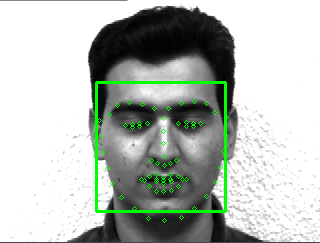

<class '_dlib_pybind11.vector'>
128
-0.16945
0.0635196
0.0113129
-0.0450887
-0.115499
-0.0127152
-0.0339553
-0.029489
0.100946
-0.100891
0.152091
-0.11321
-0.241802
-0.0263633
-0.0161831
0.12998
-0.126906
-0.137345
-0.125044
-0.0928629
0.0389092
0.00971457
-0.0668809
0.0589054
-0.159119
-0.298133
-0.0468434
-0.102241
-0.0053518
-0.122952
-0.0507969
0.0423291
-0.188992
-0.105215
0.00981584
0.00247569
0.016216
0.010128
0.182999
0.00663548
-0.169696
0.0223966
0.134622
0.287828
0.160308
0.137446
-0.028905
-0.0153486
0.138193
-0.307102
0.101745
0.111669
0.0237561
0.0480535
0.102746
-0.13573
-0.027665
0.10693
-0.169217
0.130509
0.0914637
-0.0366061
-0.0736506
-0.0795767
0.203582
0.109048
-0.0911573
-0.127152
0.164714
-0.151721
-0.065823
0.0376904
-0.0567274
-0.124344
-0.307746
0.085185
0.414365
0.162351
-0.120885
0.0153382
-0.0304668
-0.067857
0.0934685
0.00132883
-0.0829084
-0.0506374
-0.0419164
0.0562633
0.214433
0.0684231
-0.00838764
0.193875
0.0272789
-0.0393043
0.0234615
0.0889068
-0.15

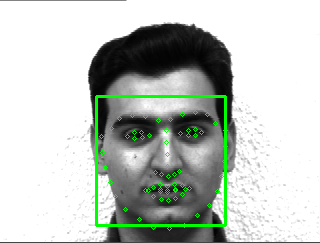

<class '_dlib_pybind11.vector'>
128
-0.107491
0.0647452
0.0624718
-0.0575961
-0.0476702
0.00731833
-0.113933
-0.138991
0.116215
-0.156664
0.180319
0.0266938
-0.204687
-0.0465276
-0.014519
0.169431
-0.141568
-0.133414
-0.0883462
-0.0740155
0.0272204
0.0359199
0.0286411
-0.0135936
-0.161434
-0.291432
-0.114701
-0.0860597
-0.0290468
-0.0220596
-0.111469
0.0105562
-0.147856
-0.0573456
0.0473318
0.118431
-0.0734335
-0.0408589
0.1674
0.0266682
-0.149393
0.0126444
0.0865426
0.239271
0.204053
0.0781325
0.0573075
-0.124191
0.0639778
-0.166253
0.0680252
0.130024
0.0536199
0.121083
0.03706
-0.104603
0.0378457
0.0752299
-0.0559983
0.0392096
0.119405
-0.0782724
-0.0639872
-0.0385369
0.247406
0.0937897
-0.114126
-0.176129
0.11117
-0.11913
-0.168751
-0.0151502
-0.175183
-0.13056
-0.300796
0.0116878
0.390418
0.122482
-0.147213
0.0540746
-0.0573316
-0.0428435
0.116744
0.103577
-0.0548982
0.0132975
-0.0324499
0.0418384
0.26614
-0.0449645
-0.0316181
0.143099
0.00621298
0.0588711
0.0388314
0.0493764
-0.08

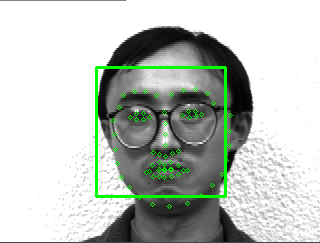

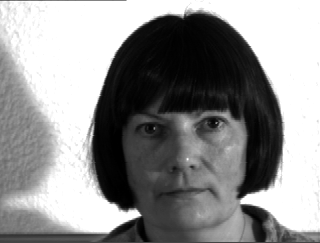

<class '_dlib_pybind11.vector'>
128
-0.153703
0.0681932
0.0732205
-0.058666
-0.134564
-0.0784253
-0.0283128
-0.127645
0.107331
-0.096228
0.184898
-0.136405
-0.165967
-0.109164
-0.0303018
0.203342
-0.171176
-0.170113
-0.0634573
0.0159149
0.0751956
-0.0103512
0.0244719
0.00209598
-0.0850469
-0.337858
-0.0712987
-0.101009
0.0489989
-0.084074
-0.101717
0.0421622
-0.224689
-0.123642
-3.60236e-05
0.106841
0.00537174
-0.0515778
0.138121
-0.0280556
-0.261122
0.0390033
0.0545502
0.221519
0.217706
0.0566052
-0.00362463
-0.134102
0.100686
-0.157239
0.00226888
0.0852101
0.0735562
0.0317271
-0.00191648
-0.0942877
0.0367376
0.072439
-0.1346
-0.00961938
0.135749
-0.0682198
-0.0176634
-0.0894566
0.24866
0.0455194
-0.0623586
-0.109207
0.132673
-0.0946873
-0.0539432
0.0221245
-0.132084
-0.0958934
-0.274774
-0.0337277
0.393097
0.0457024
-0.194181
0.0363634
-0.0799252
0.0238731
0.11624
0.11178
-0.0262221
0.0601913
-0.0968729
0.0100189
0.205319
-0.0921936
0.0382197
0.162399
0.00854901
0.0497064
0.0455543
0

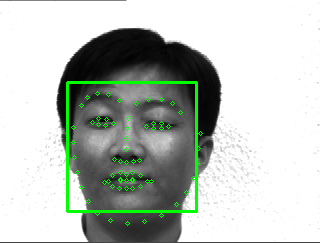

<class '_dlib_pybind11.vector'>
128
-0.170525
0.184294
0.055543
-0.0921986
-0.075169
-0.00576072
-0.0929476
-0.0692655
0.154011
-0.0675573
0.245968
0.0226408
-0.181352
-0.058466
-0.0239385
0.174141
-0.20708
-0.104084
-0.0503318
-0.0504789
0.0762004
0.0223797
-0.0178194
0.0690583
-0.166242
-0.337005
-0.0992868
-0.10535
0.0623783
-0.0414101
-0.0828924
-0.0359308
-0.187466
-0.0668965
-0.00777502
0.0225288
0.0251855
-0.0101227
0.083322
0.0147542
-0.148116
0.0804524
0.0543898
0.284585
0.179159
0.0811809
0.110322
-0.0920789
0.0433664
-0.163593
0.0643182
0.0992338
0.120388
0.0607514
0.0119354
-0.139966
0.000844002
0.152567
-0.160112
0.110935
0.0913356
-0.00987902
-0.0273784
-0.0304399
0.275401
0.113869
-0.139616
-0.150325
0.134223
-0.117831
-0.0876171
0.00583502
-0.142512
-0.152712
-0.342637
0.0632601
0.393546
0.194763
-0.21314
0.0222121
-0.128282
0.0351701
0.0773073
0.068753
-0.118795
-0.0101052
-0.100729
0.0306062
0.234775
0.0368364
-0.0144934
0.222445
0.069863
0.0153919
-0.0181984
0.058178

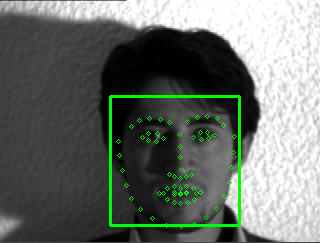

<class '_dlib_pybind11.vector'>
128
-0.162787
0.0664007
0.10304
-0.0356114
-0.100286
-0.0325119
-0.0306097
-0.000557657
0.157608
-0.0772962
0.178021
0.00400893
-0.226469
-0.00489936
0.0163234
0.119284
-0.153589
-0.124025
-0.101846
-0.111453
0.0754801
0.125265
0.012593
0.00155733
-0.215283
-0.307586
-0.11401
-0.169037
0.00984933
-0.0691466
-0.011465
0.0234578
-0.168654
-0.0987299
0.0243243
-0.00369403
-0.0628231
-0.0842299
0.106048
0.02325
-0.140511
-0.0164974
0.0699438
0.262268
0.0989098
0.100772
0.073661
-0.0298885
0.0157012
-0.235413
0.0668996
0.123093
0.0703316
0.0711529
0.140071
-0.142073
0.0744901
0.0959229
-0.209337
0.117974
0.101604
-0.0308203
0.0258584
-0.00469151
0.189302
0.0811171
-0.0643478
-0.0944538
0.130818
-0.125941
-0.0638327
0.0783701
-0.117746
-0.191698
-0.240213
0.0258649
0.462335
0.180577
-0.115934
0.00467933
-0.0691179
-0.0462835
0.0616536
0.0249432
-0.120245
-0.0250873
-0.131201
0.0767341
0.206903
0.0166547
-0.0269091
0.16724
0.0556939
-0.0816595
0.0439642
0.02811

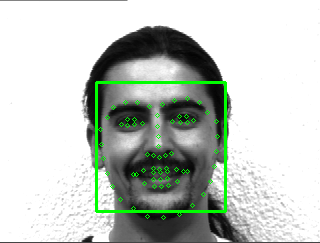

<class '_dlib_pybind11.vector'>
128
-0.151811
0.0516546
-0.0111401
-0.0483878
-0.109873
-0.0531299
0.0438427
-0.102148
0.169717
0.00439296
0.293551
-0.0387834
-0.25086
-0.0761847
-0.0453459
0.126478
-0.138713
-0.0217082
-0.114795
-0.143933
0.0480021
-0.0171604
0.03862
0.0145749
-0.157742
-0.255714
-0.0690776
-0.116979
-0.0190023
-0.124354
0.037222
0.0961014
-0.230088
-0.111085
-0.0223299
0.0335278
-0.109669
-0.0691856
0.178317
-0.00621577
-0.0963498
0.0808851
0.117501
0.203305
0.181295
-0.0248558
0.0127572
-0.0739322
0.0576189
-0.202412
0.0468771
0.140913
0.120209
0.0667755
0.0764006
-0.103809
0.00492883
0.0709135
-0.154274
0.0451143
0.106343
-0.0383689
-0.0653692
-0.0430827
0.152214
0.0955724
-0.120577
-0.0570101
0.104042
-0.0629127
-0.0129695
0.0917405
-0.139038
-0.224749
-0.239823
0.160715
0.453282
0.0877909
-0.142707
-0.0208358
-0.12742
-0.100793
-0.0107245
0.0213011
-0.0374397
-0.117
-0.10619
0.0973738
0.150061
-0.0347373
-0.0320078
0.214724
0.0313573
-0.0433917
-0.0229407
0.09071

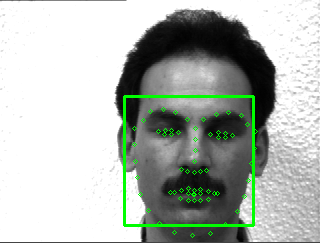

<class '_dlib_pybind11.vector'>
128
-0.0160352
0.0656921
-0.0489856
0.0155697
-0.0990073
-0.0519387
-0.0531912
-0.115966
0.109301
-0.0872797
0.180436
-0.0626219
-0.158212
0.0359603
-0.0364962
0.103632
-0.102203
-0.0641176
-0.155902
-0.0703405
-0.0076948
-0.0222711
0.00714142
0.0541849
-0.118289
-0.231801
-0.121918
-0.084698
0.105975
-0.165084
-0.0580014
0.0329517
-0.270899
-0.0812589
-0.00817774
0.0270203
-0.0519858
-0.0189642
0.209428
0.0814479
-0.10916
0.133725
0.0519033
0.228816
0.231113
-0.0326313
0.016541
-0.038818
0.0662311
-0.22806
0.0515787
0.115837
0.213949
0.117611
0.0667159
-0.10257
-0.0224075
0.106029
-0.139032
0.163506
0.102969
-0.0513865
-0.0327612
-0.0367701
0.140267
0.105616
-0.0623735
-0.109669
0.127234
-0.15161
0.00529066
0.0676492
-0.0564777
-0.162569
-0.252458
0.072221
0.366591
0.193923
-0.185143
0.00626916
-0.0873173
-0.112043
-0.0428568
-0.0238032
-0.0365034
-0.0617244
-0.0568565
0.142128
0.198218
-0.0237529
0.0315539
0.159599
-0.0477878
-0.00867438
-0.0344133
0.0

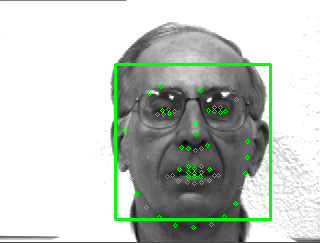

<class '_dlib_pybind11.vector'>
128
-0.0596655
0.0752414
-0.103063
0.0054614
-0.0505814
-0.00658723
-0.050933
-0.100522
0.164333
-0.0733073
0.178888
-0.0628936
-0.229254
0.0124943
-0.0566266
0.103619
-0.153572
-0.0660127
-0.199443
-0.0898408
0.00840809
-0.0144265
0.0348606
0.0278819
-0.127302
-0.24773
-0.0775908
-0.105102
0.101353
-0.151682
-0.0845686
0.0339257
-0.298527
-0.123733
-0.0158024
-0.0221908
-0.0499022
0.0296164
0.227724
0.0498975
-0.128391
0.115603
0.0766704
0.228088
0.211493
0.0183983
-0.0139445
-0.0619414
0.0749233
-0.276956
0.013584
0.160777
0.168459
0.140834
0.065786
-0.123181
-0.022435
0.0942791
-0.105144
0.144444
0.0924433
-0.0299125
-0.0405694
-0.0227672
0.179724
0.071287
-0.0915329
-0.122305
0.119916
-0.126961
0.0122615
0.112172
-0.0313158
-0.186844
-0.282334
0.0682891
0.358102
0.145585
-0.156951
0.0246305
-0.12397
-0.119515
-0.0324361
-0.0318311
-0.0827569
-0.0236162
-0.0464449
0.112237
0.2192
-0.0140018
0.02432
0.187686
-0.00387292
-0.00103163
-0.013117
0.13703
-0

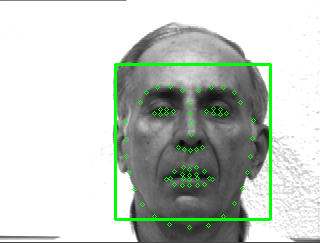

<class '_dlib_pybind11.vector'>
128
-0.188512
0.0932444
0.0749027
-0.0165076
-0.000950217
-0.0476797
-0.0134703
-0.086395
0.128041
0.00974724
0.22903
-0.0404215
-0.222049
-0.0753332
0.0453797
0.0950833
-0.126986
-0.0827147
-0.0754095
-0.0873744
0.0356276
-0.00914309
0.0569032
0.0148207
-0.153235
-0.281925
-0.145055
-0.159581
0.026693
-0.0698456
-0.0337312
0.00338331
-0.251152
-0.119238
-0.0105495
0.0903465
-0.00174119
-0.0233033
0.166386
0.0568384
-0.128144
0.00666738
0.0431649
0.243832
0.205276
0.0973686
-0.0343107
-0.0220629
0.0901297
-0.242248
0.115497
0.0980596
0.15243
0.0768891
0.0183319
-0.100051
0.0651231
0.0494577
-0.208551
0.0409793
0.0545502
-0.150571
-0.106041
0.00576209
0.245544
0.176048
-0.0729153
-0.103764
0.14139
-0.0838298
-0.0667881
0.0932427
-0.126888
-0.109252
-0.334756
0.120287
0.425218
0.0647243
-0.206614
0.0416191
-0.123795
-0.0113106
0.00987051
0.0906485
-0.0937681
0.0245568
-0.10519
0.0165737
0.169575
-0.0483587
-0.0471463
0.186486
-0.0187076
0.0883362
0.0622435

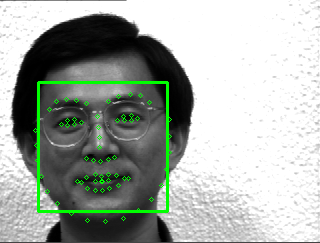

<class '_dlib_pybind11.vector'>
128
-0.162611
0.103799
0.0826116
-0.00563904
0.0198688
-0.0996632
0.0420401
-0.14789
0.182945
-0.122488
0.258319
-0.00214558
-0.202178
-0.116178
-0.0080227
0.0657511
-0.162575
-0.108437
-0.032095
-0.140751
0.0288977
-0.0381565
0.0108274
0.0179378
-0.138796
-0.301303
-0.0901444
-0.19666
0.0273273
-0.0190454
0.0534655
-0.0329137
-0.186443
-0.0311891
-0.0789966
-0.000134248
0.0399652
0.0119704
0.183589
-0.00931177
-0.130321
-0.050368
-0.0381411
0.2905
0.167052
0.0063034
0.0322262
-0.0393846
0.0731821
-0.250998
0.0730697
0.0828088
0.127007
0.00212038
0.0357905
-0.149112
-0.0296943
0.014913
-0.220469
0.0982074
0.061862
-0.0349308
-0.0757774
0.0271874
0.291206
0.136276
-0.174749
-0.0159503
0.202179
-0.18539
0.0215855
0.0497034
-0.0937355
-0.205039
-0.266556
0.0966066
0.517615
0.150601
-0.154852
-0.0103587
-0.238612
-0.00622658
0.0730944
0.066238
-0.0808756
0.0387391
-0.0669343
0.0709315
0.169802
0.00736672
-0.120333
0.236176
-0.034224
0.0280656
-0.0217712
0.00

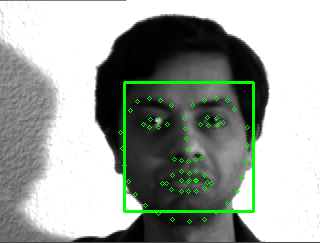

<class '_dlib_pybind11.vector'>
128
-0.187527
0.111312
0.0409148
-0.0414362
-0.069972
-0.0605699
-0.0391507
-0.110167
0.112559
-0.0514175
0.298323
-0.148182
-0.183855
-0.110355
0.0061536
0.155536
-0.206602
-0.102406
-0.0606118
-0.0288322
0.0815966
-0.0515688
-0.0250117
0.0150957
-0.142481
-0.330805
-0.0771578
-0.110158
0.0395029
-0.0635566
-0.0188921
0.0292324
-0.226748
-0.114878
0.0101402
0.077596
0.0159099
0.0315203
0.151544
-0.019787
-0.189322
0.0052142
0.0286687
0.278745
0.131289
0.0899526
-0.0150358
-0.0670971
0.0685648
-0.210879
0.0600098
0.119817
0.127886
0.0399093
0.0166263
-0.0845055
-0.00419915
0.0975437
-0.173174
0.0265952
0.134165
-0.0568589
-0.0704051
-0.105507
0.304146
0.111116
-0.14126
-0.107596
0.112646
-0.0355366
-0.0704734
0.0508875
-0.109223
-0.163553
-0.336169
0.0644702
0.384145
0.0512284
-0.263202
-0.0137433
-0.10775
0.0140396
0.126079
0.0688592
-0.0149838
0.0540676
-0.0746506
-0.00179479
0.180909
-0.0817969
-0.0307311
0.185526
-0.00923272
0.0337423
0.00613699
0.01

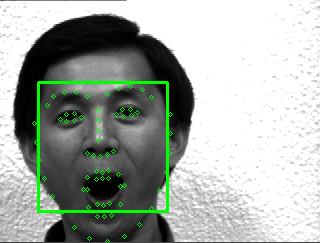

<class '_dlib_pybind11.vector'>
128
-0.14868
0.073456
0.067528
-0.0600433
-0.0594802
-0.00531925
-0.125335
-0.142447
0.0912329
-0.140216
0.221256
-0.0142298
-0.203712
-0.0404826
-0.0335842
0.180399
-0.158983
-0.0965421
-0.0513832
-0.0512161
0.0522297
0.0296302
-0.0105107
0.029119
-0.114346
-0.293656
-0.125443
-0.0471923
-0.0481679
-0.0734991
-0.0523641
0.00284567
-0.148331
-0.0319682
0.0533507
0.0770891
-0.0342886
0.00589013
0.185727
0.0190819
-0.126603
0.0550693
0.110019
0.246613
0.200438
0.0919163
-0.00152889
-0.105411
0.0885708
-0.235857
0.0398901
0.121554
0.0736206
0.0857919
0.0250427
-0.126082
0.00134727
0.0843448
-0.0657606
0.0949838
0.0961735
-0.122845
-0.0546844
-0.0229728
0.2286
0.0822925
-0.131749
-0.18809
0.0797457
-0.106687
-0.125894
0.0237476
-0.151509
-0.161034
-0.305091
0.057488
0.403174
0.120075
-0.186795
0.0313839
-0.0670063
-0.0302135
0.0827046
0.0511645
-0.0448766
-0.0604659
-0.0643327
0.0310609
0.260888
-0.0333721
-0.0140691
0.200418
-0.000716455
0.101642
0.00251813

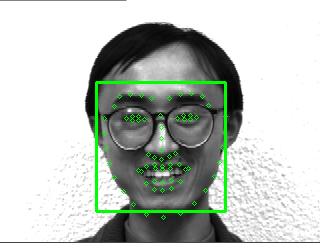

<class '_dlib_pybind11.vector'>
128
-0.120018
0.100403
0.0609458
-0.0633804
-0.0827133
-0.0248233
-0.0188618
-0.0702255
0.119796
0.00622077
0.257582
-0.0050162
-0.178187
-0.0368407
0.00845832
0.108785
-0.0874402
-0.0794844
-0.10573
-0.123931
0.0199577
0.00217538
-0.0025558
0.0493719
-0.162279
-0.294882
-0.131452
-0.122908
0.0241076
-0.157836
-0.0310684
-0.039074
-0.23089
-0.0479508
-0.0551966
0.027131
-0.0705946
-0.10854
0.112641
0.0633007
-0.113186
0.0371155
0.0730416
0.183471
0.211992
0.0152853
0.0608455
0.000927895
-0.00672927
-0.160708
0.101969
0.087756
0.137026
0.0934941
0.028974
-0.115881
-0.0300567
0.0213204
-0.0976185
0.067549
0.0704372
-0.0830867
-0.0980415
-0.0146549
0.212109
0.144466
-0.0867952
-0.10083
0.106196
-0.123074
-0.0467447
0.0455096
-0.117869
-0.128351
-0.243733
0.17453
0.417997
0.113662
-0.212349
-0.0151902
-0.149491
-0.0128697
-0.0191237
0.0335559
-0.0735886
-0.0163316
-0.138009
0.0674134
0.183786
-0.0330125
-0.0117666
0.184704
-0.0204095
0.0166686
0.0276893
0.07

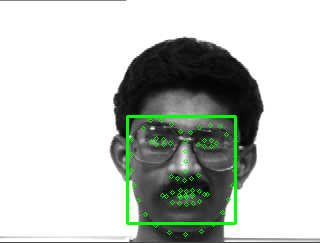

<class '_dlib_pybind11.vector'>
128
-0.153656
0.109258
0.0781745
-0.0118687
0.00913808
-0.0834453
0.0842366
-0.123729
0.196095
-0.0412818
0.251121
0.023785
-0.203325
-0.171911
0.029036
0.0982369
-0.138645
-0.185728
-0.0575299
-0.0687956
0.0107776
-0.0150542
0.0287448
0.0427486
-0.131415
-0.367654
-0.10598
-0.114799
-0.00700624
-0.101436
0.0417402
-0.0039999
-0.232192
-0.0557142
-0.111604
0.0330619
-0.0302853
-0.0533368
0.149631
-0.00377862
-0.149372
-0.0635881
-0.00499055
0.31697
0.134422
-0.045778
0.0430257
-0.0137258
0.00600173
-0.262172
0.0581738
0.0910172
0.0807614
0.0365209
0.0430301
-0.0632375
-0.0292509
0.0317663
-0.213758
0.040905
0.0444176
-0.0211133
-0.0671897
-0.0268656
0.265797
0.147549
-0.0914253
-0.0596512
0.155516
-0.180461
-0.0252412
0.0309091
-0.0653911
-0.191439
-0.31349
0.116244
0.366239
0.104618
-0.138053
0.0144516
-0.19081
0.0122552
0.0142649
-0.0124152
-0.121493
0.124637
-0.171384
0.114834
0.190484
0.0118948
-0.0470257
0.240141
0.0147594
-0.0251616
0.0612613
0.051

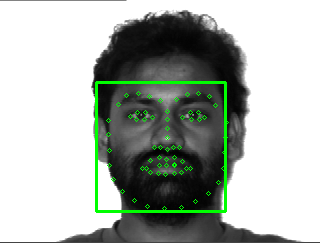

<class '_dlib_pybind11.vector'>
128
-0.11766
0.072983
0.0570904
0.00203585
-0.0581031
-0.0348593
-0.0311147
-0.204915
0.141173
-0.0337468
0.250241
-0.0534702
-0.201024
-0.168569
-0.0250222
0.13328
-0.17951
-0.151934
-0.0198869
-0.0850104
0.0697841
-0.0276209
0.0459891
0.0126696
-0.155898
-0.313079
-0.120966
-0.162823
0.0551311
-0.0477578
-0.112235
0.0199808
-0.225427
-0.0975289
-0.0148144
0.092334
0.00281789
-0.0526712
0.127684
-0.0287444
-0.180997
0.0488855
0.0625599
0.222786
0.188852
0.0442026
-0.0373086
-0.0874369
0.130172
-0.15647
0.119244
0.128674
0.167421
0.0635244
-0.0117139
-0.0972092
0.0191101
0.0682561
-0.154399
0.0202283
0.0938578
-0.110751
-0.0622996
-0.0388059
0.202448
0.126311
-0.0992127
-0.0898327
0.0682723
-0.121745
-0.0963981
0.00825717
-0.153895
-0.121588
-0.387358
0.0491958
0.429522
0.0453163
-0.249021
0.0199131
-0.102229
0.0306362
0.111276
0.118426
-0.0548374
0.0380475
-0.160712
-0.0198016
0.182844
-0.0860141
-0.0302147
0.224133
-0.0047182
0.117965
0.0440422
0.09242

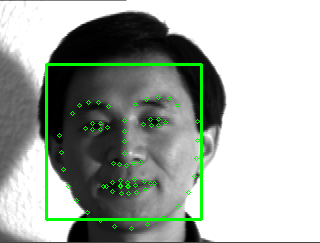

<class '_dlib_pybind11.vector'>
128
-0.192328
0.078107
-0.0100124
-0.0395173
-0.143324
-0.0692268
0.0443394
-0.0558411
0.166765
0.0887354
0.220647
-0.0285513
-0.253864
-0.0324002
-0.0643167
0.0967201
-0.147496
0.0186762
-0.115207
-0.130607
0.0729285
0.0302168
0.0121413
0.019053
-0.137757
-0.29218
-0.0826305
-0.0685331
-0.0266486
-0.12725
0.0446898
0.121141
-0.237736
-0.132598
-0.000991464
0.0764662
-0.0755386
0.0073961
0.101121
0.0212234
-0.108989
0.090811
0.152295
0.247086
0.207858
0.0901924
-0.00764386
-0.0371253
0.0720237
-0.246829
0.066163
0.152995
0.111146
0.0354202
0.10455
-0.135343
-0.0257426
0.0675409
-0.175822
0.106225
0.12113
-0.0703014
-0.0762674
-0.0556173
0.151925
0.106967
-0.130283
-0.0942728
0.113251
-0.123443
-0.0239109
0.108455
-0.101796
-0.224723
-0.294994
0.172944
0.453048
0.102327
-0.146593
-0.0279945
-0.120938
-0.0470002
0.0128868
0.0159335
-0.0411207
-0.106652
-0.164611
0.0482028
0.164386
-0.0152316
-0.0432906
0.240111
0.0372321
-0.0160257
-0.0484386
0.117129
-0.1

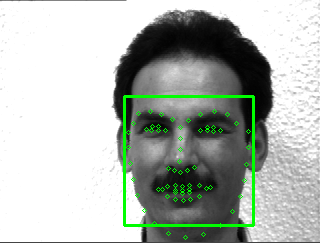

<class '_dlib_pybind11.vector'>
128
-0.156397
0.0796807
0.00722897
-0.0385912
-0.0934133
-0.0513805
-0.015279
-0.0678393
0.169678
-0.100368
0.207702
-0.0672679
-0.235597
-0.053502
-0.0519435
0.182934
-0.159364
-0.155382
-0.0838905
-0.112062
0.0478282
-0.0211636
-0.0334223
0.0859828
-0.176795
-0.337878
-0.0723804
-0.110826
0.00231255
-0.11208
-0.136136
0.0214548
-0.22746
-0.133187
0.00185217
-0.0424859
0.0243307
-0.0523578
0.149307
0.0470888
-0.146914
0.040004
0.105899
0.286359
0.165574
0.102648
-0.00950983
-0.0501299
0.111947
-0.244281
0.0815292
0.107175
0.0791513
0.031115
0.0531967
-0.0897528
-0.0365207
0.101583
-0.215924
0.115596
0.0950591
-0.0296734
-0.0767554
-0.0835773
0.212385
0.158235
-0.0881289
-0.0723824
0.190148
-0.14614
-0.0369633
-0.0657646
-0.077799
-0.186047
-0.281333
0.0792734
0.360471
0.210339
-0.130109
0.0345876
-0.0563968
-0.0157652
0.0908019
0.0173469
-0.0988875
-0.0131077
-0.0389255
0.0850509
0.202693
0.0624831
-0.00960816
0.252205
-0.00895471
-0.032411
0.0344939
0.

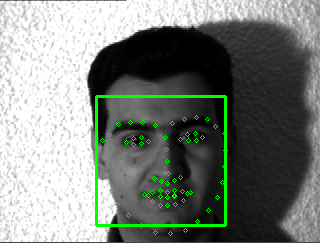

<class '_dlib_pybind11.vector'>
128
-0.162099
0.0661438
0.0491192
-0.095112
-0.143734
-0.057718
-0.029609
-0.155545
0.114166
-0.123355
0.194196
-0.115502
-0.167306
-0.0853991
-0.0551331
0.201889
-0.177714
-0.151935
-0.0728338
-0.0109419
0.0530291
-0.00877833
0.0182392
0.0221528
-0.0727939
-0.31302
-0.0682372
-0.0945708
0.0416506
-0.0722214
-0.087892
0.0240302
-0.221108
-0.0999919
0.00899915
0.0910726
0.00897703
-0.0647715
0.158499
-0.0253992
-0.228175
0.0115261
0.0640016
0.210272
0.226079
0.0195577
-0.0196119
-0.133641
0.125446
-0.162551
0.00316231
0.0719661
0.0733239
0.0294816
0.00686155
-0.0927155
0.0436444
0.0886845
-0.112146
-0.0107391
0.124509
-0.0877964
-0.059635
-0.08993
0.236685
0.0526841
-0.0845996
-0.110594
0.133667
-0.0900586
-0.0462451
0.00840609
-0.127001
-0.100209
-0.260325
-0.0216828
0.390799
0.0651581
-0.217175
0.0208426
-0.0662442
0.0256328
0.136849
0.112346
-0.0185592
0.0227488
-0.0761572
0.00545853
0.194863
-0.0795593
0.0274093
0.180862
-0.00550441
0.0368024
0.050343

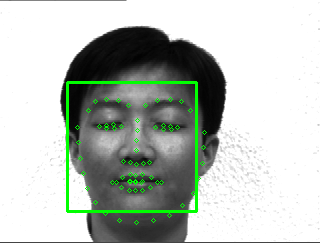

<class '_dlib_pybind11.vector'>
128
-0.203924
0.119542
-0.00622632
-0.0973033
-0.129671
0.0267677
-0.0520569
-0.0231713
0.111079
-0.0437412
0.268634
-0.0751596
-0.34156
-0.093016
0.0118367
0.131691
-0.0792226
-0.0563216
-0.221014
-0.157338
0.00237839
0.0916196
0.0577239
-0.0401786
-0.172048
-0.347561
-0.0678075
-0.0255856
0.014495
-0.0896266
0.00391778
0.042942
-0.147839
-0.0743976
0.0411508
0.121963
-0.0899071
-0.0358113
0.175936
-0.0240459
-0.151399
0.0144854
0.104005
0.244693
0.22533
0.0431194
-0.0252526
-0.0417273
0.101662
-0.284563
0.0883911
0.1669
0.179673
0.00514183
0.189373
-0.0368684
-0.0476774
0.261457
-0.168322
-0.00109116
0.0361358
-0.0501808
-0.0933034
-0.161173
0.23009
0.18763
-0.199735
-0.0946342
0.201577
-0.0759198
-0.0556835
0.0800265
-0.0720697
-0.167809
-0.282961
0.0892589
0.353745
0.0909499
-0.200129
-0.0137645
-0.0315124
-0.0523629
-0.00612868
-0.00044699
-0.169664
-0.117317
-0.076006
0.000525296
0.209532
-0.0227441
-0.0205805
0.240657
0.0406191
0.035356
0.0511346


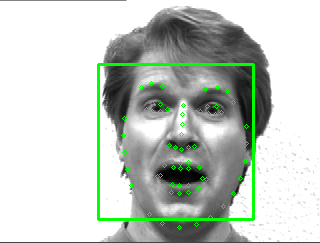

<class '_dlib_pybind11.vector'>
128
-0.159343
0.048695
0.0320476
-0.0723871
-0.170829
-0.0765316
-0.00955532
-0.105918
0.0957193
-0.116758
0.198238
-0.118981
-0.184673
-0.0877219
-0.0294208
0.178461
-0.195412
-0.13598
-0.0727106
0.00829345
0.0613884
-0.0295046
-0.0171859
-0.00283273
-0.0998056
-0.353884
-0.0723449
-0.100166
0.0485577
-0.104578
-0.081348
0.0448838
-0.215914
-0.102183
-0.0203381
0.0592224
-0.000294417
-0.0390365
0.150181
0.0107342
-0.226089
-0.0161502
0.0263899
0.229478
0.182318
0.046809
0.0151836
-0.0894588
0.08168
-0.197713
0.0197634
0.0678391
0.0429294
0.0410659
0.00559466
-0.104529
0.0295008
0.0564419
-0.129736
0.0358387
0.139051
-0.0910846
-0.0590953
-0.0729565
0.269313
0.051248
-0.066945
-0.0950657
0.134018
-0.107427
-0.0491817
-0.00194382
-0.103048
-0.122022
-0.268281
0.0105291
0.378701
0.103313
-0.210686
-0.00765661
-0.0758206
0.000338443
0.178442
0.0956752
-0.0133907
0.0565228
-0.094703
0.0370676
0.20576
-0.0803321
0.0115488
0.187399
0.0056095
0.0370992
0.055534

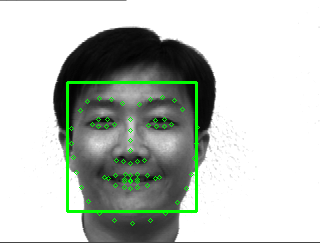

<class '_dlib_pybind11.vector'>
128
-0.10365
0.025545
-0.104186
0.029855
-0.0816777
-0.0185599
-0.0216733
-0.081734
0.162777
-0.0945667
0.116039
-0.0823955
-0.239484
0.0597451
-0.00249673
0.129757
-0.113814
-0.0923392
-0.226156
-0.101096
-0.043182
-0.00785539
0.0312681
0.0338181
-0.139006
-0.276885
-0.083165
-0.117405
0.0573304
-0.137472
-0.0920012
0.00556275
-0.262915
-0.104779
-0.00595803
-0.00260293
-0.0527792
-0.00953767
0.241884
0.1046
-0.154297
0.0775067
0.0454065
0.23924
0.177636
0.0401371
-0.0134497
-0.0980962
0.114534
-0.281546
0.0706907
0.102557
0.165553
0.0933398
0.0806227
-0.136277
-0.00889337
0.0661055
-0.149275
0.156032
0.0876172
-0.0102194
-0.101389
-0.0609999
0.217915
0.132765
-0.0750605
-0.103216
0.180217
-0.13624
0.016172
0.0776987
-0.0187704
-0.20406
-0.279708
0.0585723
0.343817
0.11443
-0.18999
-0.0144991
-0.080991
-0.101759
-0.012221
0.028928
-0.107116
-0.0204222
-0.0201096
0.0872253
0.234275
-0.0314278
0.0168267
0.203551
0.0113499
-0.0160007
0.0221203
0.11433
-0.1

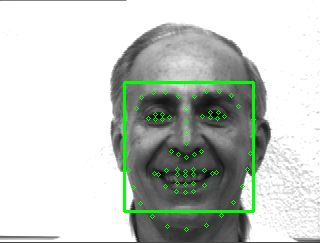

<class '_dlib_pybind11.vector'>
128
-0.130818
0.115533
0.0211734
-0.0308111
-0.0473069
-0.0394943
-0.0485431
-0.138684
0.151323
-0.0260082
0.273483
-0.08199
-0.184517
-0.128023
0.00138018
0.127778
-0.164829
-0.117081
-0.0476848
-0.0339694
0.0926399
0.0149449
0.0304675
0.00366762
-0.181988
-0.290471
-0.113339
-0.152944
0.0387693
-0.0348283
-0.0577519
0.0326622
-0.226674
-0.157223
0.0449306
0.0989541
-0.0128087
0.00608312
0.140694
0.0577889
-0.173873
0.0183377
0.0538159
0.279128
0.164627
0.123439
-0.0189544
-0.089749
0.0848756
-0.182778
0.0609139
0.133932
0.130852
0.0665563
0.0377729
-0.0909516
0.0568617
0.0697494
-0.201839
0.00517347
0.0940719
-0.0819502
-0.0526546
-0.0483062
0.270232
0.120526
-0.0856606
-0.106212
0.118692
-0.05658
-0.134438
0.0678404
-0.152568
-0.123633
-0.361609
0.0247523
0.426122
0.0428521
-0.220789
0.0284848
-0.0639334
0.00185379
0.112553
0.104414
-0.0142256
0.0279672
-0.0944045
-0.0232206
0.191408
-0.104004
-0.0365634
0.148557
-0.0200179
0.0765144
0.0399156
0.04033

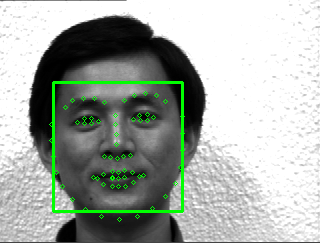

<class '_dlib_pybind11.vector'>
128
-0.155685
0.125022
0.0402298
-0.0771331
-0.0530899
-0.0776927
-0.0332143
-0.0799756
0.180238
-0.0240163
0.233358
-0.0147641
-0.171459
-0.0396594
-0.0208126
0.0715621
-0.0996248
-0.124351
-0.103596
-0.124867
0.0482126
-0.0166668
-0.0136271
0.0511335
-0.206918
-0.241801
-0.130512
-0.146789
0.00464942
-0.0966178
-0.0024844
-0.00704273
-0.268738
-0.0951314
-0.0904007
0.0121117
-0.00858957
-0.0296294
0.112544
0.037954
-0.136846
0.0204863
0.0586862
0.228964
0.170013
0.0352486
0.0363902
-0.00796092
-0.0123794
-0.15621
0.112239
0.0870791
0.144649
0.0563718
0.0634104
-0.16239
-0.0249915
0.0585642
-0.152895
0.0715987
0.061801
-0.00378365
-0.0765163
-0.0210108
0.266367
0.163642
-0.0995665
-0.0861929
0.166019
-0.102439
-0.016392
0.0817223
-0.0897472
-0.150176
-0.280522
0.169951
0.440103
0.115263
-0.199268
0.00992778
-0.172232
-0.0313981
0.00201708
-0.0215806
-0.130884
0.0492379
-0.135571
0.0469382
0.177926
0.0218269
-0.0474446
0.185071
0.0070475
-0.0269663
0.031

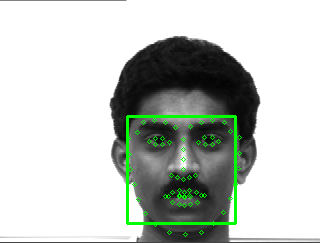

<class '_dlib_pybind11.vector'>
128
-0.141771
0.0838915
0.137994
-0.0237536
-0.00822595
-0.0829665
0.0173978
-0.0644078
0.0816258
-0.00963588
0.208334
-0.0781536
-0.167656
-0.103442
0.0362776
0.122098
-0.155325
-0.116681
-0.0589335
-0.140493
0.0486188
0.00895598
-0.0324617
0.0196676
-0.133762
-0.320254
-0.114908
-0.194771
0.0497508
-0.124117
-0.0239678
-0.0137931
-0.209572
-0.00514327
-0.0835844
0.00198617
0.0349371
-0.0804062
0.100021
0.0381567
-0.128399
0.0129055
0.0746531
0.181239
0.201928
0.0301193
0.0362365
0.009214
-0.0174745
-0.146291
0.0824595
0.077115
0.114828
0.101444
0.0104232
-0.133777
-0.0365184
-0.0640486
-0.136955
0.0774896
0.0761779
-0.0761739
-0.0797779
0.0417929
0.226349
0.100873
-0.0742359
-0.111626
0.122107
-0.164422
-0.0527716
0.0558442
-0.114229
-0.0679803
-0.257891
0.158032
0.425147
0.0773157
-0.185065
-0.00126446
-0.204552
-0.0349738
0.0345667
0.0501234
-0.0676484
0.00641112
-0.12389
0.0694239
0.178731
-0.0256149
-0.0245641
0.167911
-0.0300576
0.0268035
-0.02846

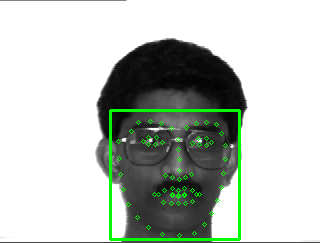

<class '_dlib_pybind11.vector'>
128
-0.140411
0.0345939
0.0630634
-0.00989581
0.0534874
-0.13063
-0.00568816
-0.106498
0.162748
-0.129973
0.255246
0.0112704
-0.217077
-0.113466
0.0397437
0.0984894
-0.129746
-0.126412
-0.036476
-0.107434
0.0581486
-0.0173078
0.0207453
0.00494373
-0.204953
-0.320628
-0.116639
-0.10749
0.00146878
0.0229228
0.0266867
-0.0108239
-0.212869
-0.0424576
0.00697832
0.0521184
-0.00487318
0.00196024
0.182744
0.0238322
-0.117736
-0.0722946
-0.015879
0.250662
0.0900987
0.00830834
0.0744241
-0.0634517
-0.0179928
-0.280591
0.094476
0.10958
0.127263
0.0385475
0.080905
-0.125535
0.0203815
0.0900029
-0.210057
0.092435
0.0740325
-0.0220297
-0.0751448
0.0141036
0.29036
0.137116
-0.16679
-0.0276058
0.187445
-0.126166
0.00169151
0.0147699
-0.0620505
-0.237006
-0.309447
0.0748922
0.406695
0.178753
-0.17865
0.0528271
-0.190828
0.0348892
0.0793942
-0.0136044
-0.125024
0.0829063
-0.0777237
0.088091
0.158013
0.0302291
-0.0698064
0.215392
-0.0144054
0.0361813
0.0473012
-0.00368689

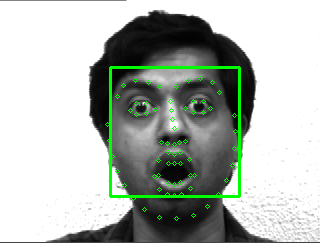

<class '_dlib_pybind11.vector'>
128
-0.119341
0.0949543
-0.0286482
-0.0721365
-0.227423
-0.0614335
0.0342242
-0.0623404
0.12534
0.0298182
0.197623
-0.0780436
-0.199418
-0.0437937
-0.00270484
0.0927363
-0.177983
-0.0708104
-0.15195
-0.0499495
0.00423783
0.0175432
-0.00198098
0.0264364
-0.0876738
-0.284615
-0.101064
-0.0791481
0.100547
-0.116813
0.0165669
0.155779
-0.19762
-0.102608
0.0333809
0.0389606
-0.105774
-0.089424
0.196494
-0.0182799
-0.183349
0.0282588
0.0711215
0.232527
0.271805
-0.0623596
0.0105955
-0.0599709
0.094297
-0.23345
0.039244
0.177814
0.121999
0.0538356
0.0393163
-0.0586502
0.00524041
0.143392
-0.221502
-0.0027143
0.136495
-0.142988
-0.121148
-0.103751
0.136455
0.147017
-0.0843434
-0.187243
0.161241
-0.165794
-0.0799444
0.106313
-0.0958211
-0.138152
-0.290417
0.0539938
0.406046
0.141473
-0.156233
-0.00261406
-0.0994267
-0.0702037
-0.000330314
0.0516301
-0.118231
-0.0749281
-0.125049
0.089155
0.168661
-0.0441425
-0.0143475
0.195252
0.07365
-0.0150132
0.0201938
0.04202

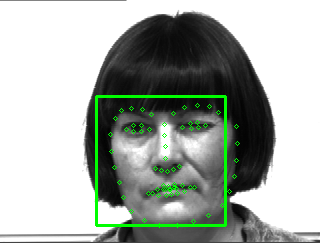

<class '_dlib_pybind11.vector'>
128
-0.169169
0.0787751
-0.0103191
-0.0436461
-0.126196
-0.0967652
0.0206225
-0.0842408
0.185665
0.0455905
0.251941
-0.0356076
-0.24597
-0.0517661
-0.0339929
0.0980549
-0.155495
0.00905179
-0.101528
-0.118586
0.0681307
0.00522052
0.0325966
0.0363
-0.135501
-0.309162
-0.112004
-0.0969536
-0.00276534
-0.133184
0.0175191
0.0962285
-0.236772
-0.136452
-0.0326593
0.07736
-0.0982615
-0.0383256
0.149414
0.0378342
-0.0965153
0.0809663
0.128463
0.226694
0.196605
0.0601085
0.0293534
-0.0438133
0.0822723
-0.214055
0.0625032
0.149538
0.127904
0.0588587
0.0921308
-0.167033
-0.0190701
0.0695286
-0.203405
0.0945755
0.121565
-0.0434331
-0.080692
-0.0258404
0.190978
0.132286
-0.136129
-0.0660853
0.123657
-0.106433
0.00260514
0.0994559
-0.123421
-0.236238
-0.263015
0.175137
0.446586
0.0873239
-0.145462
-0.0373956
-0.139204
-0.0799298
0.0056757
0.0215357
-0.0395926
-0.0900984
-0.163379
0.0651865
0.143448
-0.0181803
-0.0215808
0.236398
0.0448299
0.00876558
-0.0367035
0.1104

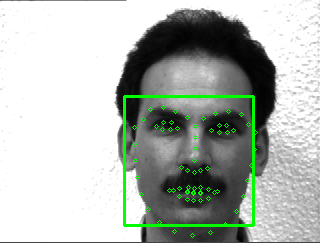

<class '_dlib_pybind11.vector'>
128
-0.0410982
0.0957748
0.0680581
-0.00395393
-0.0315117
-0.0989212
-0.0256097
-0.0674094
0.197383
-0.0439375
0.232205
-0.00290149
-0.258494
0.0792744
-0.155081
0.167699
-0.081428
-0.0436277
-0.156288
-0.122306
0.0537088
0.0660275
0.00718766
0.0131225
-0.131465
-0.217739
-0.125059
-0.0922865
0.0888639
-0.0894441
-0.0290998
0.0388535
-0.155273
-0.0889826
0.0475248
-0.0466786
-0.0413683
-0.0402771
0.251566
0.145098
-0.162168
0.115026
0.0518774
0.333424
0.149271
0.0525175
0.0513735
-0.116906
0.0472814
-0.27986
0.0495458
0.145937
0.162701
0.0740817
0.128507
-0.193519
0.018001
0.0988273
-0.205643
0.168217
0.135667
-0.00510864
-0.0449805
-0.02099
0.158307
0.113186
-0.131051
-0.0468049
0.261101
-0.134358
0.0340753
0.0697678
-0.0730277
-0.183505
-0.2372
0.0488887
0.485067
0.192582
-0.169553
-0.00454935
-0.119557
-0.00243611
0.0445207
-0.0266105
-0.153732
-0.0519237
-0.0542307
0.0429536
0.1766
0.00713085
-0.00141969
0.241545
0.0417692
-0.00865405
-0.012938
0.066

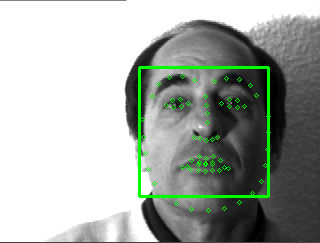

<class '_dlib_pybind11.vector'>
128
-0.138175
0.0871485
0.0110446
-0.0429292
-0.212291
-0.0377062
0.0185396
-0.0620922
0.114189
-0.0405894
0.191352
-0.105441
-0.25758
0.00550437
-0.0225743
0.155099
-0.162365
-0.110415
-0.181794
-0.0933441
0.0676396
0.0679215
-0.0264987
0.0756055
-0.139474
-0.275505
-0.0571684
-0.0720929
0.0350352
-0.112241
-0.00156496
0.0499651
-0.204928
-0.0363309
0.0163333
0.0651799
-0.0733774
-0.108992
0.190981
-0.00346428
-0.221878
0.0463677
0.0825991
0.181358
0.268716
-0.032745
-0.0167966
-0.105256
0.103633
-0.240145
-0.0659899
0.207318
0.0753786
0.0654186
0.0194945
-0.0692977
-0.00527304
0.157169
-0.188935
-0.043906
0.0843952
-0.134622
-0.0493664
-0.0774686
0.162642
0.0772672
-0.116147
-0.120913
0.156159
-0.20278
-0.0994902
0.0713839
-0.0742847
-0.156803
-0.302617
0.0319506
0.411306
0.115336
-0.189134
0.0158696
-0.0827683
-0.02536
0.0245581
0.0571123
-0.121645
-0.0507103
-0.155729
0.0846278
0.219404
-0.0486035
0.0732499
0.250027
0.085376
-0.00380927
0.0589355
0.0

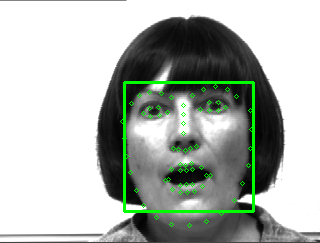

<class '_dlib_pybind11.vector'>
128
-0.147927
0.128954
0.0234724
-0.0191219
-0.0551145
-0.0509632
-0.0615425
-0.122045
0.120346
-0.00337244
0.247893
-0.120046
-0.209727
-0.11942
-0.00393879
0.144474
-0.158326
-0.103923
-0.0639021
-0.0730992
0.0613981
-0.000922313
0.0517323
0.00604058
-0.197234
-0.294792
-0.0794106
-0.148205
0.0484361
-0.0365779
-0.0838029
0.0295221
-0.238378
-0.151737
0.0641502
0.106386
-0.00715461
0.016316
0.1578
0.0349478
-0.170424
0.0322569
0.0621075
0.261578
0.172158
0.112098
-0.0306325
-0.0881267
0.0877787
-0.18532
0.0821775
0.140154
0.0974211
0.0745144
0.0340692
-0.0843669
0.0439968
0.0827669
-0.200599
0.0111782
0.107469
-0.0857647
-0.0804171
-0.0604493
0.235553
0.124573
-0.0954166
-0.105977
0.118548
-0.0690809
-0.0853157
0.0799247
-0.112465
-0.120665
-0.369098
0.0338699
0.41443
0.0760947
-0.228086
0.00279576
-0.0581721
0.00245775
0.12725
0.0837901
-0.028657
0.0222078
-0.076609
-0.0106401
0.170182
-0.0797327
-0.0513092
0.15857
-0.00138084
0.0874438
0.0434015
0.07

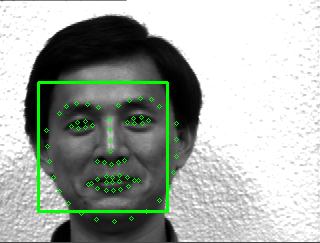

<class '_dlib_pybind11.vector'>
128
-0.167233
0.0544275
0.119507
-0.0319652
-0.0821191
-0.00151721
-0.0154876
-0.0151342
0.160905
-0.0384694
0.203045
-0.0137886
-0.26396
0.00911986
-0.0314896
0.130355
-0.112488
-0.0810358
-0.126874
-0.087811
0.100038
0.141666
0.00503631
0.00301611
-0.173081
-0.299433
-0.0858741
-0.15414
0.0251471
-0.0708058
-0.0150177
0.0159592
-0.170282
-0.112595
-0.0132085
-0.00546553
-0.0988956
-0.11906
0.119167
0.0232493
-0.137705
0.0270279
0.0818645
0.253677
0.103269
0.0696049
0.0848702
-0.0389535
0.00102341
-0.25608
0.0304273
0.113899
0.0830672
0.0891103
0.117893
-0.15031
0.0634611
0.145347
-0.211719
0.138685
0.0954711
-0.0396428
0.0410443
0.00194828
0.178803
0.0716133
-0.061398
-0.0713807
0.115021
-0.101713
-0.0612844
0.0641799
-0.129809
-0.192158
-0.244755
0.0525979
0.473654
0.172003
-0.124797
0.028628
-0.0964342
-0.0248007
0.0646791
0.00371769
-0.0865287
-0.0622707
-0.1359
0.0428676
0.199478
0.0187517
-0.0096653
0.181652
0.0844419
-0.100895
0.0328721
0.0234854

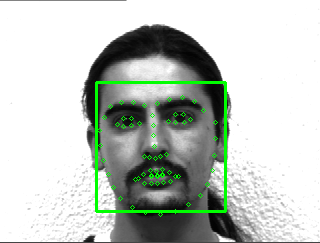

<class '_dlib_pybind11.vector'>
128
-0.145499
0.142487
0.0789867
0.00475083
-0.0293761
-0.0194143
-0.0230776
-0.0358496
0.177621
-0.0655969
0.203335
0.0552479
-0.207518
-0.0082416
-0.0462832
0.122206
-0.123915
-0.150575
-0.189071
-0.0598934
0.0817346
0.15084
0.0260683
-0.0270797
-0.215357
-0.306748
-0.107196
-0.154638
0.0198667
-0.0823703
0.0214815
-0.0493796
-0.190344
-0.0918544
0.0314013
-0.0130552
-0.0659553
-0.1026
0.152384
0.0367048
-0.155001
0.0518804
0.0720104
0.302316
0.0934948
0.0528664
0.0585123
-0.105993
0.00789431
-0.236976
0.0888716
0.132958
0.0557532
0.121103
0.143128
-0.128533
0.105501
0.128228
-0.260531
0.0778151
0.0799972
-0.00438534
-0.0016064
0.00629084
0.146888
0.0676822
-0.0681383
-0.110501
0.117334
-0.133087
-0.0164479
0.0552427
-0.0928066
-0.232438
-0.269766
0.0764363
0.461994
0.210185
-0.115232
0.0810443
-0.0751081
-0.0621242
0.0399609
0.0153321
-0.109394
-0.0244441
-0.109188
0.108555
0.188161
0.0285938
-0.018278
0.186529
0.0478553
-0.131318
0.0442414
0.0339454


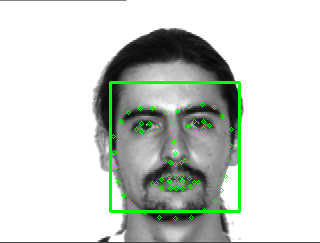

<class '_dlib_pybind11.vector'>
128
-0.0999546
0.0272547
0.0405578
-0.0254214
-0.0198742
-0.054307
0.0560486
-0.0856602
0.239143
-0.0771267
0.195959
-0.0206432
-0.223063
-0.138649
0.0154582
0.10117
-0.169916
-0.130274
-0.0621612
-0.122942
0.0270151
0.010953
0.060441
0.00868344
-0.205621
-0.352361
-0.0987241
-0.1598
-0.0218197
-0.0971996
-0.00705923
0.0545335
-0.245878
-0.124052
-0.103396
0.0386864
-0.0442291
-0.0375915
0.134437
0.0321724
-0.115883
-0.0123475
0.00496937
0.29123
0.103065
0.0108972
-0.00125257
0.0175157
0.0142457
-0.267293
0.0626209
0.109907
0.0341968
0.0315281
0.0461195
-0.0539657
-0.0113682
0.0527074
-0.209012
0.0793296
0.0858556
0.00118191
-0.0550214
0.0177711
0.234535
0.131712
-0.0784616
-0.00876833
0.105201
-0.136039
0.00887274
0.00374619
-0.0993775
-0.198652
-0.274213
0.0955432
0.396018
0.0937471
-0.128536
-0.0162306
-0.182415
0.00275016
0.0854198
-0.0321814
-0.0742649
0.0848787
-0.151512
0.120739
0.155168
-0.00754362
-0.0568727
0.248122
0.0341199
-0.027695
0.060910

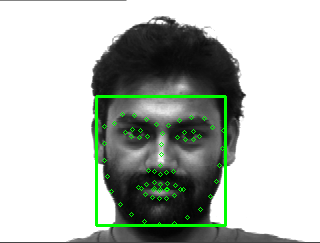

<class '_dlib_pybind11.vector'>
128
-0.135346
0.0988919
0.0635112
0.0214719
0.0743596
-0.152427
-0.0212259
-0.137942
0.145204
-0.0913304
0.220593
-0.00512005
-0.17225
-0.14571
0.027
0.0790002
-0.180442
-0.116719
-0.0345508
-0.131545
0.0306075
0.00323465
0.0495237
-0.0058366
-0.207439
-0.310681
-0.134035
-0.137973
0.0140168
0.0262953
0.0438359
-0.0281737
-0.206461
-0.0372996
-0.00157563
0.0284343
0.033309
0.0315018
0.174283
0.00403757
-0.0895358
-0.0815792
-0.00191071
0.287609
0.152073
0.0655755
0.0116785
-0.0354112
0.00555615
-0.210037
0.0933743
0.119187
0.0979457
0.0336612
0.0909022
-0.102126
0.021081
0.0116557
-0.19478
0.045293
0.0598957
-0.0276917
-0.0746405
0.00348172
0.269933
0.0930995
-0.139721
-0.0239888
0.19602
-0.175969
-0.00252997
0.00584368
-0.0502775
-0.197187
-0.333774
0.0359138
0.421974
0.184636
-0.18492
0.0438877
-0.155236
0.00280467
0.107212
0.00853457
-0.121265
0.0834657
-0.0933662
0.0626951
0.146712
0.0178501
-0.0947779
0.200775
-0.0346754
0.0305217
0.0440456
-0.02553

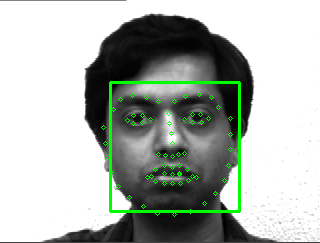

<class '_dlib_pybind11.vector'>
128
-0.157337
0.0792224
0.096384
0.0562047
0.0676346
-0.135389
0.0593706
-0.126457
0.135416
-0.0450182
0.235022
0.00560463
-0.206189
-0.121247
0.0275401
0.0906487
-0.137752
-0.149112
-0.0199752
-0.10776
0.0229606
-0.0144565
-0.00462081
0.0338624
-0.184948
-0.256165
-0.0994055
-0.109284
0.037931
-0.0278148
0.0674073
0.0124323
-0.243211
-0.0186339
-0.0520693
0.0190909
-0.00141902
0.00957954
0.163909
0.043217
-0.116499
-0.0923606
-0.0221334
0.328718
0.177557
0.0330052
0.0282642
-0.0225016
-0.028808
-0.24398
0.031445
0.112518
0.132192
0.0416849
0.0152366
-0.124997
-0.00806233
0.0119929
-0.189784
0.0690732
0.0610994
-0.0334873
-0.0324263
-0.0100749
0.28524
0.0458246
-0.139092
-0.00916433
0.201256
-0.199851
-0.0358667
0.0497297
-0.0495671
-0.199746
-0.336086
0.0862291
0.451071
0.175455
-0.170366
0.0361269
-0.172888
0.0190805
0.06749
0.0371934
-0.110919
0.0553761
-0.113133
0.0256761
0.179713
0.0405464
-0.0748254
0.174223
-0.0102324
-0.0192848
0.0106583
-0.03815

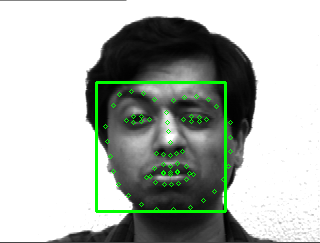

<class '_dlib_pybind11.vector'>
128
-0.127046
0.065892
0.0158208
-0.0135592
-0.114993
-0.00170534
-0.0612658
-0.0390812
0.0898576
-0.0870635
0.128674
-0.0940614
-0.239966
-0.0265357
-0.0287185
0.112465
-0.133663
-0.134629
-0.130717
-0.0873702
0.0358104
0.0331592
-0.0338187
0.0263389
-0.164338
-0.302548
-0.0308898
-0.126097
-0.00850604
-0.0918298
-0.0720775
0.0134293
-0.184232
-0.10117
0.0131571
-0.0108035
0.0109681
-0.000614874
0.18257
0.0258618
-0.161844
0.0273961
0.127685
0.296471
0.142462
0.14576
-0.00908581
-0.0337203
0.117516
-0.282643
0.137659
0.12055
0.0316255
0.0313417
0.124026
-0.140841
-0.0360453
0.0987056
-0.157311
0.139762
0.105518
0.0104075
-0.0649164
-0.0981578
0.226842
0.106807
-0.0845551
-0.088944
0.14717
-0.136673
-0.0721188
0.00379825
-0.0633099
-0.120373
-0.309233
0.0622043
0.41497
0.159465
-0.130249
-0.000243608
-0.0372636
-0.0705383
0.10558
0.0116701
-0.0941577
-0.0180429
-0.0346807
0.0669157
0.204567
0.0484415
-0.00907794
0.187682
0.0322044
-0.0761665
0.0253518
0.

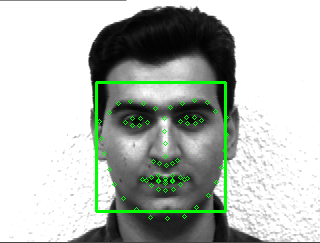

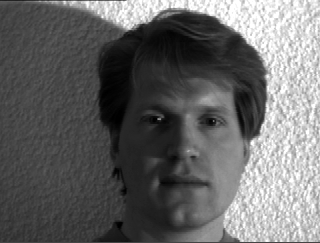

<class '_dlib_pybind11.vector'>
128
-0.142723
0.115011
0.066039
-0.0915717
-0.0939957
0.0118139
-0.12061
-0.142756
0.123877
-0.156309
0.232298
0.00292174
-0.162174
-0.0227064
-0.0279826
0.157227
-0.133569
-0.152461
-0.0323233
-0.0350448
0.0424668
0.039773
0.00742923
0.028052
-0.20201
-0.250337
-0.0743962
-0.0748758
-0.0553101
-0.0226213
-0.0675428
0.0219136
-0.186462
-0.0317031
0.0451626
0.124885
0.025272
0.00968317
0.134971
0.0586866
-0.151056
-0.01321
0.0829863
0.272624
0.161283
0.0576288
0.0437448
-0.134904
0.0978314
-0.159782
0.0253613
0.114335
0.0432167
0.0749292
0.000999197
-0.117851
0.0645154
0.103923
-0.104763
0.0591409
0.0980188
0.00975104
-0.0850711
-0.0751076
0.29414
0.0921134
-0.130622
-0.173774
0.0926505
-0.0592027
-0.182546
0.0533463
-0.212172
-0.151166
-0.287042
-0.00938514
0.42703
0.121419
-0.198081
0.0425258
-0.0489117
-0.0302699
0.0941216
0.106412
-0.0256689
0.0567449
-0.0315023
0.0612376
0.271097
-0.0105077
-0.0385842
0.171133
0.00746911
0.0620464
0.00144012
0.052771

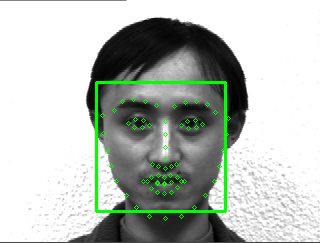

<class '_dlib_pybind11.vector'>
128
-0.17347
0.145816
0.128716
0.0330672
-0.0660677
-0.0194303
-0.0487291
-0.0575465
0.117478
-0.00944009
0.21168
0.00704215
-0.215564
0.0398248
-0.0728539
0.106443
-0.124472
-0.0577284
-0.155583
-0.0669157
0.0427813
0.114307
0.014752
-0.021511
-0.153618
-0.30104
-0.107271
-0.0952794
0.04317
-0.0451807
0.00791217
0.0382349
-0.143002
-0.0455864
0.00274366
0.00957081
-0.100575
-0.0754138
0.182033
0.0313739
-0.126021
0.0572589
0.107899
0.266023
0.168457
0.0719945
0.0757021
-0.0762177
-0.0246033
-0.235534
0.0674509
0.189679
0.0725729
0.101015
0.119274
-0.152174
0.0307713
0.0851182
-0.160332
0.121288
0.106925
-0.0519268
-0.0100388
-0.0141655
0.119626
0.114031
-0.0616402
-0.0936467
0.111889
-0.16401
-0.0316491
0.0956977
-0.106615
-0.205466
-0.25383
0.0638274
0.450447
0.194696
-0.0900393
0.00986017
-0.044269
-0.100356
0.0437169
0.0338549
-0.153657
-0.102777
-0.107626
0.0867401
0.208147
0.050309
-0.00298417
0.192613
0.0627655
-0.108132
-0.00627569
0.0321044
-0.1

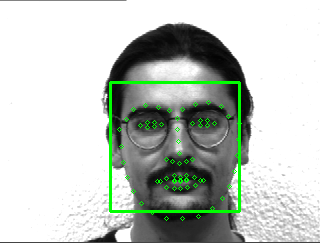

<class '_dlib_pybind11.vector'>
128
-0.0222537
0.0995563
0.0515587
-0.0374616
-0.0584836
-0.0401624
-0.0574739
-0.040625
0.186752
-0.0595051
0.244718
0.00215296
-0.262693
0.0274036
-0.139868
0.160618
-0.0961958
-0.036411
-0.165254
-0.136704
0.0637419
0.0980817
-0.00195472
-0.0279861
-0.185818
-0.214479
-0.11474
-0.0825699
0.0972804
-0.0705642
0.0257317
0.0940068
-0.188868
-0.0957185
0.068056
-0.00463554
-0.0483049
-0.0413001
0.20864
0.151688
-0.111678
0.125566
0.0246575
0.30045
0.126384
0.0374457
0.0531515
-0.125192
0.0180184
-0.260556
0.0773508
0.123572
0.127548
0.118473
0.130136
-0.197307
0.0309488
0.103689
-0.214799
0.149117
0.0904863
-0.0540423
-0.0965812
-0.0679885
0.108121
0.0913051
-0.108343
-0.0930296
0.268326
-0.111593
0.0330998
0.136711
-0.0638445
-0.144923
-0.272399
0.0773523
0.458804
0.210184
-0.18635
-0.0414551
-0.0468436
-0.00289274
0.0389011
-0.0168371
-0.113648
-0.0707999
0.00233418
0.0664942
0.14776
0.00696452
-0.0569427
0.260486
0.058303
-0.00705508
0.0179872
0.037044

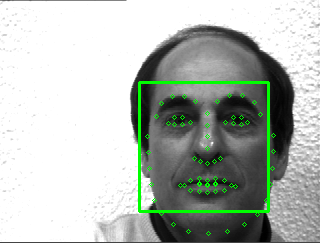

<class '_dlib_pybind11.vector'>
128
-0.11311
0.137997
0.0638466
-0.0329681
-0.0450656
0.00588611
-0.0150916
-0.0679972
0.155841
0.0271461
0.270333
-0.00799713
-0.176955
-0.0649964
-0.0164403
0.124177
-0.119016
-0.0785763
-0.139409
-0.0829792
0.0214953
-0.031535
-0.00947187
0.0294711
-0.14354
-0.306449
-0.115931
-0.135215
0.0564779
-0.174174
-0.0654866
-0.0321726
-0.208063
-0.0631859
-0.115014
-0.0159999
-0.011468
-0.108378
0.12219
0.0730334
-0.153465
0.0599989
0.0977604
0.188262
0.225641
-0.000258923
0.0612518
0.0242619
-0.0144081
-0.163214
0.0696008
0.0915964
0.167509
0.0931052
0.0614548
-0.125437
-0.0641643
0.0423803
-0.0905486
0.0802005
0.0354527
-0.055937
-0.0406048
0.00357289
0.195603
0.139903
-0.0545602
-0.087294
0.0922375
-0.0942498
-0.0415627
0.0416225
-0.101255
-0.135472
-0.271424
0.151076
0.399627
0.114398
-0.201227
0.0299667
-0.201046
-0.0827732
-0.0202994
0.0112864
-0.0564279
-0.00685245
-0.146936
0.029881
0.211503
-0.0179703
0.0300657
0.192673
-0.027097
-0.0333877
-0.02726

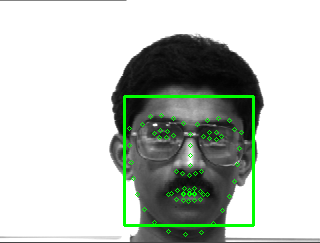

<class '_dlib_pybind11.vector'>
128
-0.14529
0.112107
0.0486888
-0.0775842
-0.0658478
-0.0858443
-0.0600738
-0.109423
0.155048
-0.109791
0.24799
-0.0696956
-0.190012
-0.127186
-0.047682
0.226268
-0.223047
-0.130107
-0.00822341
-0.000329137
0.130024
0.0061859
0.0021272
0.044357
-0.142345
-0.293962
-0.121069
-0.0909344
-0.0253546
-0.0530744
-0.053441
-0.0312145
-0.195497
-0.0841195
0.0188546
0.0297173
-0.0147595
-0.0890374
0.187216
0.0250617
-0.191526
0.024351
0.0714076
0.241551
0.198192
0.0326259
0.0539477
-0.19155
0.140374
-0.114883
-0.00410067
0.124744
0.0858601
0.0521871
-0.0108322
-0.102672
0.0110133
0.140355
-0.143092
0.00286384
0.111039
-0.0448675
-0.0875669
-0.121818
0.262982
0.0317933
-0.169592
-0.178129
0.131714
-0.0967956
-0.103828
0.0393541
-0.159751
-0.178176
-0.30393
0.0140559
0.347804
0.0537319
-0.201078
0.0784873
-0.0668525
-0.000285961
0.0926128
0.20559
0.0108969
0.0562579
-0.0464635
-0.0116581
0.21022
-0.0759375
0.0168421
0.205574
0.00255633
0.0635589
0.00301896
-0.0109

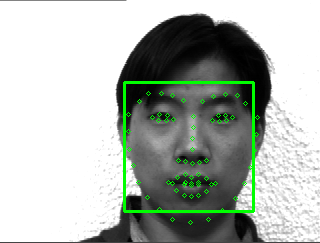

<class '_dlib_pybind11.vector'>
128
-0.14529
0.112107
0.0486888
-0.0775842
-0.0658478
-0.0858443
-0.0600738
-0.109423
0.155048
-0.109791
0.24799
-0.0696956
-0.190012
-0.127186
-0.047682
0.226268
-0.223047
-0.130107
-0.00822341
-0.000329137
0.130024
0.0061859
0.0021272
0.044357
-0.142345
-0.293962
-0.121069
-0.0909344
-0.0253546
-0.0530744
-0.053441
-0.0312145
-0.195497
-0.0841195
0.0188546
0.0297173
-0.0147595
-0.0890374
0.187216
0.0250617
-0.191526
0.024351
0.0714076
0.241551
0.198192
0.0326259
0.0539477
-0.19155
0.140374
-0.114883
-0.00410067
0.124744
0.0858601
0.0521871
-0.0108322
-0.102672
0.0110133
0.140355
-0.143092
0.00286384
0.111039
-0.0448675
-0.0875669
-0.121818
0.262982
0.0317933
-0.169592
-0.178129
0.131714
-0.0967956
-0.103828
0.0393541
-0.159751
-0.178176
-0.30393
0.0140559
0.347804
0.0537319
-0.201078
0.0784873
-0.0668525
-0.000285961
0.0926128
0.20559
0.0108969
0.0562579
-0.0464635
-0.0116581
0.21022
-0.0759375
0.0168421
0.205574
0.00255633
0.0635589
0.00301896
-0.0109

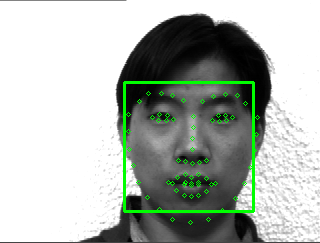

<class '_dlib_pybind11.vector'>
128
-0.130895
0.0660141
-0.0260996
0.0151876
-0.0828598
-0.00807521
-0.0164415
-0.0962024
0.0606303
-0.0829898
0.117746
-0.128433
-0.327843
-0.0728634
-0.0196405
0.121445
-0.0724564
-0.116882
-0.149686
-0.107929
0.0440258
0.0239974
0.0114099
-0.0157955
-0.140331
-0.31561
-0.0434386
-0.0615971
-0.0252787
-0.0773101
-0.0451971
0.0406132
-0.281998
-0.118866
-0.00677378
0.0221146
-0.0119168
-0.0137676
0.178904
0.0289174
-0.135278
0.0286894
0.10409
0.236705
0.173038
0.0912748
-0.0747826
-0.0223832
0.103507
-0.344446
0.0748964
0.125729
0.0762139
0.0315623
0.1127
-0.0675586
-0.012811
0.0915232
-0.157737
0.0949863
0.0903983
-0.046702
-0.0769512
-0.111269
0.19781
0.103095
-0.0788499
-0.0490628
0.193066
-0.132875
-0.0434417
-0.00559133
-0.0245009
-0.142107
-0.339845
0.0969091
0.353086
0.188332
-0.164198
-0.0115481
-0.04268
-0.0125872
0.0922839
-0.0262246
-0.0575666
-0.0747711
-0.0564532
0.0608596
0.212011
0.0146837
-0.0475701
0.243044
0.0065648
0.0094238
0.0321179

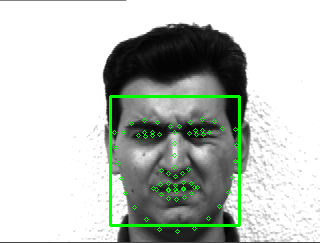

<class '_dlib_pybind11.vector'>
128
-0.118588
0.0873649
0.110875
-0.0139312
-0.0670287
-0.0398931
-0.0302114
-0.132168
0.0967014
-0.0400836
0.246734
-0.0875394
-0.202251
-0.145885
-0.0114416
0.205954
-0.165466
-0.130021
-0.0286369
-0.0290373
0.0488133
-0.00736197
0.040208
0.0134917
-0.100943
-0.372556
-0.0993777
-0.114198
0.0201195
-0.0970255
-0.113289
0.0473586
-0.19628
-0.0386553
-0.0206299
0.0765886
0.016424
-0.072419
0.160611
-0.0220712
-0.194095
-0.0233037
0.0578405
0.185937
0.212217
0.0196171
0.0336614
-0.0598728
0.0269127
-0.102818
0.0373888
0.0926058
0.0625783
0.0518437
-0.0657258
-0.128866
-0.0449296
0.0659326
-0.112272
0.015464
0.0775899
-0.150579
-0.10629
-0.0346802
0.227068
0.0764015
-0.0960698
-0.178236
0.105576
-0.139602
-0.0557735
0.0274332
-0.175709
-0.109242
-0.336624
0.0340709
0.34903
0.000237256
-0.206957
0.0127226
-0.0756764
0.00830404
0.0989615
0.139613
-0.0081784
0.0445623
-0.128457
0.012399
0.198129
-0.0737415
-0.0128082
0.187615
-0.0497425
0.0775198
0.00511984
0

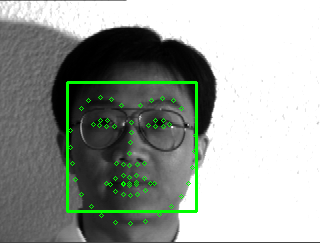

<class '_dlib_pybind11.vector'>
128
-0.102507
0.0759937
0.0590368
0.0103079
-0.0221037
-0.0521925
-0.0760777
-0.103604
0.129199
-0.0659771
0.281911
-0.0489482
-0.188649
-0.186194
-0.0123056
0.200021
-0.179688
-0.0550044
-0.0411199
0.0140398
0.0442809
0.00484753
0.0822711
0.0227682
-0.0764883
-0.374764
-0.106285
-0.109225
-0.00122169
-0.0773804
-0.0494536
0.0193291
-0.156557
-0.0854138
0.00500003
0.0534199
-0.0333177
-0.0402857
0.200365
0.00619512
-0.195337
0.0369853
0.048162
0.222412
0.23778
0.0776062
0.0508259
-0.162555
0.0990255
-0.112189
0.0102539
0.108428
0.0852094
0.0109242
-6.88583e-05
-0.109127
-0.00870714
0.0834144
-0.137169
-0.00482239
0.0814731
-0.0757714
-0.066604
-0.0253273
0.210305
0.0436723
-0.120265
-0.172876
0.114787
-0.144504
-0.0562349
0.0744254
-0.143084
-0.188069
-0.347935
0.0231907
0.365187
0.0353619
-0.17555
0.0444013
-0.0487239
-0.0217127
0.098928
0.189509
-0.0241712
-0.0188031
-0.0863421
-0.0350003
0.159405
-0.0561644
-0.00158759
0.175803
-0.0135456
0.0696966
0.

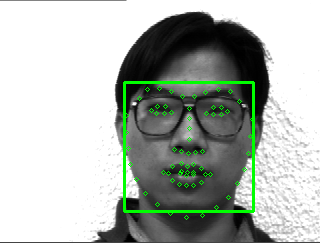

<class '_dlib_pybind11.vector'>
128
-0.111483
0.0764062
0.0376339
-0.0631923
-0.0507936
-0.11558
-0.0567779
-0.124347
0.123411
-0.0943962
0.248512
-0.0795074
-0.175915
-0.135278
-0.0368944
0.192523
-0.20505
-0.0953503
-0.0291338
-0.00243656
0.0917702
0.000341091
0.0139266
0.0378641
-0.122568
-0.30381
-0.119565
-0.0952424
-0.000413097
-0.0443836
-0.0310932
0.0253714
-0.184062
-0.0856298
0.0178302
0.04389
-0.0200821
-0.0545031
0.17109
-0.00427295
-0.215551
0.0173608
0.0840931
0.228568
0.238338
0.0152348
0.0442694
-0.202482
0.102022
-0.0862993
0.0146827
0.103121
0.11876
0.0579007
-0.001434
-0.0902398
0.0108059
0.136016
-0.159546
-0.0136315
0.125612
-0.0134035
-0.0568598
-0.0815137
0.216458
0.0404694
-0.148473
-0.167025
0.173367
-0.152165
-0.0964685
0.0662784
-0.138124
-0.190773
-0.326848
-0.0168047
0.34598
0.0991604
-0.205492
0.0282596
-0.0657869
-0.0155557
0.144482
0.175139
0.00341822
0.0138516
-0.043466
-0.0091721
0.197046
-0.0444959
-0.0136852
0.180965
0.0315753
0.0526403
0.00589862
-0

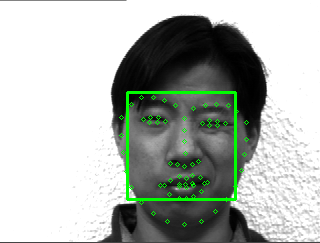

<class '_dlib_pybind11.vector'>
128
-0.105885
0.0949737
0.0323831
-0.0369667
-0.096546
-0.0116992
-0.139623
-0.0623569
0.0817342
-0.0740281
0.203042
0.0234085
-0.165367
-0.0180469
0.00463623
0.159498
-0.144053
-0.0799934
-0.0993271
-0.0923095
0.000303194
0.0356221
0.00750162
0.00756633
-0.128069
-0.338509
-0.113906
-0.0608172
0.0159845
-0.0618179
-0.0751019
0.0298641
-0.138156
-0.0821487
0.073019
0.0503663
-0.0455784
-0.0132493
0.183458
0.0694243
-0.108069
0.0951233
0.0922399
0.259633
0.224658
0.0871341
0.0946833
-0.10568
0.0530525
-0.231679
0.0781988
0.161151
0.0526784
0.0946195
0.0289556
-0.109904
-0.0263959
0.0903201
-0.0971302
0.102106
0.091713
-0.0416144
-0.0927174
-0.0506526
0.235657
0.147595
-0.125176
-0.16136
0.116055
-0.109525
-0.135828
-0.0459118
-0.151712
-0.161353
-0.308415
0.0813683
0.36138
0.134606
-0.176662
0.064063
-0.0702098
-0.0426958
0.0439906
0.0711966
-0.0976599
-0.0466126
0.00756928
0.0717318
0.240295
-0.00602153
-0.0148796
0.185719
0.0178725
0.0770941
0.0475712
0

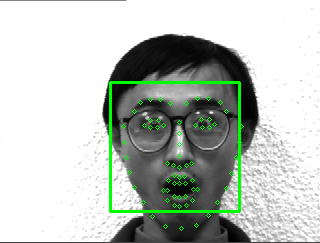

<class '_dlib_pybind11.vector'>
128
-0.172911
0.104286
0.0411129
-0.0593148
-0.045169
-0.0848846
-0.0554833
-0.129426
0.169653
-0.0937102
0.287439
-0.0465853
-0.173224
-0.16268
-0.0268473
0.200311
-0.228892
-0.119564
-0.0149184
0.0194742
0.124766
0.00646502
0.0298733
0.028528
-0.138851
-0.340478
-0.109027
-0.125023
-0.00366437
-0.0526534
-0.0492722
-0.0671894
-0.202077
-0.11228
0.0351101
0.0270621
-0.0288654
-0.0783699
0.175384
-0.00696575
-0.210159
0.00694829
0.0696528
0.232918
0.187893
0.0455618
0.0386459
-0.191798
0.146065
-0.106004
-0.0069364
0.0965503
0.0754686
0.0411232
0.0345524
-0.121163
0.0155555
0.116594
-0.139463
-0.0181632
0.0906818
-0.0350698
-0.0564771
-0.0810919
0.246529
0.0307287
-0.145396
-0.177209
0.112611
-0.0716784
-0.0631208
0.0669778
-0.159779
-0.186368
-0.315281
0.00702792
0.373044
0.0233809
-0.186502
0.0367818
-0.075356
0.0155372
0.10633
0.160547
0.00603518
0.0351362
-0.0841076
-0.0209319
0.191794
-0.0762223
0.00404485
0.162453
-0.0277641
0.0517404
0.0167182
0.0

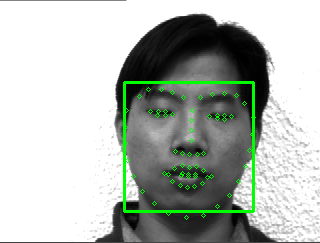

<class '_dlib_pybind11.vector'>
128
-0.148699
0.083455
0.0355091
-0.104105
-0.0684353
-0.0294725
-0.0946208
-0.105041
0.101953
-0.107972
0.202846
-0.0044193
-0.202665
-0.0860001
-0.00099612
0.165966
-0.155463
-0.0928683
-0.0530708
-0.0807653
0.00350525
0.00255244
0.0595345
0.09168
-0.126943
-0.310139
-0.0934466
-0.116276
-0.010081
-0.0691935
-0.0627492
0.013812
-0.146543
-0.0313914
0.00235365
0.0781956
-0.00766698
0.0012629
0.199122
-0.011297
-0.159334
0.0385671
0.118374
0.275574
0.254737
0.0851098
0.0412561
-0.063135
0.0824144
-0.176487
0.109875
0.104611
0.0802132
0.00656622
0.038328
-0.118752
0.00738022
0.0958396
-0.109754
0.0757044
0.0795975
-0.0535522
-0.0367826
0.00830045
0.267997
0.10496
-0.123521
-0.137275
0.122622
-0.170024
-0.116241
-0.00769059
-0.18983
-0.133404
-0.350648
0.0332514
0.376104
0.162566
-0.15216
0.0825896
-0.0623891
-0.0411791
0.0996491
0.115447
-0.0980892
-0.0460117
-0.0702459
0.052659
0.221885
0.00259996
-0.0396651
0.185403
0.0296081
0.0405574
-0.00171864
0.020

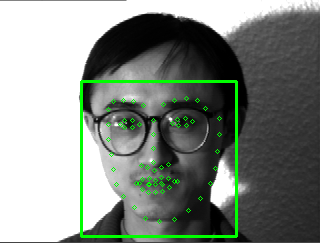

<class '_dlib_pybind11.vector'>
128
-0.130818
0.115533
0.0211734
-0.0308111
-0.0473069
-0.0394943
-0.0485431
-0.138684
0.151323
-0.0260082
0.273483
-0.08199
-0.184517
-0.128023
0.00138018
0.127778
-0.164829
-0.117081
-0.0476848
-0.0339694
0.0926399
0.0149449
0.0304675
0.00366762
-0.181988
-0.290471
-0.113339
-0.152944
0.0387693
-0.0348283
-0.0577519
0.0326622
-0.226674
-0.157223
0.0449306
0.0989541
-0.0128087
0.00608312
0.140694
0.0577889
-0.173873
0.0183377
0.0538159
0.279128
0.164627
0.123439
-0.0189544
-0.089749
0.0848756
-0.182778
0.0609139
0.133932
0.130852
0.0665563
0.0377729
-0.0909516
0.0568617
0.0697494
-0.201839
0.00517347
0.0940719
-0.0819502
-0.0526546
-0.0483062
0.270232
0.120526
-0.0856606
-0.106212
0.118692
-0.05658
-0.134438
0.0678404
-0.152568
-0.123633
-0.361609
0.0247523
0.426122
0.0428521
-0.220789
0.0284848
-0.0639334
0.00185379
0.112553
0.104414
-0.0142256
0.0279672
-0.0944045
-0.0232206
0.191408
-0.104004
-0.0365634
0.148557
-0.0200179
0.0765144
0.0399156
0.04033

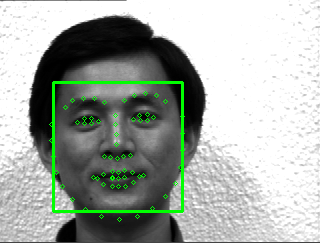

<class '_dlib_pybind11.vector'>
128
-0.15049
0.102559
0.0375829
-0.0491078
-0.0593172
-0.0882625
-0.0618357
-0.129622
0.165139
-0.101708
0.259884
-0.0585538
-0.18392
-0.136406
-0.03993
0.214089
-0.21782
-0.114994
-0.0254034
-0.0156643
0.145691
0.0101176
0.0162943
0.0393966
-0.156333
-0.299614
-0.127409
-0.0961282
-0.0268652
-0.0752923
-0.0574627
-0.048849
-0.207177
-0.106314
0.0186969
0.0341815
-0.0236681
-0.0895457
0.195616
0.0101499
-0.181904
0.042978
0.0830995
0.236354
0.203393
0.0417104
0.0323272
-0.185533
0.149453
-0.0991689
-0.00535702
0.114784
0.0911844
0.0605924
0.00621309
-0.0961548
0.00716919
0.142346
-0.152095
-0.00505864
0.108028
-0.0634861
-0.0880019
-0.111893
0.250623
0.0377991
-0.156326
-0.172202
0.119134
-0.097247
-0.102909
0.0345847
-0.155874
-0.188175
-0.321453
0.0146087
0.353209
0.0472431
-0.217978
0.0686636
-0.046039
0.00129469
0.107906
0.193535
0.0230802
0.0535738
-0.0564473
-0.00318545
0.200046
-0.0650895
0.00926154
0.205541
0.00423623
0.0655411
0.0184779
0.000759

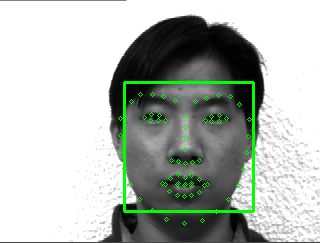

<class '_dlib_pybind11.vector'>
128
-0.00938927
0.102488
0.0405987
-0.0278828
-0.0342659
-0.0182313
-0.0277534
-0.07142
0.173911
-0.0310523
0.222762
-0.00397442
-0.262848
-0.011139
-0.105483
0.1158
-0.101813
-0.0121976
-0.161303
-0.123064
-0.0174355
0.0875542
0.0382553
-0.017271
-0.143027
-0.211323
-0.115308
-0.0583984
0.131784
-0.0915172
0.0116181
0.0965381
-0.229839
-0.0768616
0.0654263
-0.0369723
-0.0475318
-0.0221403
0.215818
0.139689
-0.110643
0.136056
0.0200963
0.294302
0.179828
0.0464008
0.0032696
-0.10564
0.0632064
-0.217805
0.0467986
0.171274
0.11073
0.0608187
0.0903038
-0.176947
-0.00426105
0.0964086
-0.213519
0.12909
0.0883329
-0.0255962
-0.0831413
-0.0393487
0.0876936
0.0697953
-0.147563
-0.121369
0.205289
-0.149808
0.0837599
0.161919
-0.0678631
-0.150343
-0.257288
0.0760452
0.456305
0.180682
-0.151991
-0.0281068
-0.0945847
-0.0335421
0.0284747
0.00812295
-0.130181
-0.0774795
0.00745748
0.0473393
0.14417
0.0430518
-0.0740049
0.250948
0.019793
-0.00583674
-0.0305415
0.034563

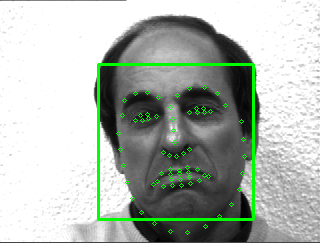

<class '_dlib_pybind11.vector'>
128
-0.165595
0.0344948
-0.0329713
-0.0523233
-0.133743
-0.0508451
0.0747061
-0.0702014
0.197641
0.0357303
0.203907
-0.0490244
-0.298984
-0.0294225
-0.0638998
0.116607
-0.0945712
0.0283661
-0.138126
-0.155913
0.0844074
0.0465217
0.048637
0.0309908
-0.118621
-0.298339
-0.108593
-0.0831224
-0.0157952
-0.11649
0.0326201
0.137026
-0.224989
-0.132783
-0.0170692
0.067461
-0.0665168
-0.0281572
0.118559
0.0567249
-0.0817484
0.0826022
0.141446
0.216725
0.175141
0.0920164
0.0127377
-0.0525089
0.0560051
-0.208234
0.0354118
0.117493
0.0852949
0.0471668
0.100309
-0.15315
0.00858337
0.0438329
-0.209956
0.085935
0.0934195
-0.0622372
-0.105197
-0.0271964
0.16322
0.103306
-0.115789
-0.0905029
0.125894
-0.149454
0.00222539
0.106086
-0.125261
-0.187402
-0.266288
0.149845
0.47478
0.110318
-0.124362
-0.0113365
-0.126598
-0.0522892
0.0225306
0.0228055
-0.0353877
-0.0962697
-0.14707
0.0450012
0.122802
-0.0195555
-0.050484
0.25975
0.0574276
0.000984177
-0.0311598
0.10749
-0.210

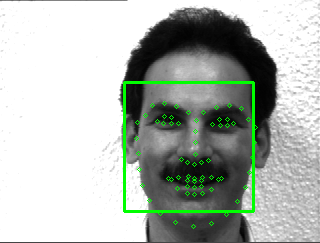

<class '_dlib_pybind11.vector'>
128
-0.107414
0.0809572
0.0486789
-0.0309974
-0.12624
-0.0740097
-0.0591424
-0.130247
0.105773
-0.113179
0.161909
-0.0803807
-0.166226
-0.0740225
-0.0157802
0.187832
-0.194941
-0.158072
-0.0770793
-0.0136036
0.0624589
-0.00465155
0.0272183
-0.00505143
-0.0972812
-0.330977
-0.103637
-0.0929973
0.0447438
-0.0568648
-0.0955189
0.0370768
-0.201337
-0.108095
0.0169138
0.0754277
0.00210658
-0.0555411
0.197007
-0.0259781
-0.225008
0.0285873
0.0685927
0.208815
0.254393
0.0380298
0.0251689
-0.105131
0.0741515
-0.158698
0.0304801
0.104635
0.0597081
0.0724305
-0.0320927
-0.110482
0.0247041
0.0727451
-0.135257
0.00871991
0.127819
-0.142643
-0.0679414
-0.0327208
0.230274
0.062025
-0.0583231
-0.192224
0.112243
-0.152498
-0.0852698
0.00861704
-0.148802
-0.0966423
-0.324686
-0.0177707
0.383594
0.0524736
-0.165362
0.0711065
-0.0484698
-0.0266086
0.108345
0.125852
-0.0272329
0.0308322
-0.083111
0.0606089
0.21841
-0.0847537
-0.013414
0.155749
-0.0136773
0.047981
0.0521101


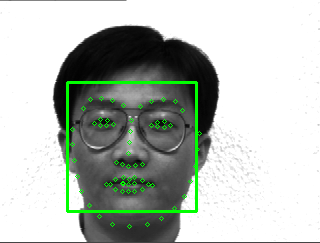

<class '_dlib_pybind11.vector'>
128
-0.117758
0.135736
-0.0396018
-0.0725662
-0.172341
-0.0778186
-0.0335074
-0.082836
0.177097
-0.0171089
0.199422
-0.057512
-0.234094
-0.0267422
-0.00169577
0.119323
-0.189586
-0.0773802
-0.123611
-0.0697558
0.0675115
0.0655118
0.0221275
0.0494157
-0.18207
-0.321813
-0.10814
-0.090156
0.0265075
-0.104195
-0.00709378
0.105335
-0.180924
-0.112888
0.0486581
0.0465316
-0.0333133
-0.0691189
0.191534
0.0600769
-0.17365
-0.00730398
0.0290131
0.266723
0.237594
-0.0293466
0.0446312
-0.0828846
0.0954891
-0.183422
-0.00689113
0.177678
0.0611279
0.0626636
0.0690962
-0.0782184
0.0197761
0.155647
-0.214894
-0.0220504
0.151594
-0.0826959
-0.0721995
-0.0929434
0.158389
0.0807348
-0.104319
-0.112934
0.14608
-0.135121
-0.080171
0.0611325
-0.111048
-0.187539
-0.303914
-0.00803253
0.363849
0.180729
-0.198175
-0.017181
-0.0867853
-0.0221308
0.0770083
0.00555612
-0.0924957
0.0189522
-0.119012
0.0869992
0.193446
0.00981645
-0.00995221
0.247624
0.0561881
0.00923008
0.0740554


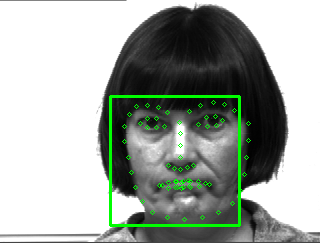

<class '_dlib_pybind11.vector'>
128
-0.0675327
0.0448671
0.0182294
-0.0168961
-0.0670646
-0.0609298
-0.0475602
-0.0878293
0.148785
-0.0629269
0.140698
-0.0630189
-0.171825
-0.0555209
-0.0309088
0.139473
-0.0975562
-0.104379
-0.0974183
-0.1176
0.0320203
0.00215826
0.0500554
0.00723809
-0.15418
-0.331345
-0.146314
-0.0987432
0.0478828
-0.124149
-0.0754233
0.0240571
-0.253822
-0.0532847
-0.0287179
0.0693782
-0.0372762
-0.0783751
0.206177
0.0841985
-0.131075
0.088212
0.0768824
0.196192
0.185128
0.039594
0.0226256
-0.0156054
-0.0145
-0.166277
0.112642
0.125154
0.0867512
0.0885622
0.06589
-0.0848192
-0.0269614
0.038092
-0.0836839
0.0466305
0.0860501
-0.0509424
-0.0386295
-0.0165168
0.244946
0.125667
-0.0690034
-0.0700759
0.0801058
-0.167871
-0.0316412
-0.0206769
-0.0793689
-0.0693461
-0.317726
0.121899
0.409619
0.117095
-0.170032
0.0201273
-0.110844
-0.08034
0.0353952
0.0308808
-0.122336
0.0213507
-0.0826968
0.071618
0.219913
-0.000382543
-0.0128105
0.154255
-0.0148217
0.0479473
0.00238295
-

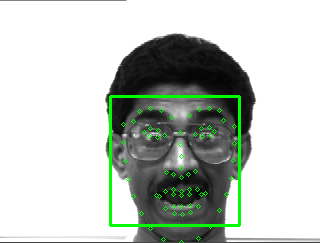

<class '_dlib_pybind11.vector'>
128
-0.0271183
0.104155
0.0266562
-0.0361075
-0.0474303
-0.0433224
-0.0767753
-0.0573953
0.183763
-0.0531688
0.209331
0.00852621
-0.224943
-0.0515992
-0.0972509
0.170826
-0.118758
-0.0423235
-0.149419
-0.17664
0.0667345
0.0980844
-0.0067034
-0.0411598
-0.185238
-0.194731
-0.0823596
-0.0482327
0.0765274
-0.0805796
0.0370671
0.0856048
-0.195887
-0.0742345
0.0787932
0.0292413
-0.0362808
-0.000947721
0.186515
0.125003
-0.114833
0.174606
0.0314268
0.248947
0.16588
0.0384577
0.033763
-0.154604
0.0675598
-0.229242
0.0746836
0.162881
0.163781
0.063744
0.113302
-0.114345
-0.0384003
0.121064
-0.209207
0.118726
0.108892
-0.0569589
-0.0994177
-0.0789783
0.0858689
0.108639
-0.126563
-0.107232
0.235026
-0.114663
-0.0174282
0.126785
-0.0288489
-0.130344
-0.292699
0.0627561
0.440527
0.168287
-0.17861
-0.0373176
-0.0817849
-0.0128153
-0.00331302
-0.0204877
-0.145068
-0.0842494
0.0190839
0.0767923
0.17207
0.0193155
-0.0524638
0.242725
0.0647829
0.0236055
-0.0370329
0.0225

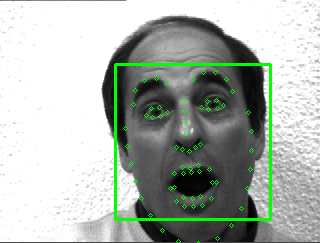

<class '_dlib_pybind11.vector'>
128
-0.178641
0.0596015
-0.00316824
-0.068304
-0.0998381
-0.00878192
-0.0201163
-0.0543964
0.112752
-0.156608
0.159837
-0.0671018
-0.2655
-0.0496941
-0.0421549
0.151704
-0.120722
-0.19349
-0.127904
-0.102171
0.0638351
0.0125114
-0.0635904
0.0646182
-0.173956
-0.311948
-0.0711022
-0.0866753
-0.0561236
-0.105185
-0.0438102
0.016044
-0.243028
-0.0667519
-0.0296486
-0.0104754
-0.00686393
-0.0482799
0.175996
0.0644762
-0.172226
0.0405583
0.0999664
0.274353
0.159696
0.0607933
-0.00746229
-0.0521856
0.130143
-0.256001
0.0491403
0.160857
0.1141
0.0646618
0.0465417
-0.060872
0.0150731
0.111679
-0.174085
0.0914101
0.0693552
-0.0327706
-0.0412782
-0.0646581
0.177723
0.0941039
-0.0861941
-0.0684709
0.193232
-0.153205
-0.0765323
-0.0166311
-0.0902363
-0.195989
-0.27348
0.0900488
0.3638
0.211013
-0.124581
0.0325804
-0.0560372
-0.0362894
0.0615581
0.0168916
-0.135147
-0.0151519
-0.0311444
0.108215
0.265025
0.061763
-0.0106499
0.242505
0.051299
-0.0497665
0.0602513
0.05

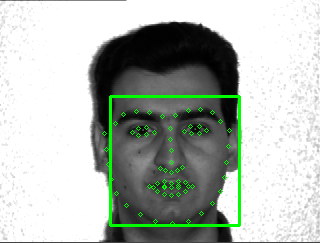

<class '_dlib_pybind11.vector'>
128
-0.0690078
0.063017
0.00478271
-0.0278415
-0.0839925
-0.0811743
0.00337187
-0.0352081
0.200771
-0.0752812
0.145026
-0.00377798
-0.260725
-0.0480442
-0.0672521
0.161946
-0.108413
-0.0469688
-0.176479
-0.15231
0.0238037
0.0465523
0.0514827
-0.0405115
-0.150085
-0.261771
-0.0877788
-0.0621752
-0.00541442
-0.112276
0.0947749
0.0905178
-0.25434
-0.116447
0.00934838
-0.0309265
-0.104682
-0.0343693
0.202354
0.0680351
-0.114254
0.113189
0.0782358
0.221075
0.206803
-0.0200084
-0.0366534
-0.120972
0.0771524
-0.269393
0.0255312
0.132222
0.111551
0.0843028
0.156983
-0.080749
0.0333104
0.106057
-0.209879
0.118089
0.0698318
-0.0232807
-0.114596
-0.056848
0.0711462
0.094673
-0.0818258
-0.0851774
0.25429
-0.133173
0.041813
0.105673
-0.0451193
-0.212832
-0.260076
0.0447412
0.364429
0.215539
-0.150663
-0.0478136
-0.0733069
-0.02322
-0.00944393
-0.0319862
-0.115211
-0.125919
0.00675485
0.119441
0.12817
0.034861
-0.0822423
0.276462
0.0632268
-0.00157282
-0.0128025
-0.00

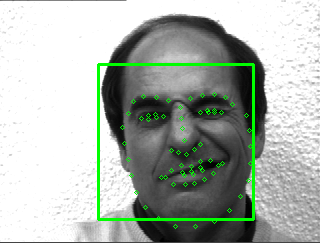

<class '_dlib_pybind11.vector'>
128
-0.170346
0.129664
0.13117
-0.0179399
-0.111312
-0.00483325
0.00640418
-0.0724933
0.141739
-0.00477172
0.220804
-0.0309909
-0.19942
0.0404517
-0.0703595
0.114711
-0.15928
-0.11639
-0.0793554
-0.0744693
0.059521
0.05154
-0.0182223
-0.00161206
-0.156464
-0.239395
-0.0625518
-0.13379
0.0696522
-0.0765816
0.0217726
0.0111606
-0.168438
-0.0781099
-0.0365945
-0.00660547
-0.121386
-0.0944906
0.145106
-0.0229465
-0.138405
0.0669402
0.0640189
0.287474
0.17898
0.0503419
0.035851
-0.0611229
0.00751805
-0.24909
0.0330004
0.135925
0.0952177
0.0848076
0.0906087
-0.125657
0.0431664
0.116589
-0.16866
0.130133
0.115121
-0.0425472
0.0693298
-0.0503912
0.170278
0.0600218
-0.0596538
-0.0654563
0.108876
-0.0999147
-0.0967228
0.0594747
-0.0955227
-0.18691
-0.235311
0.0774738
0.492869
0.171723
-0.141363
0.0128565
-0.0647678
-0.0517237
0.0657524
0.0256845
-0.0968838
-0.134976
-0.143507
0.00102486
0.202739
-0.00174355
-0.0228139
0.14625
0.0451094
-0.113969
-0.00352398
0.0358

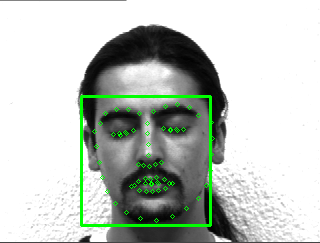

<class '_dlib_pybind11.vector'>
128
-0.0421478
0.0959859
0.0154347
-0.00491807
-0.0715393
-0.0242983
-0.0316563
-0.0726252
0.202595
-0.0551094
0.215936
-0.0455116
-0.224546
-0.0412739
-0.149128
0.155964
-0.0759281
-0.0575668
-0.157697
-0.099729
0.00314336
0.0587609
0.0323765
-0.0322404
-0.160253
-0.225368
-0.104646
-0.103395
0.0854781
-0.0898925
0.00686968
0.120177
-0.23886
-0.111132
0.0383743
-0.00721695
-0.0867357
-0.0238798
0.231807
0.101793
-0.107669
0.153609
0.0434471
0.287424
0.178677
0.0019259
-0.000147816
-0.111619
0.0465985
-0.220382
0.0508574
0.18515
0.130007
0.108221
0.116258
-0.106582
0.0258658
0.128504
-0.189218
0.112892
0.090243
0.0125321
-0.0946551
-0.0481959
0.0992826
0.0805562
-0.107247
-0.0605243
0.227332
-0.107489
0.06719
0.119431
-0.0911599
-0.175572
-0.243607
0.0886623
0.44655
0.209608
-0.153442
-0.0151408
-0.0608217
-0.0408872
-0.00928137
-0.0130537
-0.12759
-0.0961177
0.0133601
0.0783472
0.122089
0.0336145
-0.0317425
0.238908
0.043759
-0.0497499
-0.0232272
0.0095

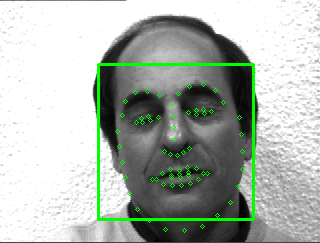

<class '_dlib_pybind11.vector'>
128
-0.193587
0.157833
0.0432411
-0.0783958
-0.170128
-0.0130699
-0.0851414
-0.0955404
0.123158
-0.0849763
0.226275
-0.00235602
-0.156115
-0.0399969
-0.0477976
0.142029
-0.15888
-0.117538
-0.0956909
-0.106217
0.0465363
0.0176341
-0.00355873
0.0723187
-0.194831
-0.27615
-0.106073
-0.0736536
0.11521
-0.0432612
-0.107223
0.00348422
-0.186808
-0.103475
0.0402322
0.07935
0.0391479
0.0114105
0.110189
-0.00480095
-0.126502
0.0991851
0.144103
0.294197
0.196521
0.115845
0.0794135
-0.0679365
0.0610997
-0.182282
0.0283902
0.130014
0.102217
0.0501379
0.0564232
-0.123222
0.0104852
0.119838
-0.155055
0.108459
0.10469
-0.0326788
-0.0717809
-0.0560825
0.254562
0.149008
-0.118798
-0.175747
0.146448
-0.164997
-0.106543
0.0296345
-0.112883
-0.0900623
-0.297435
0.0270642
0.468398
0.216052
-0.204834
0.0381031
-0.0824519
-0.0130104
0.0844353
0.0454364
-0.106932
-0.0358924
-0.11743
0.0467617
0.232906
0.0213173
0.0288349
0.167776
0.12195
0.0115397
0.00606339
0.0980914
-0.198712

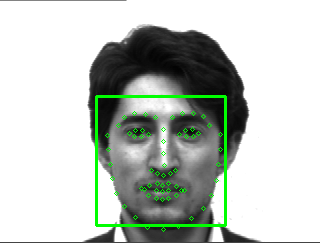

<class '_dlib_pybind11.vector'>
128
-0.13552
0.102612
-0.0295342
-0.0629558
-0.217563
-0.0623724
0.000603262
-0.045178
0.11949
-0.0350541
0.210355
-0.0813405
-0.21364
-0.0185272
-0.0271144
0.137255
-0.20739
-0.0813297
-0.164093
-0.0655998
0.0555568
0.0642388
-0.0128967
0.042553
-0.0880684
-0.293949
-0.066211
-0.0864269
0.0835216
-0.106794
0.00787667
0.118047
-0.166728
-0.0797915
0.0362943
0.039048
-0.0478101
-0.0943941
0.19869
-0.0106297
-0.224896
0.0238827
0.0608464
0.234663
0.25169
-0.0713169
0.00770484
-0.0817268
0.0963586
-0.246114
-0.00192494
0.165667
0.0816462
0.0416504
0.0355933
-0.0853969
0.00436646
0.157615
-0.193789
-0.0415775
0.113722
-0.156064
-0.0746657
-0.0773627
0.140276
0.116592
-0.085621
-0.154591
0.147127
-0.148313
-0.0667805
0.0941528
-0.0895084
-0.131725
-0.281418
0.0262374
0.439723
0.106792
-0.13691
0.0288319
-0.0823813
-0.0601144
0.0398836
0.0645491
-0.121829
-0.0544719
-0.122557
0.124724
0.173627
-0.0443969
0.0119047
0.202348
0.0572218
-0.0166362
0.0635305
0.0773

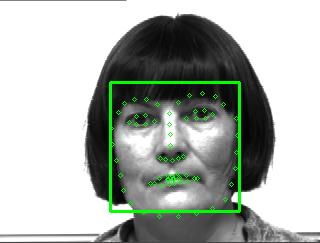

<class '_dlib_pybind11.vector'>
128
-0.1718
0.107427
0.114988
-0.0252042
-0.000573717
-0.0490063
-0.00204132
-0.045132
0.099404
0.00892518
0.225337
-0.0289663
-0.195293
-0.0950909
0.0238695
0.111143
-0.11342
-0.093603
-0.12825
-0.130447
0.0257556
0.0134819
0.01051
0.0358412
-0.146356
-0.297699
-0.0837842
-0.155285
0.0169558
-0.130852
-0.0296368
-0.0295754
-0.219704
-0.0304578
-0.0749762
-0.013935
0.0403969
-0.0679857
0.109496
-0.0149311
-0.128632
0.00756128
0.0982989
0.180883
0.20121
0.0395515
0.0302078
-0.0241278
0.00606883
-0.162757
0.126679
0.0551726
0.1153
0.0648957
0.0395354
-0.129446
-0.0550592
-0.00458546
-0.0951862
0.0836559
0.0514896
-0.0596595
-0.122239
-0.0248418
0.204649
0.120456
-0.0993158
-0.109032
0.10352
-0.141036
-0.0300815
0.0811723
-0.09569
-0.104644
-0.28027
0.153764
0.422524
0.0989469
-0.215949
0.00174656
-0.161121
-0.0252296
0.0300272
0.0612025
-0.0951255
-0.00115733
-0.103864
0.0796522
0.193299
0.0104534
-0.0475707
0.17863
-0.00112542
0.0087421
-0.0187211
0.04014

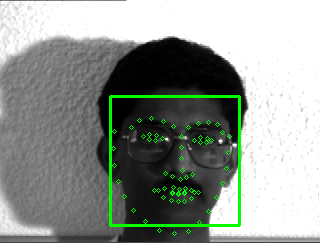

<class '_dlib_pybind11.vector'>
128
-0.120178
0.044364
-0.0106268
0.0279334
-0.0632259
-0.0429931
-0.00498378
-0.107342
0.155541
-0.0344535
0.162011
-0.0470813
-0.272714
-0.0223629
-0.0608062
0.121297
-0.115134
-0.0708125
-0.15531
-0.133762
0.0188857
-0.0115477
0.0552214
0.0216204
-0.164621
-0.227372
-0.0548072
-0.150529
0.0162653
-0.103628
-0.100734
0.00412571
-0.290377
-0.176325
-0.0175852
0.0461614
-0.0400786
-0.0376949
0.22963
0.0638663
-0.121794
0.127271
0.115657
0.233486
0.306604
0.0105605
-0.0347707
-0.0931797
0.171802
-0.328822
0.0728622
0.143526
0.195073
0.105779
0.100981
-0.112726
-0.018701
0.0862842
-0.166251
0.141402
0.12124
0.00963354
-0.0238299
-0.0675348
0.14716
0.0938071
-0.0836567
-0.0613695
0.190171
-0.135192
-0.0174374
0.0663203
-0.0813609
-0.222358
-0.281286
0.113405
0.380288
0.217091
-0.17206
0.0159371
-0.15975
-0.0800753
-0.0173366
-0.0253166
0.0139754
-0.0780075
-0.0495646
0.0683718
0.224413
-0.0242948
0.00198763
0.239952
0.0138034
-0.0119284
0.00025267
0.108596


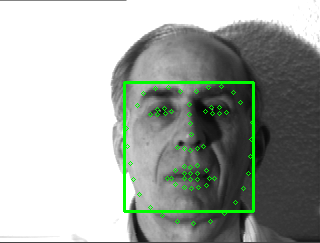

<class '_dlib_pybind11.vector'>
128
-0.215696
0.160929
0.00407424
-0.0832541
-0.148935
-0.0245488
-0.0498697
-0.0172763
0.108019
-0.0285642
0.265449
-0.0568962
-0.300549
-0.143063
0.0695152
0.145612
-0.0722284
-0.0476975
-0.155503
-0.095655
0.045973
0.04587
0.0464184
0.00830537
-0.178649
-0.286001
-0.0914021
-0.0150646
0.0552131
-0.151559
0.0416161
0.00513978
-0.200426
-0.115658
0.0160805
0.122911
-0.156615
-0.0687543
0.143945
-0.0677463
-0.164457
-0.0116196
0.12463
0.222467
0.212297
0.0274461
0.026792
-0.0638058
0.0797262
-0.270743
0.0308837
0.133807
0.106685
0.0876661
0.121346
-0.0806622
-7.26581e-05
0.246203
-0.192048
0.015059
0.0592546
-0.0311803
-0.131589
-0.112755
0.224
0.1442
-0.178738
-0.171961
0.168608
-0.134656
-0.0588075
0.184985
-0.0498358
-0.195111
-0.30002
0.0919286
0.307442
0.134967
-0.159697
-0.00888982
-0.0450286
-0.0081561
-0.0391139
0.00484253
-0.11634
-0.0659487
-0.0945536
0.0123114
0.194992
-0.0369856
0.0206703
0.246972
0.118193
0.0226951
0.0286793
0.0732484
-0.126

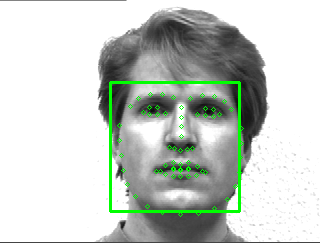

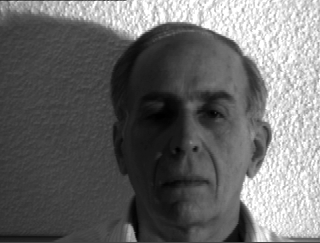

<class '_dlib_pybind11.vector'>
128
-0.0221272
0.0981916
-0.00799441
-0.021217
-0.0320744
-0.0434765
0.0216619
-0.0513676
0.202057
-0.0566187
0.193875
-0.0479702
-0.235374
-0.0496962
-0.0486276
0.141355
-0.122266
-0.0913829
-0.12804
-0.133174
0.0579369
0.0544563
-0.00543326
-0.0191992
-0.194165
-0.253051
-0.109216
-0.106063
0.0804329
-0.0666598
0.0519372
0.121002
-0.220115
-0.0824091
0.078466
0.0269821
-0.0277767
0.019554
0.22229
0.123857
-0.117286
0.138382
0.029992
0.279424
0.154658
0.0280216
0.0208481
-0.100365
0.0839163
-0.21775
0.0329374
0.172268
0.158494
0.0993273
0.126584
-0.139953
0.00663507
0.0647758
-0.223189
0.143148
0.0837537
-0.0623582
-0.0407068
-0.0597301
0.124784
0.0500879
-0.114685
-0.0815021
0.262953
-0.133115
0.021235
0.112491
-0.0820976
-0.136661
-0.294066
0.0527426
0.446853
0.18017
-0.164537
-0.0226223
-0.0715505
-0.0262989
-0.00638673
0.0278813
-0.121871
-0.0546941
-0.00813189
0.0850636
0.174817
0.0215061
-0.0633678
0.225805
-0.000470564
0.0663178
-0.0251859
-0.011

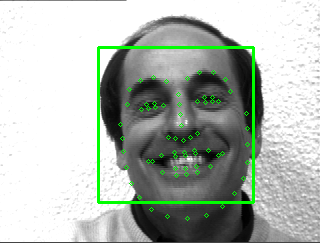

<class '_dlib_pybind11.vector'>
128
-0.14308
0.114505
-0.0278668
-0.0518361
-0.217608
-0.042073
-0.0051053
-0.0449247
0.124911
-0.0131976
0.208524
-0.0808052
-0.220406
-0.0543619
-0.0204883
0.146552
-0.205655
-0.0649185
-0.164958
-0.071825
0.0549994
0.0821108
-0.00767102
0.0220331
-0.0990031
-0.326941
-0.0751115
-0.102135
0.073224
-0.131968
0.00167035
0.0931497
-0.185262
-0.0972355
0.0129415
0.0368221
-0.0596704
-0.100702
0.187298
-0.00421166
-0.208834
0.0389533
0.0780201
0.22858
0.251721
-0.0593525
0.00383955
-0.0813398
0.0840144
-0.200166
0.0112482
0.15746
0.10277
0.0597488
0.0405022
-0.064361
0.0258591
0.141819
-0.201817
-0.038926
0.138639
-0.147737
-0.0677098
-0.043895
0.155786
0.103852
-0.0608431
-0.144046
0.147099
-0.149358
-0.0761354
0.0639006
-0.0875264
-0.132391
-0.311958
0.0443169
0.417271
0.122353
-0.170585
0.0147323
-0.0676048
-0.0593103
0.0678302
0.0782212
-0.127841
-0.0554997
-0.128801
0.126652
0.172101
-0.0239657
0.0146635
0.221961
0.0834074
-0.014849
0.0759196
0.0566301

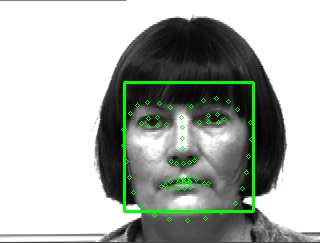

<class '_dlib_pybind11.vector'>
128
-0.104318
0.123909
0.0995959
0.013031
-0.072876
-0.0622725
-0.0338777
-0.129606
0.102925
-0.0352339
0.239919
-0.047854
-0.153334
-0.109457
0.0419466
0.142416
-0.17685
-0.0923314
-0.0510096
-0.0720613
0.003302
-0.000581091
0.0763601
-0.0294821
-0.0699724
-0.362872
-0.0723591
-0.152526
0.0916268
-0.100477
-0.114141
0.0374895
-0.213801
-0.0573844
-0.0483642
0.0896316
0.000672914
-0.0385989
0.166189
-0.0126204
-0.177344
-0.0267182
-0.00342791
0.214544
0.238753
0.0250025
0.0122461
-0.0211694
0.0342673
-0.117586
0.0426422
0.083694
0.0798836
0.0349929
-0.0774541
-0.128385
-0.0232858
0.0028914
-0.128977
-0.024925
0.122707
-0.131083
-0.116933
-0.00568989
0.298718
0.0887706
-0.0903154
-0.125209
0.0746683
-0.13506
-0.0547878
0.00704421
-0.165956
-0.0925962
-0.328633
0.0665228
0.346812
0.00315297
-0.192794
0.00934698
-0.111103
0.0028735
0.0915673
0.132598
-0.0578854
0.0825888
-0.126754
0.0301949
0.168367
-0.0936996
-0.0353532
0.167956
-0.0543063
0.101693
-0.0041

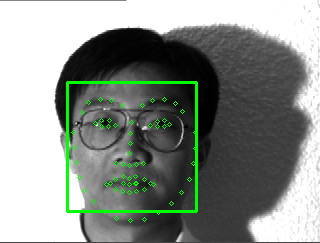

<class '_dlib_pybind11.vector'>
128
-0.148126
0.130193
0.00518901
-0.103737
-0.0783931
-0.0221857
-0.0632443
-0.0141418
0.0833891
-0.0290723
0.237352
-0.0503695
-0.312962
-0.0600558
-0.0473785
0.165981
-0.0968407
-0.0713516
-0.182207
-0.105104
0.0617581
0.0187446
0.0256918
0.0424097
-0.157173
-0.22044
-0.0523668
-0.0434975
0.0189721
-0.119029
-0.00492558
-0.0154715
-0.196629
-0.0557921
0.00722226
0.101045
-0.115191
-0.119249
0.18707
0.037103
-0.129429
-0.0205986
0.0839378
0.220755
0.168987
0.0489278
-0.00138669
-0.0141571
0.0522095
-0.305128
0.0840058
0.134823
0.132245
0.117211
0.0954168
-0.141698
0.0745136
0.16187
-0.196324
0.011943
0.0281237
-0.094212
-0.0950357
-0.101662
0.204071
0.169306
-0.119808
-0.0847536
0.240785
-0.0947866
-0.082404
0.0502196
-0.0548039
-0.175145
-0.293995
0.07877
0.309834
0.25362
-0.180211
0.0248547
-0.0301432
0.0111818
0.0167975
-0.0238951
-0.133557
-0.00655738
-0.0807165
0.0151411
0.166109
-0.0239601
-0.0707594
0.206136
0.0808934
0.0163949
0.0816114
-0.0169

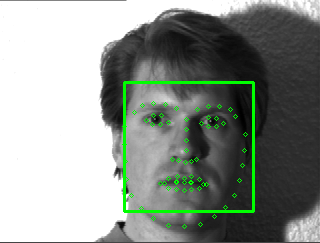

<class '_dlib_pybind11.vector'>
128
-0.155421
0.150279
0.0424418
-0.0973492
-0.147617
-0.0148591
-0.00200619
-0.0475706
0.134809
-0.00950094
0.287399
-0.0458189
-0.261936
-0.146923
0.018055
0.09763
-0.0573329
-0.0359985
-0.1271
-0.0930183
0.0312586
0.00531764
0.0734462
0.00916813
-0.149744
-0.24926
-0.106519
-0.0287962
0.0290366
-0.181687
0.0327847
0.0380447
-0.230445
-0.174873
-0.0123084
0.113722
-0.131579
-0.0593229
0.148283
-0.0413298
-0.10561
0.0748601
0.112221
0.252666
0.263198
0.0395099
-0.0155172
-0.0684197
0.116405
-0.258765
0.0664011
0.113376
0.197799
0.0150366
0.13604
-0.0340911
-0.0114345
0.142391
-0.149283
0.0359182
0.0795954
-0.0242233
-0.123167
-0.146449
0.195413
0.111035
-0.152703
-0.098042
0.202442
-0.0862123
-0.0717114
0.151904
-0.0929911
-0.142873
-0.291783
0.125381
0.363174
0.115176
-0.191705
-0.0335438
-0.0723745
0.00493885
-0.11252
0.0193022
-0.12489
-0.0848718
-0.0879307
0.0480745
0.169838
-0.0428915
-0.0239587
0.237819
0.0924947
0.0404966
0.026491
0.0373004
-0.11

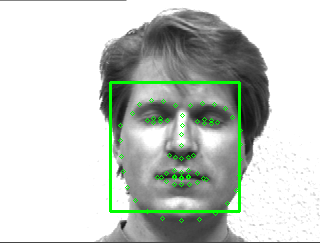

<class '_dlib_pybind11.vector'>
128
-0.125144
0.1692
0.0330023
-0.0467287
-0.0903766
-0.000872985
-0.0939709
-0.00320603
0.126164
-0.0146107
0.249812
-0.0227877
-0.303184
-0.10424
0.0328525
0.144249
-0.104388
-0.048466
-0.127504
-0.0915348
0.00083857
0.00762788
0.0424138
-0.0116637
-0.164603
-0.291812
-0.130204
-0.067991
0.0434873
-0.126702
0.0127632
-0.031687
-0.15382
-0.100563
0.0248924
0.122935
-0.16441
-0.110647
0.219145
-0.0382703
-0.0966995
0.0481319
0.129904
0.211029
0.235057
0.0587976
0.0525244
-0.0819426
0.0691351
-0.305018
0.0945912
0.159818
0.14223
0.150566
0.101106
-0.144205
0.0446326
0.217225
-0.202186
0.0278861
0.0488642
-0.049166
-0.100316
-0.0332006
0.233793
0.165497
-0.156204
-0.0965146
0.168318
-0.154462
-0.0260325
0.0971861
-0.0605552
-0.219494
-0.283447
0.154054
0.346887
0.189929
-0.158643
0.0238219
-0.015513
-0.0502264
-0.0345932
0.0294501
-0.164368
-0.120905
-0.0666748
0.0294105
0.194345
-0.0329442
0.0493078
0.208056
0.103047
0.0572953
0.0488038
0.033103
-0.086761

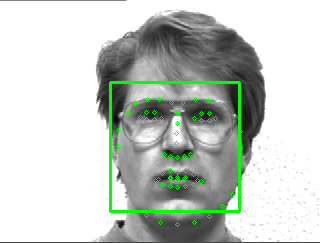

<class '_dlib_pybind11.vector'>
128
-0.0999546
0.0272547
0.0405578
-0.0254214
-0.0198742
-0.054307
0.0560486
-0.0856602
0.239143
-0.0771267
0.195959
-0.0206432
-0.223063
-0.138649
0.0154582
0.10117
-0.169916
-0.130274
-0.0621612
-0.122942
0.0270151
0.010953
0.060441
0.00868344
-0.205621
-0.352361
-0.0987241
-0.1598
-0.0218197
-0.0971996
-0.00705923
0.0545335
-0.245878
-0.124052
-0.103396
0.0386864
-0.0442291
-0.0375915
0.134437
0.0321724
-0.115883
-0.0123475
0.00496937
0.29123
0.103065
0.0108972
-0.00125257
0.0175157
0.0142457
-0.267293
0.0626209
0.109907
0.0341968
0.0315281
0.0461195
-0.0539657
-0.0113682
0.0527074
-0.209012
0.0793296
0.0858556
0.00118191
-0.0550214
0.0177711
0.234535
0.131712
-0.0784616
-0.00876833
0.105201
-0.136039
0.00887274
0.00374619
-0.0993775
-0.198652
-0.274213
0.0955432
0.396018
0.0937471
-0.128536
-0.0162306
-0.182415
0.00275016
0.0854198
-0.0321814
-0.0742649
0.0848787
-0.151512
0.120739
0.155168
-0.00754362
-0.0568727
0.248122
0.0341199
-0.027695
0.060910

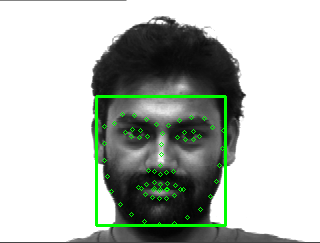

<class '_dlib_pybind11.vector'>
128
-0.0139036
0.0939757
0.0818539
0.0306174
-0.0292288
-0.04583
-0.0457861
-0.0803236
0.212345
-0.0348055
0.182183
-0.00671228
-0.255911
0.0135359
-0.101834
0.162799
-0.0513458
-0.062646
-0.190037
-0.152043
0.0324874
0.109062
0.0463586
-0.0341929
-0.161448
-0.258165
-0.089015
-0.0765403
0.0848361
-0.0846367
-0.0107584
0.0927053
-0.164342
-0.0861135
0.0570383
0.00775322
-0.0417825
-0.0356567
0.239209
0.123741
-0.1512
0.181567
0.0169011
0.261591
0.132956
0.0364275
0.0813958
-0.12752
0.0432573
-0.220977
0.0365118
0.19159
0.0987733
0.0740112
0.133053
-0.14531
-0.0126189
0.140763
-0.223988
0.173924
0.12481
-0.0360724
-0.0655039
-0.0181448
0.0809366
0.0979903
-0.109969
-0.0857139
0.197196
-0.130721
0.0416583
0.133566
-0.081608
-0.172867
-0.232395
0.0705077
0.479709
0.139145
-0.17403
-0.0287484
-0.0570313
-0.0258431
0.0394637
0.00385453
-0.111697
-0.092491
-0.0263126
0.0555682
0.174805
0.0538725
-0.0296795
0.238822
0.0600656
-0.0124975
-0.036391
0.0799382
-0.1

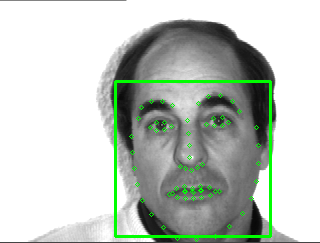

<class '_dlib_pybind11.vector'>
128
-0.141854
0.0859803
0.0376447
-0.0241313
-0.0526576
-0.0786473
-0.0319615
-0.0442647
0.184022
-0.00653194
0.299579
-0.00150828
-0.209581
-0.0136226
-0.0476885
0.128972
-0.188131
0.00443931
-0.140286
-0.0948099
0.0482823
0.0271098
0.0242316
-0.0151239
-0.157194
-0.329596
-0.121592
-0.0718397
0.0320525
-0.125948
-0.00336713
0.0816748
-0.202149
-0.092547
-1.86786e-05
0.0111727
-0.066931
-0.0683188
0.179569
0.0519794
-0.112515
0.086696
0.109304
0.245259
0.22162
0.0285878
0.014208
-0.0948115
0.020899
-0.232737
0.0978791
0.145629
0.0580011
0.096615
0.148081
-0.195379
-0.0132864
0.0690464
-0.127332
0.0698164
0.088857
-0.024563
-0.0325951
-0.056665
0.112619
0.121671
-0.0950495
-0.0982491
0.0821672
-0.0863693
0.0364437
0.0695428
-0.126014
-0.242739
-0.297474
0.139823
0.412941
0.139159
-0.133468
0.0187416
-0.0663038
-0.116914
0.0660505
0.00542489
-0.0888297
-0.0997051
-0.0851343
0.110952
0.154445
0.0250034
-0.0258647
0.203801
-0.0434299
-0.0395106
-0.00540744


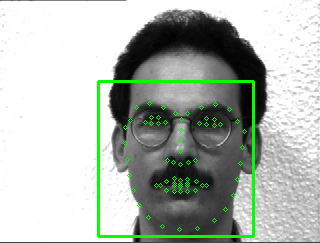

<class '_dlib_pybind11.vector'>
128
-0.095979
0.10377
0.0127064
-0.062475
-0.0722293
-0.0328192
-0.000368077
-0.0790271
0.131768
-0.0315026
0.195626
-0.021087
-0.212056
-0.0869883
0.000893287
0.134279
-0.140525
-0.13967
-0.0948852
-0.10714
0.00880056
-0.0217221
0.002814
0.052415
-0.186797
-0.316441
-0.149421
-0.14826
0.0397738
-0.152395
-0.0762729
-0.01035
-0.231756
-0.0573747
-0.0314517
0.0399494
-0.0727747
-0.126369
0.143946
0.0846091
-0.122765
0.0381868
0.0958114
0.213945
0.195664
0.0323784
0.0314064
0.0247944
0.0437148
-0.202675
0.122971
0.110272
0.128788
0.105152
0.0773397
-0.105449
-0.0147639
0.0437096
-0.12322
0.0692007
0.0492408
-0.0884784
-0.0851183
-0.0412687
0.188815
0.156684
-0.0544114
-0.0886257
0.136833
-0.161236
-0.0697689
-0.00253385
-0.0907594
-0.105721
-0.263517
0.125631
0.365929
0.191099
-0.155836
0.0147341
-0.114796
-0.0479352
-0.0120625
0.0155365
-0.105432
0.00329399
-0.1291
0.059891
0.208473
-0.0191876
-0.00116818
0.17825
-0.0430175
0.027262
0.0218157
-0.00246558


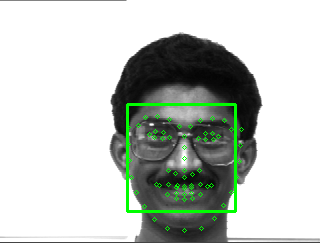

<class '_dlib_pybind11.vector'>
128
-0.156591
0.0337141
-0.00618133
-0.0202325
-0.146191
-0.00982732
-0.0373488
-0.0398198
0.109144
-0.117337
0.0880305
-0.10118
-0.247672
0.0304807
-0.0307202
0.132301
-0.113432
-0.160592
-0.187208
-0.119891
0.0626407
0.0266002
-0.0500168
0.0530031
-0.163636
-0.313277
-0.0393777
-0.0943361
0.0133882
-0.0873821
-0.0773402
0.0241787
-0.207184
-0.0797995
0.0361131
0.00198758
0.00313845
-0.0236264
0.182368
0.0238057
-0.177092
0.0225562
0.0728618
0.285402
0.103639
0.140702
-0.00111361
-0.033394
0.111884
-0.296291
0.106094
0.157982
0.0579974
0.0109134
0.0969642
-0.140945
0.00284111
0.0864288
-0.191116
0.147176
0.124112
-0.0285452
-0.0952136
-0.111378
0.219079
0.139333
-0.0921441
-0.112233
0.173271
-0.15059
-0.0202288
-0.0247284
-0.0667225
-0.169381
-0.233078
0.0340384
0.456183
0.177755
-0.164158
0.0192346
-0.056406
-0.0401509
0.115324
2.91318e-05
-0.125345
0.00641179
-0.0408406
0.104204
0.228169
0.0243465
-0.00882288
0.215644
0.0503854
-0.0762411
0.0358388
0.

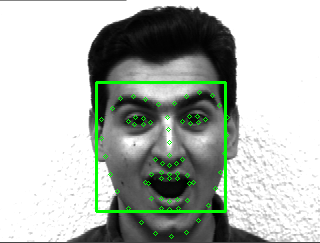

<class '_dlib_pybind11.vector'>
128
-0.118849
0.124451
0.0313952
-0.0381341
-0.170515
-0.107932
0.0125872
-0.140439
0.10786
-0.0271085
0.210276
-0.0669494
-0.23975
-0.0556704
0.0111011
0.143885
-0.174443
-0.119582
-0.146581
-0.0352565
0.04798
0.0867815
0.0389138
0.0585737
-0.116477
-0.31527
-0.00544014
-0.106932
0.0192511
-0.054341
-0.0222888
0.106198
-0.198308
-0.03986
0.0485715
0.106782
-0.103332
-0.114279
0.1897
-0.0147936
-0.279525
-0.0422157
0.00244384
0.198641
0.259926
-0.105701
0.0236732
-0.113216
0.132361
-0.263738
0.00488396
0.163933
0.00695329
0.0490376
0.0554125
-0.130594
0.0189971
0.13523
-0.229687
-0.0733438
0.0992589
-0.157742
-0.0283202
-0.0801923
0.138447
0.0959897
-0.0883116
-0.104155
0.121203
-0.168631
-0.0681243
0.104648
-0.095566
-0.196213
-0.328246
0.00474571
0.435991
0.131525
-0.143632
0.0115639
-0.082939
-0.0279182
0.0884123
0.0505311
-0.0748672
0.0221409
-0.164668
0.0957132
0.198781
-0.0635054
-0.0258356
0.249168
0.000360936
0.00231285
0.0747984
0.073539
-0.0818

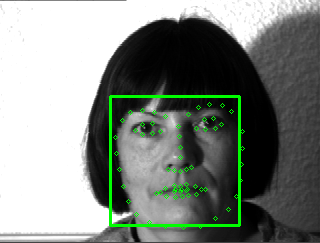

<class '_dlib_pybind11.vector'>
128
-0.21036
0.101087
0.0780611
-0.0832829
-0.045576
-0.113731
-0.0152187
-0.138298
0.150531
-0.100675
0.316883
-0.098797
-0.194811
-0.141978
-0.0468147
0.198314
-0.22014
-0.111053
-0.0237361
-0.0106396
0.134637
-0.03845
0.0368398
0.0468474
-0.141249
-0.31062
-0.137788
-0.107302
-0.04268
-0.0464942
-0.020678
-0.0242923
-0.213987
-0.098105
-0.0200701
0.0476265
-0.0321731
-0.0454333
0.177099
-0.00456617
-0.193264
0.00230862
0.0641887
0.228741
0.194917
0.0250243
0.0258465
-0.180551
0.084118
-0.127155
-0.00448722
0.133798
0.0846209
0.0343218
0.00672391
-0.0516957
-0.00594041
0.1327
-0.141483
0.00298984
0.123989
-0.0567674
-0.110924
-0.12398
0.22601
0.0733339
-0.16748
-0.161963
0.161417
-0.0882003
-0.0925009
0.080468
-0.151994
-0.209442
-0.294712
0.0238888
0.370009
0.0441047
-0.187714
0.0300279
-0.118657
-0.00261478
0.0748023
0.160648
0.00557545
0.0638551
-0.0753014
0.00541703
0.155648
-0.0758695
0.0153005
0.230807
-0.00186653
0.0553388
0.0154629
0.0137982
-0

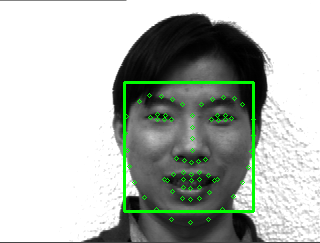

In [ ]:
for path in paths:
  image = Image.open(path).convert('RGB') #RGB
  image_np = np.array(image, 'uint8') #integer
  face_detections = face_detector(image_np, 1)
  for face in face_detections: #detecting images
    l,t,r,b = face.left(), face.top(), face.right(), face.bottom()
    cv2.rectangle(image_np, (l,t), (r,b), (0,255,0), 2)
    points = points_detectors(image_np, face)  #getting 68 points
    for point in points.parts():
      cv2.circle(image_np, (point.x, point.y), 2, (0,255,0), 1)
    face_descriptor = face_descriptor_extractor.compute_face_descriptor(image_np, points)
    print(type(face_descriptor))
    print(len(face_descriptor))
    print(face_descriptor)
    face_descriptor = [f for f in face_descriptor]
    face_descriptor = np.asarray(face_descriptor, dtype=np.float64)
    # face_descriptor = face_descriptor.reshape(1,-1)
    face_descriptor = face_descriptor[np.newaxis, :]
    print(face_descriptor.shape)
    if face_descriptors is None:
      face_descriptors = face_descriptor
    else:
      face_descriptors = np.concatenate((face_descriptors, face_descriptor), axis=0)
    index[idx] = path
    idx +=1
  cv2_imshow(image_np)

In [ ]:
face_descriptors.shape

(132, 128)

In [ ]:
len(index)

132

In [ ]:
index

{0: '/content/yalefaces/train/subject12.glasses.gif',
 1: '/content/yalefaces/train/subject13.leftlight.gif',
 2: '/content/yalefaces/train/subject07.sad.gif',
 3: '/content/yalefaces/train/subject07.glasses.gif',
 4: '/content/yalefaces/train/subject03.noglasses.gif',
 5: '/content/yalefaces/train/subject03.wink.gif',
 6: '/content/yalefaces/train/subject09.surprised.gif',
 7: '/content/yalefaces/train/subject14.noglasses.gif',
 8: '/content/yalefaces/train/subject04.rightlight.gif',
 9: '/content/yalefaces/train/subject10.happy.gif',
 10: '/content/yalefaces/train/subject15.happy.gif',
 11: '/content/yalefaces/train/subject10.sleepy.gif',
 12: '/content/yalefaces/train/subject02.noglasses.gif',
 13: '/content/yalefaces/train/subject09.noglasses.gif',
 14: '/content/yalefaces/train/subject02.surprised.gif',
 15: '/content/yalefaces/train/subject08.wink.gif',
 16: '/content/yalefaces/train/subject06.sleepy.gif',
 17: '/content/yalefaces/train/subject13.glasses.gif',
 18: '/content/yale

### Calculating distance between faces

In [ ]:
np.linalg.norm(face_descriptors[0] - face_descriptors[1])

0.800278602697047

In [ ]:
np.linalg.norm(face_descriptors[0] - face_descriptors[0])

0.0

In [ ]:
np.linalg.norm(face_descriptors[131] - face_descriptors[130])

0.7030351014138693

In [ ]:
np.linalg.norm(face_descriptors[131] - face_descriptors[129])

0.8292434520418758

In [ ]:
np.linalg.norm(face_descriptors[131] - face_descriptors[128])

0.7440689200039116

In [ ]:
np.linalg.norm(face_descriptors[131] - face_descriptors, axis =1) #calculate the distance from 131 and all faces

array([0.92212825, 0.75196077, 0.73594584, 0.70345923, 0.76662465,
       0.76717508, 0.78549474, 0.44914762, 0.39253763, 0.69421293,
       0.7724824 , 0.69951327, 0.74893732, 0.79704042, 0.81012662,
       0.6080632 , 0.45341269, 0.75492863, 0.59738939, 0.59524144,
       0.51263707, 0.72393309, 0.81778153, 0.80676364, 0.72001909,
       0.74539306, 0.77724632, 0.88701236, 0.7222132 , 0.74024354,
       0.7907995 , 0.59362316, 0.77280923, 0.75871744, 0.85348817,
       0.87470347, 0.64687075, 0.84592997, 0.78036303, 0.7805686 ,
       0.76500223, 0.79518327, 0.81238271, 0.5272459 , 0.74868718,
       0.44354147, 0.82269071, 0.87081878, 0.88922154, 0.7951549 ,
       0.69604534, 0.41505175, 0.72252207, 0.78521387, 0.62323543,
       0.46474104, 0.64952216, 0.79032806, 0.70664815, 0.90744751,
       0.88857144, 0.67209907, 0.75510202, 0.44944272, 0.60965179,
       0.729751  , 0.72285126, 0.54308772, 0.79880548, 0.71087873,
       0.45256085, 0.84995744, 0.49654444, 0.8860455 , 0.52307

In [ ]:
np.argmin(np.linalg.norm(face_descriptors[131] - face_descriptors, axis =1)) #index of the face with the smallest distance

131

In [ ]:
np.argmin(np.linalg.norm(face_descriptors[131] - face_descriptors[1:], axis =1)) #index of the face with the smallest distance

130

### Detecting faces with Dlib

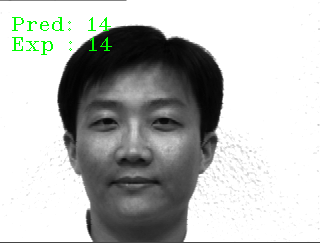

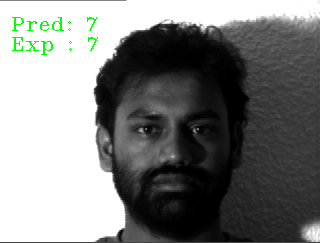

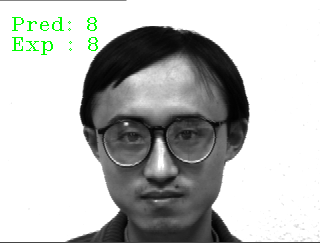

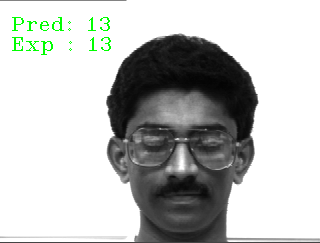

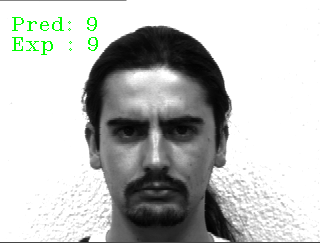

...

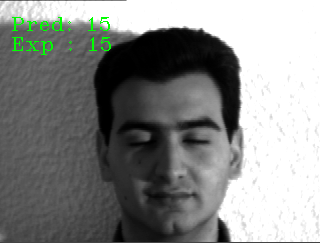

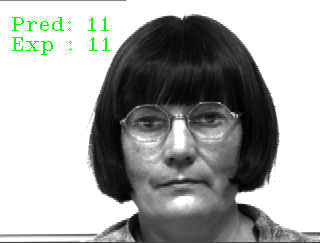

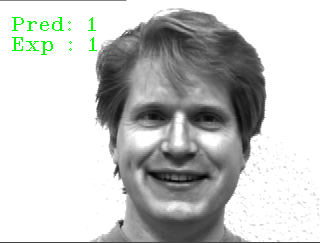

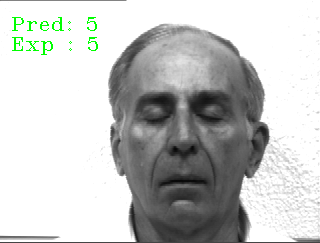

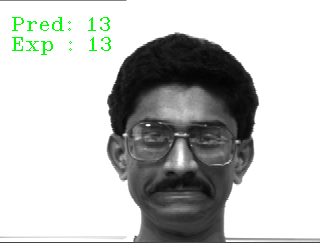

In [ ]:
threshold = 0.5
predictions = []
expected_outputs = []

paths = [os.path.join('/content/yalefaces/test', f) for f in os.listdir('/content/yalefaces/test')]
for path in paths:
  image = Image.open(path).convert('RGB')
  image_np = np.array(image, 'uint8')
  face_detection = face_detector(image_np, 1)
  for face in face_detection:
    points = points_detectors(image_np, face)
    face_descriptor = face_descriptor_extractor.compute_face_descriptor(image_np, points)
    face_descriptor = [f for f in face_descriptor]
    face_descriptor = np.asarray(face_descriptor, dtype=np.float64)
    face_descriptor = face_descriptor[np.newaxis, :]

    distances = np.linalg.norm(face_descriptor - face_descriptors, axis = 1)
    min_index = np.argmin(distances)
    min_distance = distances[min_index]
    if min_distance <= threshold:
      name_pred = int(os.path.split(index[min_index])[1].split('.')[0].replace('subject', ''))
    else:
      name_pred = 'Not identified'

    name_real = int(os.path.split(path)[1].split('.')[0].replace('subject', ''))

    predictions.append(name_pred)
    expected_outputs.append(name_real)

    cv2.putText(image_np, 'Pred: ' + str(name_pred), (10, 30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255,0))
    cv2.putText(image_np, 'Exp : ' + str(name_real), (10, 50), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255,0))


  cv2_imshow(image_np)

predictions = np.array(predictions)
expected_outputs = np.array(expected_outputs)

In [ ]:
predictions

array([14,  7,  8, 13,  9,  7,  2,  5,  3,  6, 11,  3,  6, 12, 15, 10,  9,
        4, 14,  1,  4,  8, 12, 10,  2, 15, 11,  1,  5, 13])

In [ ]:
expected_outputs

array([14,  7,  8, 13,  9,  7,  2,  5,  3,  6, 11,  3,  6, 12, 15, 10,  9,
        4, 14,  1,  4,  8, 12, 10,  2, 15, 11,  1,  5, 13])

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(expected_outputs, predictions)

1.0

#Homework

In [ ]:
import zipfile
import os
path = '/content/drive/MyDrive/Computer Vision Masterclass/Datasets/jones_gabriel.zip'
zip_object = zipfile.ZipFile(file=path, mode='r') # r means read
zip_object.extractall('./')
zip_object.close()

In [ ]:
paths = [os.path.join('./jones_gabriel', f) for f in os.listdir('./jones_gabriel')]
for path in paths:
  id = path.split('.')
  print(id)

['', '/jones_gabriel/person', '1', '22', 'jpg']
['', '/jones_gabriel/person', '1', '14', 'jpg']
['', '/jones_gabriel/person', '1', '9', 'jpg']
['', '/jones_gabriel/person', '1', '7', 'jpg']
['', '/jones_gabriel/person', '2', '21', 'jpg']
['', '/jones_gabriel/person', '2', '9', 'jpg']
['', '/jones_gabriel/person', '2', '18', 'jpg']
['', '/jones_gabriel/person', '1', '4', 'jpg']
['', '/jones_gabriel/person', '1', '1', 'jpg']
['', '/jones_gabriel/person', '2', '22', 'jpg']
['', '/jones_gabriel/person', '2', '23', 'jpg']
['', '/jones_gabriel/person', '2', '7', 'jpg']
['', '/jones_gabriel/person', '2', '12', 'jpg']
['', '/jones_gabriel/person', '1', '21', 'jpg']
['', '/jones_gabriel/person', '2', '10', 'jpg']
['', '/jones_gabriel/person', '2', '24', 'jpg']
['', '/jones_gabriel/person', '1', '8', 'jpg']
['', '/jones_gabriel/person', '2', '15', 'jpg']
['', '/jones_gabriel/person', '2', '6', 'jpg']
['', '/jones_gabriel/person', '2', '8', 'jpg']
['', '/jones_gabriel/person', '1', '25', 'jpg']
[

In [ ]:
def get_image_data(): #read images
  paths = [os.path.join('./jones_gabriel', f) for f in os.listdir('./jones_gabriel')]
  #print(paths)
  faces = [] #pixels
  ids = [] #name of classes (ids of classes)
  for path in paths:
    #print(path)
    image = Image.open(path).convert('L') #convert to grayscale (L single channel)
    #print(type(image))
    #to send to open cv we need to convert it to numpy array
    image_np = np.array(image, 'uint8') #uint8 is the type of the image
    #print(type(image_np))
    id = int(path.split('.')[2])
    print(id)
    ids.append(id)
    faces.append(image_np)
    #ids in list format so we need to convert it to numpy array
  return np.array(ids), faces

In [ ]:
ids, faces =get_image_data()

1
1
1
1
2
2
2
1
1
2
2
2
2
1
2
2
1
2
2
2
1
2
1
2
1
1
1
1
2
2
2
2
2
1
2
1
1
2
1
1
2
2
1
2
1
2
1
1
1
1


In [ ]:
lbph = cv2.face.LBPHFaceRecognizer_create(radius=4, neighbors=14, grid_x=9, grid_y=9)

# 8 -> 8* 8 = 64 histograms for each face
lbph.train(faces, ids)
lbph.write('lbph_classifier.yml')

In [ ]:
lbph_face_classifier = cv2.face.LBPHFaceRecognizer_create()
lbph_face_classifier.read('/content/lbph_classifier.yml')

In [ ]:
image = Image.open('/content/jones_gabriel/person.1.1.jpg').convert('L')
image.size

(220, 220)

1
1


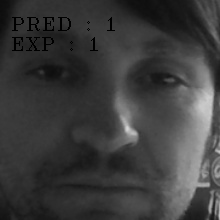

1
1


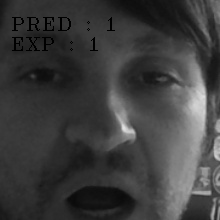

1
1


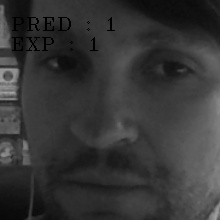

1
1


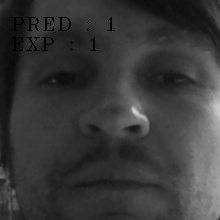

2
2


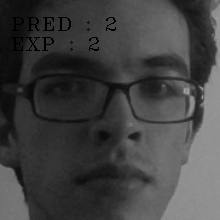

2
2


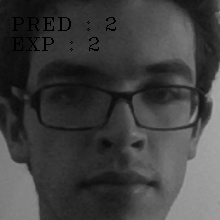

2
2


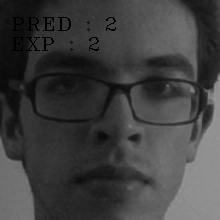

1
1


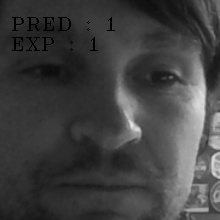

1
1


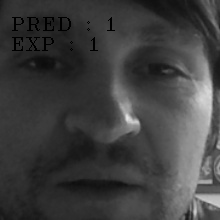

2
2


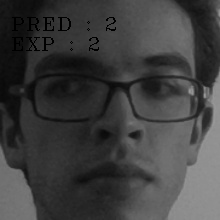

2
2


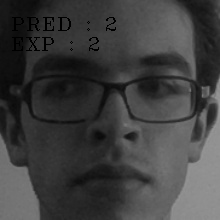

2
2


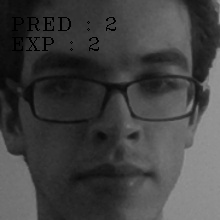

2
2


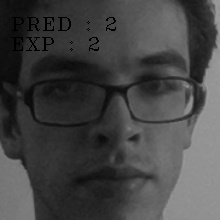

1
1


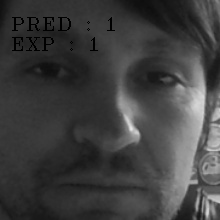

2
2


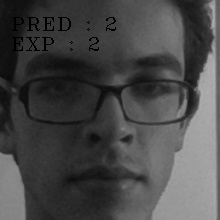

2
2


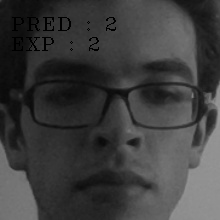

1
1


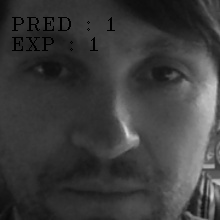

2
2


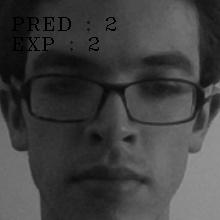

2
2


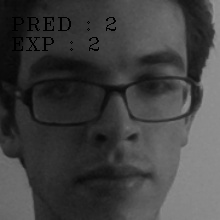

2
2


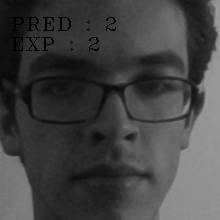

1
1


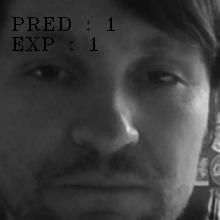

2
2


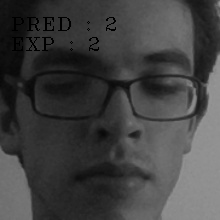

1
1


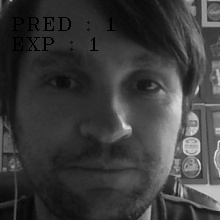

2
2


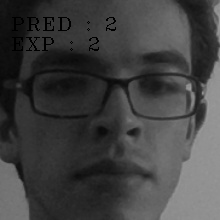

1
1


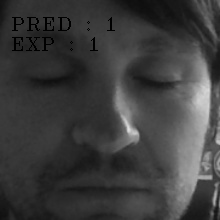

1
1


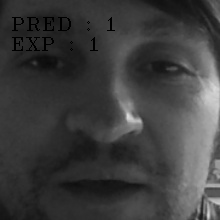

1
1


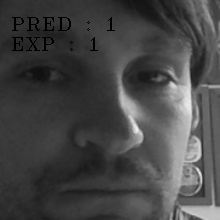

1
1


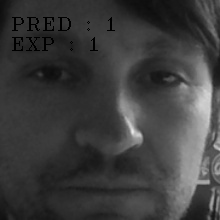

2
2


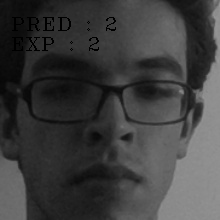

2
2


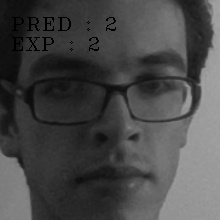

2
2


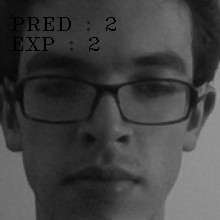

2
2


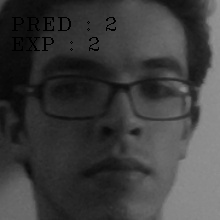

2
2


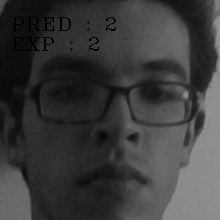

1
1


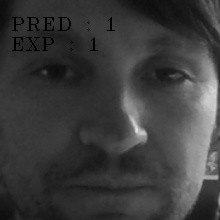

2
2


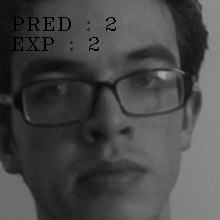

1
1


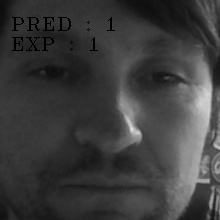

1
1


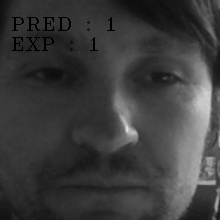

2
2


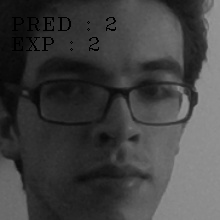

1
1


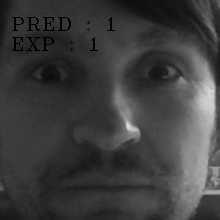

1
1


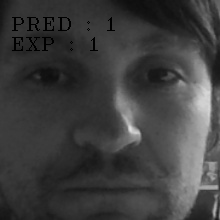

2
2


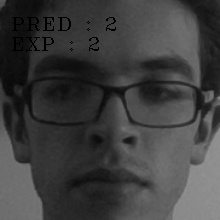

2
2


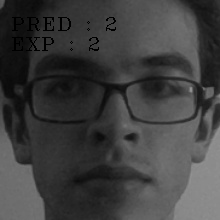

1
1


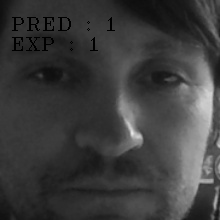

2
2


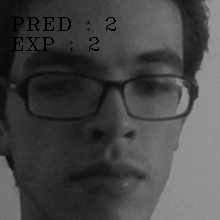

1
1


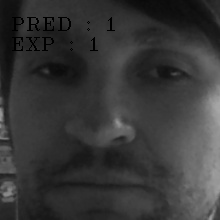

2
2


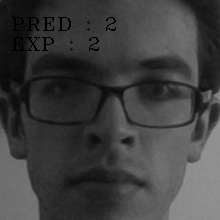

1
1


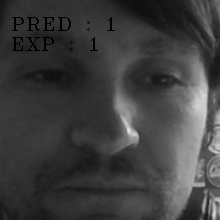

1
1


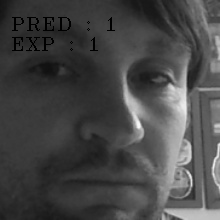

1
1


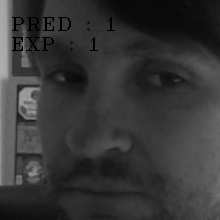

1
1


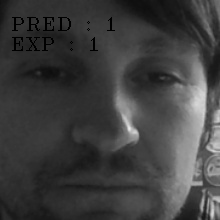

In [ ]:
paths = [os.path.join('/content/jones_gabriel', f) for f in os.listdir('/content/jones_gabriel')]
for path in paths:
  image = Image.open(path).convert('L')
  image_np = np.array(image, 'uint8')
  prediction , _= lbph_face_classifier.predict(image_np)
  print(prediction)

  expected_output = int(path.split('.')[1])
  print(expected_output)

  cv2.putText(image_np, 'PRED : ' + str(prediction), (10,30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255,0))
  cv2.putText(image_np, 'EXP : ' + str(expected_output), (10,50), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255,0))
  cv2_imshow(image_np)